# ToO simulations

In [1]:
# import necessary and useful packages
import os
import numpy as np
import matplotlib.pyplot as plt
import colorcet
import cycler
import pandas as pd
import rubin_sim.maf as maf

This notebook explores summary metric comparison across different simulations, when adding ToOs at various scopes.

Jump to comparison of metrics targeting: 
* [SCOC overview](#SCOC)
* [Science Requirements Document](#SRD)
* [DESC WFD coverage](#DESCWFD)
* [Transient and Variable Stars](#TVS)
* [Solar System Objects](#SSO)
* [Active Galactic Nuclei](#AGN)
* [Galaxies](#Galaxies)
* [Strong Lensing](#StrongLensing)
* [Stars](#Stars)
* [Milky Way and Local Volume](#MWLV)

## Get background information about summary statistics for the v3.4 runs

Read the information about the metric sets in this version of the sims outputs. The metric_sets defines groups of summary statistics that have been identified as likely relevant for comparing simulations for particular science purposes. 

In [2]:
metric_sets = maf.get_metric_subsets('metric_subsets.json')
msets = list(metric_sets.groupby('metric subset').first().index)

If you do not have the summary.h5 file on disk, you can download it from [sims_featureScheduler_runs3.4/maf/summary.h5 at USDF](https://s3df.slac.stanford.edu/data/rubin/sim-data/sims_featureScheduler_runs3.4/maf/summary.h5). 

In [4]:
summaries_33 = maf.get_metric_summaries(summary_source='../summary-33.h5')
print(f"This summary h5 file contains information on {len(summaries_33.index)} simulations.")
summaries_34 = maf.get_metric_summaries(summary_source='summary.h5')
print(f"This summary h5 file contains information on {len(summaries_34.index)} simulations.")

This summary h5 file contains information on 78 simulations.
This summary h5 file contains information on 262 simulations.


In [5]:
summaries = summaries_34 # pd.concat([summaries_33, summaries_34])
len(summaries)

262

Identify some subsets of runs that belong in common families, such as runs that were created for deep drilling field exploration or galactic plane coverage exploration. 

In [6]:
m5_SRD_design = {'u': 23.90, 'g': 25.00, 'r': 24.70, 'i': 24.00, 'z': 23.30, 'y': 22.10}
m5_SRD_minimum = {'u': 23.40, 'g':24.60, 'r': 24.30, 'i': 23.60, 'z': 22.90, 'y': 21.70}

# Weather variations on baseline strategy
weather_runs = [r for r in summaries.index if 'weather' in r]
offsets = [int(w.split('dso')[-1].split('v3')[0]) for w in weather_runs]
idx = np.argsort(offsets)
weather_runs = [weather_runs[i] for i in idx]
weather_runs
print("weather runs", len(weather_runs))

# DDF variations
ddf = [r for r in summaries.index if 'ddf_' in r]
ddf

# Rolling cadence variations
roll = [r for r in summaries.index if 'roll' in r and 'mw' not in r]
roll

# SMWLV variations
mw = [r for r in summaries.index if 'mw' in r or 'lmc' in r or 'reweight' in r or 'no_high_blob' in r]
mw

# u band variations
uband = [r for r in summaries.index if \
        # 'u_exp' in r or \
         'internal' in r]
uband_dict = {'u_exp_25_v3.3_10yrs': 'u 25s',
              'u_exp_30_v3.3_10yrs': 'u 30s',
              'u_exp_othershort_38_other29_v3.3_10yrs': 'u 38s +',
              'u_exp_40_v3.3_10yrs': 'u 40s',
               'u_exp_50_v3.3_10yrs': 'u 50s',
                'u_exp_60_v3.3_10yrs': 'u 60s',
             'baseline_v3.2_10yrs': 'v3.2',
             'baseline_v3.3_10yrs': 'v3.3'}
uband_shortname = [f"u {r.split('expt')[-1].split('_')[0]}s {r.split('nscale')[-1].split('v3.4')[0]}" for r in uband]
uband +=  ['u_exp_othershort_38_other29_v3.3_10yrs', 'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs']
uband_shortname += ['u 38s 1*', 'v3.2', 'v3.3']
uband_dict = {}
for u, us in zip(uband, uband_shortname):
    uband_dict[u] = us

too = [r for r in summaries.index if "too_combined" in r]
too_dict = dict(zip(too, too))

# Baseline sims, and put them in order of evolution
baselines = [r for r in summaries.index if 'baseline' in r]
versions = [float(r.split('_v')[-1].split('_10yrs')[0]) for r in baselines]
idx = np.argsort(versions)
baselines = [baselines[i] for i in idx]
# Rearrange to put retro first in list
tmp = baselines[0]
baselines[0] = baselines[1]
baselines[1] = tmp
# drop m2 baseline
baselines = baselines[:-1]

baseline_run = 'baseline_v3.3_10yrs'

baseline_dict = {'retro_baseline_v2.0_10yrs': 'v1.x', 
                 'baseline_v2.0_10yrs':'v2.0', 
                 'baseline_v2.1_10yrs':'v2.1',
                 'baseline_v2.2_10yrs':'v2.2',
                 'baseline_v3.0_10yrs':'v3.0',
                 'baseline_v3.2_10yrs':'v3.2',
                'baseline_v3.3_10yrs':'v3.3',
                'baseline_v3.4_10yrs': 'v3.4'
                }
baselines = list(baseline_dict.keys())
print(baselines)

outdir = 'tmp_fig'
try:
    os.mkdir(outdir)
except:
    pass

weather runs 16
['retro_baseline_v2.0_10yrs', 'baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs', 'baseline_v3.0_10yrs', 'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs', 'baseline_v3.4_10yrs']


In [124]:
too = [r for r in summaries.index if "too_combined" in r]
too = [
 'too_combined_s0.0_v3.4_10yrs',
 'too_combined_no_gw_s10.0_v3.4_10yrs',
 'too_combined_s0.5_v3.4_10yrs',
 'too_combined_s0.8_v3.4_10yrs',
 'too_combined_s1.0_v3.4_10yrs',
 'too_combined_s1.0_split_v3.4_10yrs',
 'too_combined_s1.5_v3.4_10yrs',
 'too_combined_s2.0_v3.4_10yrs',
 'too_combined_no_nss_s10.0_v3.4_10yrs'
]
too_dict = dict(zip(too, too))
too

['too_combined_s0.0_v3.4_10yrs',
 'too_combined_no_gw_s10.0_v3.4_10yrs',
 'too_combined_s0.5_v3.4_10yrs',
 'too_combined_s0.8_v3.4_10yrs',
 'too_combined_s1.0_v3.4_10yrs',
 'too_combined_s1.0_split_v3.4_10yrs',
 'too_combined_s1.5_v3.4_10yrs',
 'too_combined_s2.0_v3.4_10yrs',
 'too_combined_no_nss_s10.0_v3.4_10yrs']

We can derive approximate uncertainties for some of our relevant metrics by looking at their variation across the different 'weather' instances of the baseline strategy.
This isn't necessarily appropriate for all metrics, but it does give a useful indications.

In [125]:
dev = np.std(summaries.loc[weather_runs], axis=0)
hilo = np.abs(summaries.loc[weather_runs].max() - summaries.loc[weather_runs].min())

nvis = [m for m in summaries if "Nvisits" in m and "UniSlicer" in m and 'All' in m]
print(f"example: Total NVisits (in millions) std dev {dev[nvis].iloc[0]/1e6: .2f}, range is {hilo[nvis].iloc[0]/1e6 :.2f}, baseline {summaries.loc[baseline_run, nvis].iloc[0]/1e6 :.2f}")

example: Total NVisits (in millions) std dev  0.04, range is 0.16, baseline 2.13


In [126]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

filter_colors = {"u": "cyan", "g": "g", "r": "orange", "i": "r", "z": "m", "y": "b"}

filter_rgb_map = {
    "u": (74 / 256, 125 / 256, 179 / 256),
    "g": (104 / 256, 173 / 256, 87 / 256),
    "r": (238 / 256, 134 / 256, 50 / 256),
    "i": (232 / 256, 135 / 256, 189 / 256),
    "z": (209 / 256, 53 / 256, 43 / 256),
    "y": (142 / 256, 82 / 256, 159 / 256),
}

filter_color_map = ListedColormap(list(filter_rgb_map.values()))

def plot_metric(summaries, uncertainties, runs, msub, fig=None):
    if fig is None:
        fig, ax = plt.subplots() 
    else:
        ax = fig.gca()
    if isinstance(msub, list):
        for m in msub:
            ax.errorbar(runs, summaries[m], yerr=uncertainties[m],
                        marker='.', label=m.replace("Identity ", ""))
    else:
        for i, m in msub.iterrows():
            if len(m['style']) > 1:
                color = m['style'][0]
                linestyle=m['style'][1]
            else:
                color = None
                linestyle = m['style'][0]
            ax.errorbar(runs, summaries[m['metric']], yerr=uncertainties[m['metric']], 
                        color=color, linestyle=linestyle, marker='.', label=m['short_name'])
    plt.legend(loc=(1.01, 0.35), fontsize='x-large')
    ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
    return fig, ax

In [127]:
def plot_run_metric_uncert(
    summary,
    uncertainty,
    run_label_map=None,
    metric_label_map=None,
    metric_set=None,
    cmap=None,
    linestyles=['-'],
    markers=["."],
    sep_plots=True,
    ax=None
):
    """Plot normalized metric values as colored points on a cartesian plane.

    Parameters
    ----------
    summary : `pandas.DataFrame`
        Values to be plotted. Should only include runs and metrics that
        should actually appear on the plot.
    uncertainty : `pandas.DataFrame`
        Uncertainty values to plot on each data point. Should match summary metric columns.
    run_label_map : mapping
        A python `mapping` between canonical run names and run labels as they
        should appear on plot labels. Use of this option is discouraged, because
        it makes it harder to match plots to data.
        run_label_map could be created by archive.get_runs().loc[these_runs]['brief']
    metric_label_map : mapping
        A python `mapping` between canonical metric names and metric labels
        as they should appear on plot labels. Use this option carefully, because
        it makes it harder to match plots to metric calculation code..
        metric_label_map could be equivalent to metric_set['short_name']
    metric_set : `pandas.DataFrame`
        Metric metadata as returned by `archive.get_metric_sets`
    ax : `matplotlib.axes.Axes`
        The axes on which to plot the data.
    cmap : `matplotlib.colors.ColorMap`
        The color map to use for point colors.
    linestyles : `list`
        A list of matplotlib linestyles to use to connect the lines
    markers : `list`, opt
        A list of matplotlib markers to use to represent the points

    Returns
    -------
    fig : `matplotlib.figure.Figure`
        The plot figure.
    ax : `matplotilb.axes.Axes`
        The plot axes.


    The run order and metric order (imposed into the summary dataframe passed here as `summary`)
    are important and preserved in the plot. These should be set in the (subset) `summary` dataframe
    passed here; the metric_set is available, but used for 'invert' and plot styling and alternate labels.
    """

    # If the metric sets we are passed has a multilevel index,
    # get rid of the levels we do not need.
    if metric_set is not None and metric_set.index.nlevels > 1:
        extra_levels = list(set(metric_set.index.names) - set(["metric"]))
        metric_set = metric_set.droplevel(extra_levels).groupby(level="metric").first()

    # Pull original order for metric & runs from summary
    run_order = summary.index.values
    metric_order = summary.columns.values
    if run_label_map is not None:
        run_order = [run_label_map[r] for r in run_order]
    if metric_label_map is not None:
        metric_order = [metric_label_map[m] for m in metric_order]

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 6))
    else:
        fig = ax.get_figure()


    if cmap is None:
        cmap = colorcet.glasbey_hv
        cmap_default = True
    else:
        cmap_default = False
    # make the linestyles and symbols list the same length as cmap, for cycler
    try:
        num_colors = len(cmap)
        colors = cmap
    except TypeError:
        num_colors = len(cmap.colors)
        colors = cmap.colors
    ls_grow = int(np.ceil(num_colors / len(linestyles)))
    linestyles = (list(linestyles) * ls_grow)[:num_colors]
    marker_grow = int(np.ceil(num_colors / len(markers)))
    markers = (list(markers) * marker_grow)[:num_colors]

    # But use styles from metric_set if available
    if metric_set is not None:
        for i, m in enumerate(summary):
            if m in metric_set.index:
                style = metric_set.loc[m, 'style']
                if len(style) > 1:
                    ci = style[0]
                    # Let user specify color map for override
                    if cmap_default:
                        colors[i] = ci
                    li = style[1]
                    linestyles[i] = li
                else:
                    li = style[0:]
                    linestyles[i] = li
    
    ax.set_prop_cycle(
        cycler.cycler(color=colors) + cycler.cycler(linestyle=linestyles) + cycler.cycler(marker=markers)
    )
   
    
    for i, m in enumerate(summary):
        # new plots for each metric? 
        if sep_plots and i>0:
            fig, ax = plt.subplots(figsize=(10, 6))
            cc = [colors[i]]
            ax.set_prop_cycle(cycler.cycler(color=cc) + cycler.cycler(linestyle=linestyles[i]) + cycler.cycler(marker=markers[i]))
        if metric_label_map is not None:
            label = metric_label_map[m]
        else:
            label = m
        ax.errorbar(run_order, summary[m],
                    yerr=uncertainty[m],
                    label=label) 
        ax.set_ylabel(label, fontsize='large')
        if sep_plots:
            if metric_set is not None:
                if m in metric_set.index:
                    if metric_set.loc[m, 'invert']:
                        ax.invert_yaxis()
            ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
            ax.grid(True, alpha=0.5)
            ax.legend()
            
    if not sep_plots:
        ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
        ax.grid(True, alpha=0.5)
        ax.legend(bbox_to_anchor=(1.0, 1.0))
    
    return fig, ax

## ToO runs

In [128]:
baseline = 'baseline_v3.4_10yrs'
runs = too + [baseline]
rdict = too_dict
rdict[baseline] = 'baseline_v3.4_10yrs'


metric,Median CoaddM5 WFD u band HealpixSubsetSlicer,Median CoaddM5 WFD g band HealpixSubsetSlicer,Median CoaddM5 WFD r band HealpixSubsetSlicer,Median CoaddM5 WFD i band HealpixSubsetSlicer,Median CoaddM5 WFD z band HealpixSubsetSlicer,Median CoaddM5 WFD y band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD u band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD g band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD r band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD i band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD z band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD y band HealpixSubsetSlicer,Median NVisits WFD u band HealpixSubsetSlicer,Median NVisits WFD g band HealpixSubsetSlicer,Median NVisits WFD r band HealpixSubsetSlicer,Median NVisits WFD i band HealpixSubsetSlicer,Median NVisits WFD z band HealpixSubsetSlicer,Median NVisits WFD y band HealpixSubsetSlicer
run,,,,,,,,,,,,,,,,,,
too_combined_s0.0_v3.4_10yrs,25.398395,26.883594,27.004428,26.513615,25.822588,24.857129,23.190061,24.476561,24.091439,23.576850,22.970972,22.021766,53.0,70.0,187.0,193.0,170.0,168.0
too_combined_no_gw_s10.0_v3.4_10yrs,25.393881,26.864376,27.002884,26.521383,25.816502,24.858631,23.180840,24.459749,24.089693,23.579445,22.969335,22.026860,53.0,70.0,186.0,193.0,169.0,167.0
too_combined_s0.5_v3.4_10yrs,25.391287,26.871901,27.002411,26.522142,25.818798,24.859484,23.180098,24.469464,24.086804,23.577360,22.967793,22.030336,52.0,70.0,186.0,192.0,169.0,166.0
too_combined_s0.8_v3.4_10yrs,25.385578,26.873046,27.004390,26.515359,25.814298,24.858414,23.176245,24.463806,24.090509,23.575586,22.973804,22.026751,53.0,70.0,186.0,192.0,169.0,166.0
too_combined_s1.0_v3.4_10yrs,25.386135,26.868579,27.003485,26.518000,25.816203,24.854335,23.185584,24.464912,24.088156,23.577088,22.970542,22.026374,53.0,70.0,186.0,192.0,169.0,166.0
too_combined_s1.0_split_v3.4_10yrs,25.393731,26.871191,27.001584,26.516183,25.812125,24.851571,23.186660,24.472647,24.085830,23.575111,22.967990,22.024647,53.0,70.0,186.0,193.0,169.0,166.0
too_combined_s1.5_v3.4_10yrs,25.383864,26.863128,27.002810,26.519434,25.814821,24.850998,23.172228,24.464221,24.089084,23.579030,22.974741,22.024149,52.0,70.0,185.0,192.0,168.0,166.0
too_combined_s2.0_v3.4_10yrs,25.383983,26.880505,26.999023,26.515819,25.812903,24.854284,23.176598,24.470117,24.088082,23.576712,22.968186,22.024740,53.0,70.0,185.0,191.0,168.0,166.0
too_combined_no_nss_s10.0_v3.4_10yrs,25.385383,26.894432,26.993711,26.520254,25.806935,24.854584,23.189647,24.472166,24.085655,23.582024,22.966548,22.022465,52.0,69.0,184.0,190.0,168.0,165.0


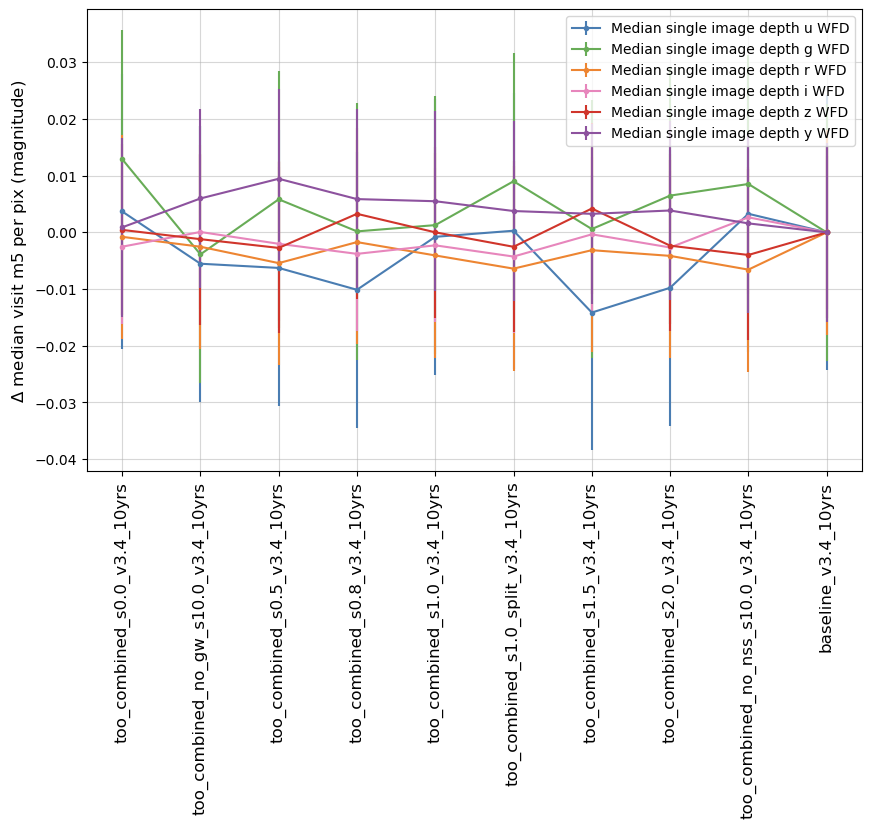

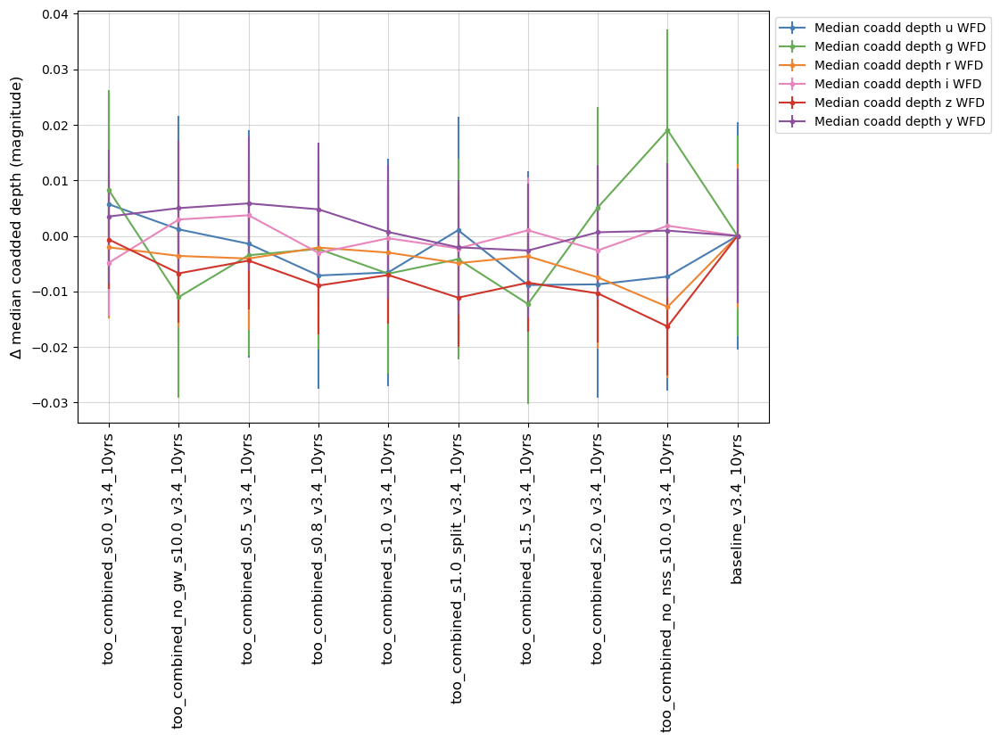

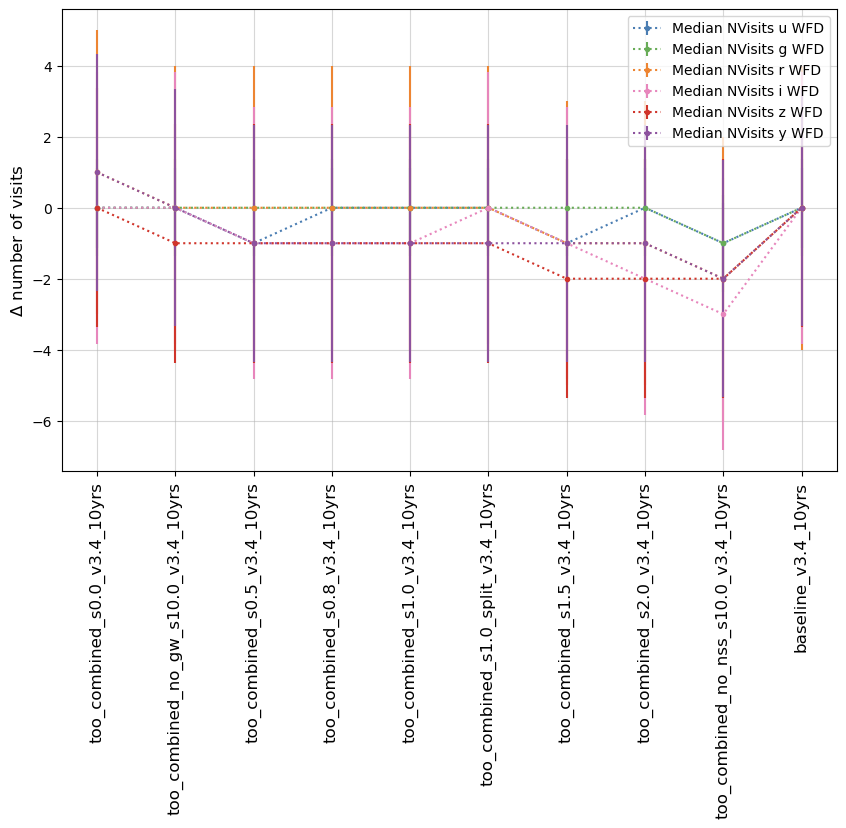

In [129]:
# Check in on the depths and number of visits in each bandpass
k = 'WFD Depths'


msub = metric_sets.loc[k].query('metric.str.contains("Mean Median")')
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel("$\Delta$ median visit m5 per pix (magnitude)", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'visit_m5_per_pix' + '.png'), format='png')


msub = metric_sets.loc[k].query('metric.str.contains("Coadd")')
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel("$\Delta$ median coadded depth (magnitude)", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'coadd_m5_per_pix' + '.png'), format='png')

msub = metric_sets.loc[k].query('metric.str.contains("NVisits")')
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel("$\Delta$ number of visits", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'nvisit_per_pix'+ '.png'), format='png')

#print(dev[metric_sets.loc[k]['metric']])
summaries.loc[runs, metric_sets.loc[k]['metric']] #- summaries.loc[baseline, metric_sets.loc[k]['metric']]

And just check in on the single visit image depth directly, in each band. Note this is slightly different than the "Mean Median 5sigma depth per image" shown above; this is across all visits, not the median at particular point on the sky. 

run,too_combined_s0.0_v3.4_10yrs,too_combined_no_gw_s10.0_v3.4_10yrs,too_combined_s0.5_v3.4_10yrs,too_combined_s0.8_v3.4_10yrs,too_combined_s1.0_v3.4_10yrs,too_combined_s1.0_split_v3.4_10yrs,too_combined_s1.5_v3.4_10yrs,too_combined_s2.0_v3.4_10yrs,too_combined_no_nss_s10.0_v3.4_10yrs,baseline_v3.4_10yrs
metric,,,,,,,,,,
Identity Mean fiveSigmaDepth WFD u band UniSlicer,23.146146,23.142137,23.141127,23.137520,23.141419,23.140228,23.132680,23.135043,23.146732,23.139952
Identity Mean fiveSigmaDepth WFD g band UniSlicer,24.380055,24.364357,24.372873,24.367035,24.371347,24.376706,24.368762,24.375737,24.382888,24.372116
Identity Mean fiveSigmaDepth WFD r band UniSlicer,23.977923,23.973368,23.975437,23.975082,23.976722,23.976283,23.976505,23.976636,23.974384,23.978835
Identity Mean fiveSigmaDepth WFD i band UniSlicer,23.461522,23.460720,23.459158,23.458271,23.459092,23.459735,23.465523,23.462439,23.468965,23.461427
Identity Mean fiveSigmaDepth WFD z band UniSlicer,22.865241,22.862179,22.859032,22.864678,22.861836,22.859242,22.864503,22.857601,22.858616,22.864227
Identity Mean fiveSigmaDepth WFD y band UniSlicer,21.971894,21.976042,21.980599,21.977389,21.975079,21.973018,21.971625,21.974059,21.972011,21.968962


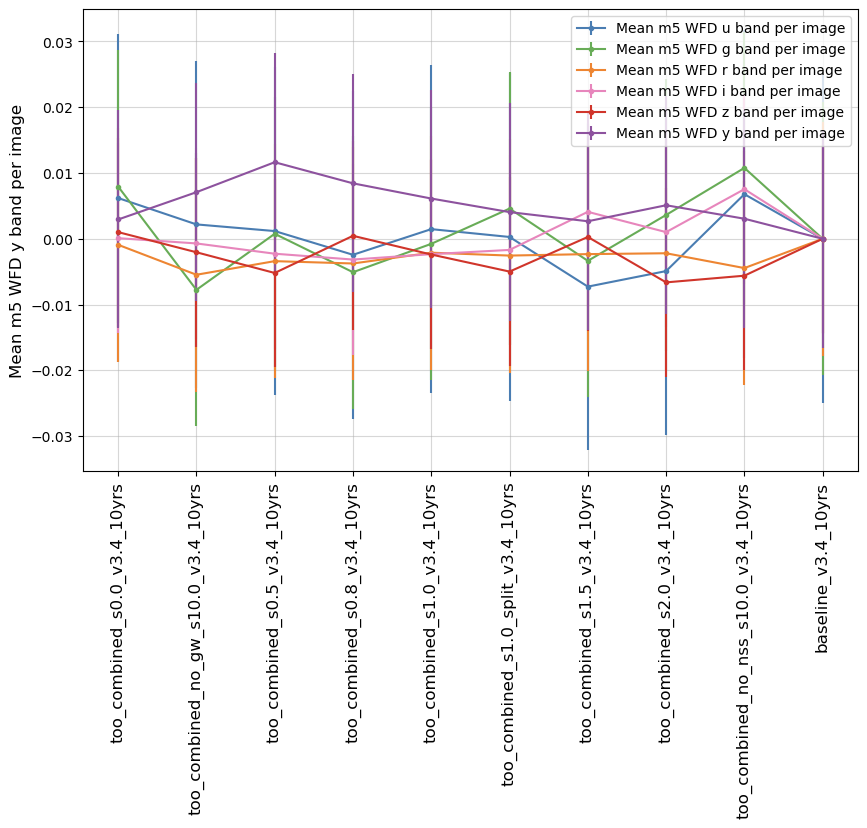

In [130]:
cols = [m for m in summaries if "fiveSigmaDepth" in m and 'band' in m and "UniSlicer" in m
             and ("Mean" in m) and "WFD" in m and "Yr 1" not in m and 'all' not in m]
cols = [f'Identity Mean fiveSigmaDepth WFD {f} band UniSlicer' for f in 'ugrizy']
newcols = [f'Mean m5 WFD {f} band per image' for f in 'ugrizy']

mset = maf.create_metric_subset('VisitDepths', metrics=cols, short_name=newcols, invert=False, mag=True) 
msub = mset.loc['VisitDepths']

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
fig.savefig(os.path.join(outdir, 'm5_per_visit'+ '.png'), format='png')

d = (summaries.loc[runs, cols]) 
d.T

In [131]:
cols = [m for m in summaries if "Teff All sky all bands" in m and "UniSlicer" in m and "Normalized" not in m]
cols

d = summaries.loc[runs, cols]/summaries.loc[baseline, cols]
d = d.rename(columns={'Identity Total Teff All sky all bands UniSlicer': "Teff Total"})
d.round(2)

metric,Teff Total
run,
too_combined_s0.0_v3.4_10yrs,1.00
too_combined_no_gw_s10.0_v3.4_10yrs,1.00
too_combined_s0.5_v3.4_10yrs,0.99
too_combined_s0.8_v3.4_10yrs,0.99
too_combined_s1.0_v3.4_10yrs,0.99
too_combined_s1.0_split_v3.4_10yrs,0.99
too_combined_s1.5_v3.4_10yrs,0.99
too_combined_s2.0_v3.4_10yrs,0.99
too_combined_no_nss_s10.0_v3.4_10yrs,0.98


In [132]:
mm1 = [f'Identity Mean fiveSigmaDepth WFD {f} band UniSlicer' for f in 'ugrizy']
msub = metric_sets.loc[k].query('metric.str.contains("Coadd")')
mm2 = (list(msub['metric'].values))
metrics = [f"Median Exgal_CoaddM5 WFD {f} band HealpixSubsetSlicer" for f in 'ugrizy']
mm3 = metrics

r = 'baseline_v3.4_10yrs'
filterlist = ['u', 'g', 'r', 'i', 'z', 'y']
s1 = summaries.loc[r, mm1]
s1.index = filterlist
s2 = summaries.loc[r, mm2]
s2.index = filterlist
s3 = summaries.loc[r, mm3]
s3.index = filterlist
pd.DataFrame([m5_SRD_design, s1, s2], index=['SRD', 'Visit m5', 'Coadd m5']).round(2).T

,SRD,Visit m5,Coadd m5
u,23.9,23.14,25.39
g,25.0,24.37,26.88
r,24.7,23.98,27.01
i,24.0,23.46,26.52
z,23.3,22.86,25.82
y,22.1,21.97,24.85


## Evaluate metrics

Let's evaluate some metric results across these surveys, starting with a very high level overview. 

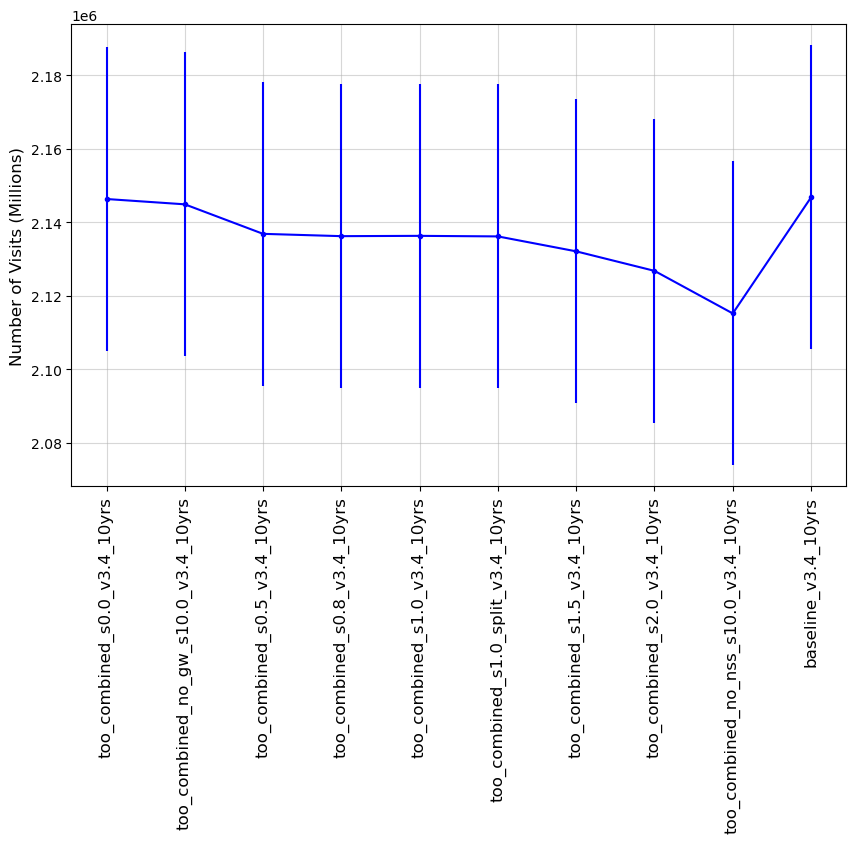

In [133]:
# How did the overall number of visits change for each simulation baseline?  Note some simulations include more shorter visits, and this will be reflected in these numbers.

cols = [m for m in summaries if "Nvisits" in m and "UniSlicer" in m and 'All' in m]
cols

fig, ax = plot_run_metric_uncert(summaries.loc[runs, cols],
                                 dev[cols],
                                 run_label_map=rdict)
ax.set_ylabel(f"Number of Visits (Millions)", fontsize='large')
leg = ax.get_legend()
leg.remove()
fig.savefig(os.path.join(outdir, 'total_nvisits'+ '.png'), format='png')

### SCOC subsets
<a id='SCOC'></a>
A high level overview in a mesh grid, to compare many metrics quickly but without details. 

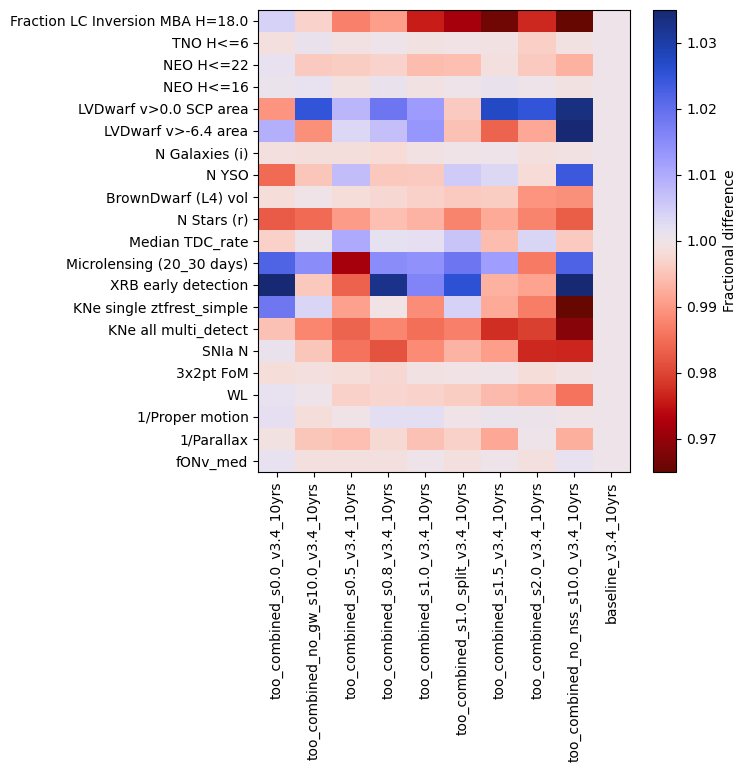

In [135]:
# What about the SCOC high-level overview? 

msub = metric_sets.loc['SCOC']
m = [m for m in summaries if 'Vatira' in m and 'quad' in m and 'CumulativeCompleteness' in m and 'Time' not in m and '20.0' in m]
md = maf.create_metric_subset('vatira', m, short_name=['Vatira H<=20'])
md
#msub = pd.concat([msub, md.loc['vatira']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[runs, msub['metric']], 
                     baseline_run=baseline,
                     metric_subset=msub,
                        metric_label_map=msub['short_name'],
                        run_label_map=rdict,
                                   color_range=0.07
                      )
fig.savefig(os.path.join(outdir, 'scoc_grid'+ '.png'), format='png')

['too_combined_s0.0_v3.4_10yrs', 'too_combined_no_gw_s10.0_v3.4_10yrs', 'too_combined_s0.5_v3.4_10yrs', 'too_combined_s0.8_v3.4_10yrs', 'too_combined_s1.0_v3.4_10yrs', 'too_combined_s1.0_split_v3.4_10yrs', 'too_combined_s1.5_v3.4_10yrs', 'too_combined_s2.0_v3.4_10yrs', 'too_combined_no_nss_s10.0_v3.4_10yrs', 'baseline_v3.4_10yrs']


metric,SNIa N,KNe all multi_detect,KNe single ztfrest_simple,XRB early detection,Microlensing (20_30 days),Median TDC_rate,NEO H<=16,NEO H<=22,TNO H<=6,Fraction LC Inversion MBA H=18.0
run,,,,,,,,,,
too_combined_s0.0_v3.4_10yrs,1.001043,0.994722,1.018381,1.034753,1.021900,0.996594,1.000627,1.001183,0.998898,1.004211
too_combined_no_gw_s10.0_v3.4_10yrs,0.995134,0.987814,1.003706,0.995595,1.014782,1.000474,1.001254,0.995640,1.000979,0.996842
too_combined_s0.5_v3.4_10yrs,0.985692,0.983781,0.990958,0.983358,0.971804,1.010168,0.999164,0.996001,0.999229,0.987368
too_combined_s0.8_v3.4_10yrs,0.981601,0.987814,0.999704,1.032795,1.014782,1.001373,1.000836,0.996758,1.000215,0.990526
too_combined_s1.0_v3.4_10yrs,0.988257,0.984982,0.988734,1.016153,1.013961,1.001695,0.999373,0.994117,0.998995,0.975789
too_combined_s1.0_split_v3.4_10yrs,0.992984,0.987042,1.004299,1.025453,1.018615,1.006224,1.000209,0.994464,0.999632,0.971579
too_combined_s1.5_v3.4_10yrs,0.990525,0.977474,0.991847,0.992658,1.012045,0.994207,1.000836,0.998860,0.999216,0.966316
too_combined_s2.0_v3.4_10yrs,0.976795,0.979319,0.986659,0.991189,0.986586,1.003793,1.000209,0.995786,0.996278,0.976842
too_combined_no_nss_s10.0_v3.4_10yrs,0.976728,0.968763,0.959532,1.046011,1.022174,0.995767,0.999164,0.992641,0.998963,0.960000


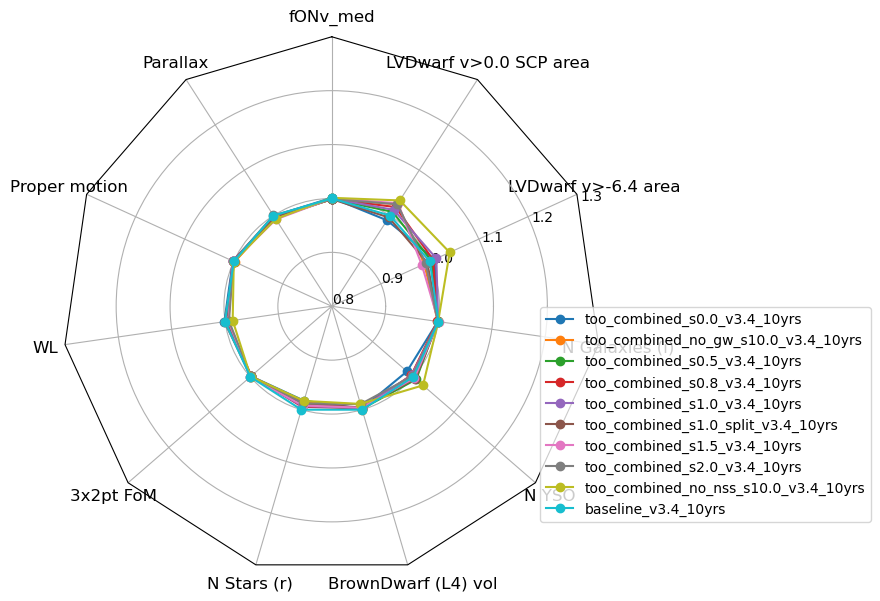

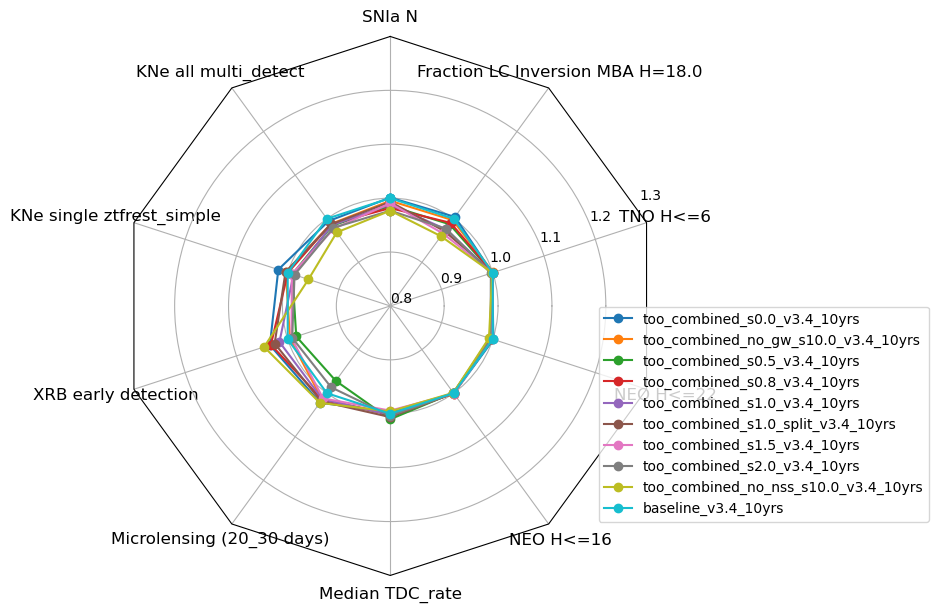

In [136]:
# And some classic 'radar' plots, but only use a subset of the baseline runs
rr = runs
print(rr)

mset = msub

statics = np.array([0, 1, 2, 3, 4, 11, 12, 13, 14, 15, 16])
variable = [i for i in np.arange(0, len(mset)) if i not in statics]

mset_stat = mset.iloc[statics]
mset_var = mset.iloc[variable]

normed = maf.normalize_metric_summaries(baseline,
                                        summaries.loc[rr, mset_stat['metric']],
                                        mset)
normed.columns = normed.columns.map(mset['short_name'])
normed

fig, ax = maf.radar(normed, rgrids=[0.80, 0.9, 1.0, 1.1, 1.2, 1.3], figsize=(8, 8), bbox_to_anchor=[1.5, 0.1])
ax.tick_params(axis='x', labelsize='large')
ax.tick_params(axis='y', labelsize='medium')
fig.set_figwidth(8)
fig.set_figheight(7)


normed = maf.normalize_metric_summaries(baseline,
                                        summaries.loc[rr, mset_var['metric']],
                                        mset)
normed.columns = normed.columns.map(mset['short_name'])
normed

fig, ax = maf.radar(normed, rgrids=[0.80, 0.9, 1.0, 1.1, 1.2, 1.3], figsize=(8, 8), bbox_to_anchor=[1.5, 0.1])
ax.tick_params(axis='x', labelsize='large')
ax.tick_params(axis='y', labelsize='medium')
fig.set_figwidth(8)
fig.set_figheight(7)
normed.loc[rr]

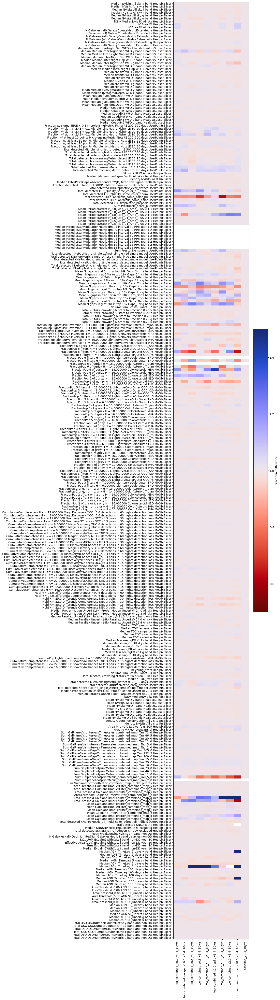

In [137]:
# Plot all the metrics, resulting in a very big and messy plot. Look at overall trends, or for things to investigate further.
non_dd = [m for m in msets if 'DD' not in m]
msub = metric_sets.loc[non_dd].reset_index(drop=True).drop('style', axis=1).drop('short_name', axis=1)
msub = msub.drop_duplicates().set_index('metric', drop=False, verify_integrity=True)

fig, ax = maf.plot_run_metric_mesh(summaries.loc[runs, msub['metric']], 
                     baseline_run=baseline,
                     metric_subset=msub,
                        #metric_label_map=msub['short_name'],
                        run_label_map=rdict)
#fig.set_figwidth(24)
fig.set_figheight(60)
fig.savefig(os.path.join(outdir, 'all_grid'+ '.png'), format='png')

Now we look at the metrics results for subsets of metrics, looking in more depth (which allows us to include error bars which come from the standard deviation of the metric results in the weather runs.

### SRD
<a id="SRD"></a>
Metrics coming from the Science Requirements Document, the [SRD](ls.st/srd). 

In [142]:
msub = metric_sets.loc['SRD']
msub

,metric,short_name,style,invert,mag
metric,,,,,
fONv MedianNvis fO HealpixSlicer,fONv MedianNvis fO HealpixSlicer,fONv MedianNvis,k-,False,False
Median Parallax Uncert (18k) Parallax Uncert @ 22.4 All sky HealpixSlicer,Median Parallax Uncert (18k) Parallax Uncert @...,Med Parallax Uncert @22.4,c:,True,False
Median Parallax Uncert (18k) Parallax Uncert @ 24.0 All sky HealpixSlicer,Median Parallax Uncert (18k) Parallax Uncert @...,Med Parallax Uncert @24.0,c-,True,False
Median Parallax Uncert (18k) Parallax Uncert @ 21.3 All sky y band only HealpixSlicer,Median Parallax Uncert (18k) Parallax Uncert @...,Med Parallax Uncert y only @21.3,b:,True,False
Median Proper Motion Uncert (18k) Proper Motion Uncert @ 20.5 All sky HealpixSlicer,Median Proper Motion Uncert (18k) Proper Motio...,Med PM Uncert @20.5,r:,True,False
Median Proper Motion Uncert (18k) Proper Motion Uncert @ 24.0 All sky HealpixSlicer,Median Proper Motion Uncert (18k) Proper Motio...,Med PM Uncert @24.0,r-,True,False


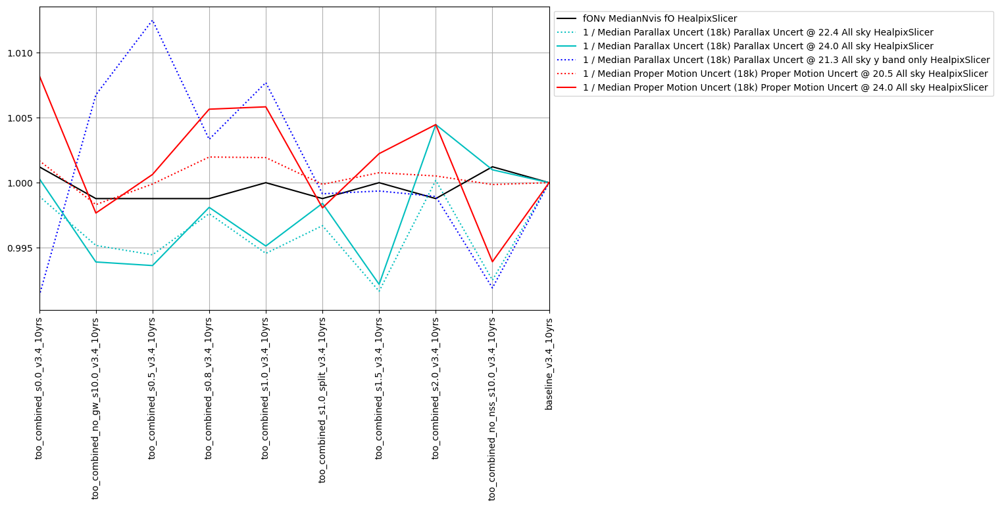

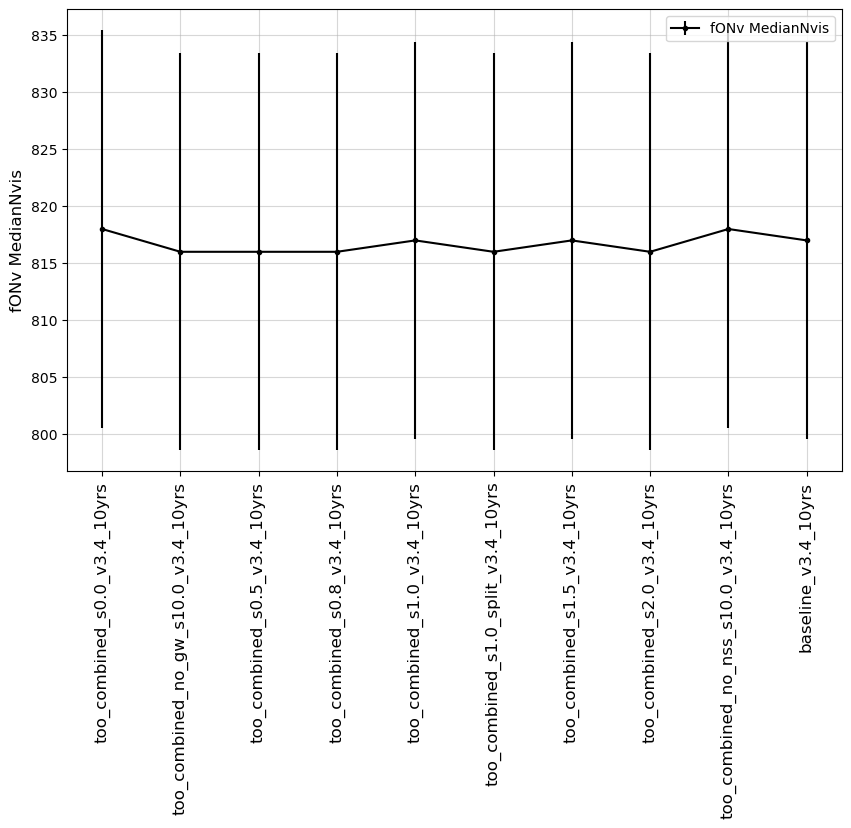

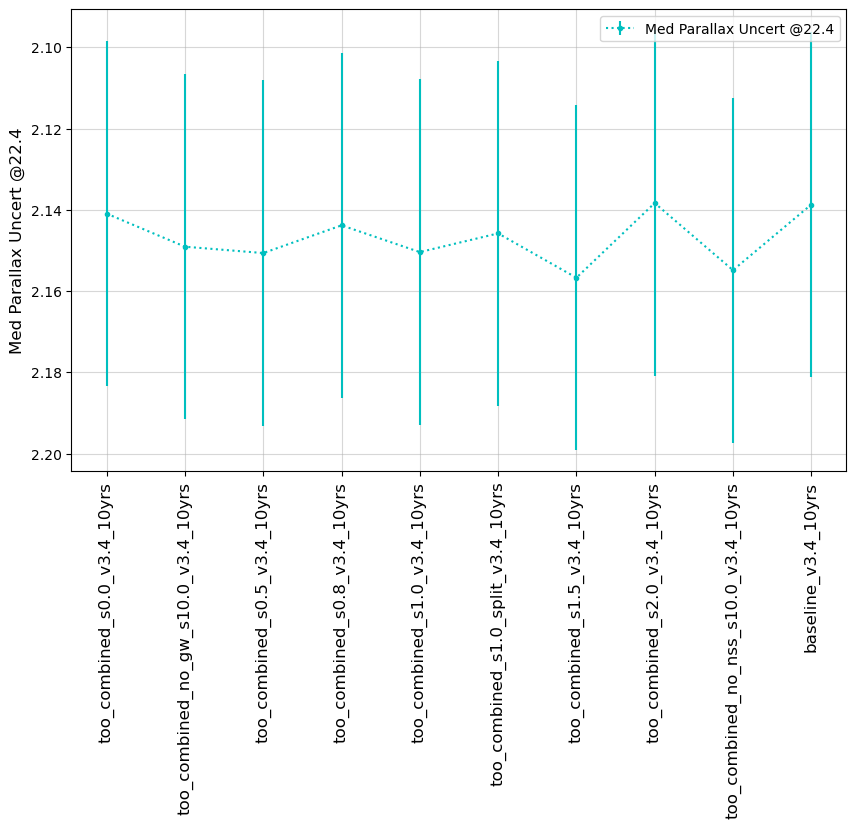

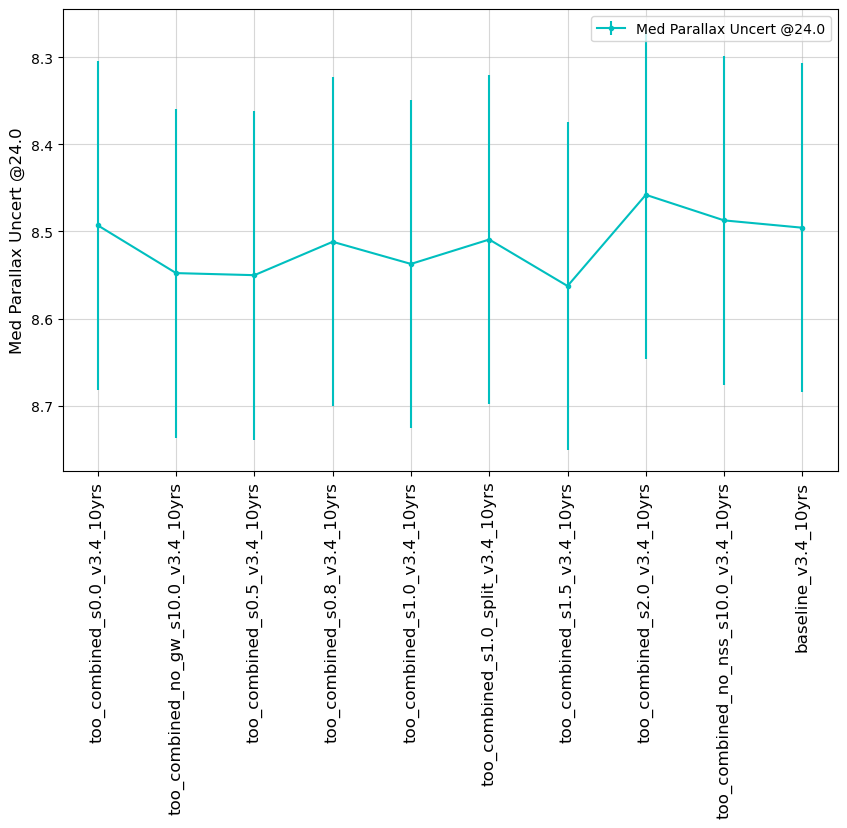

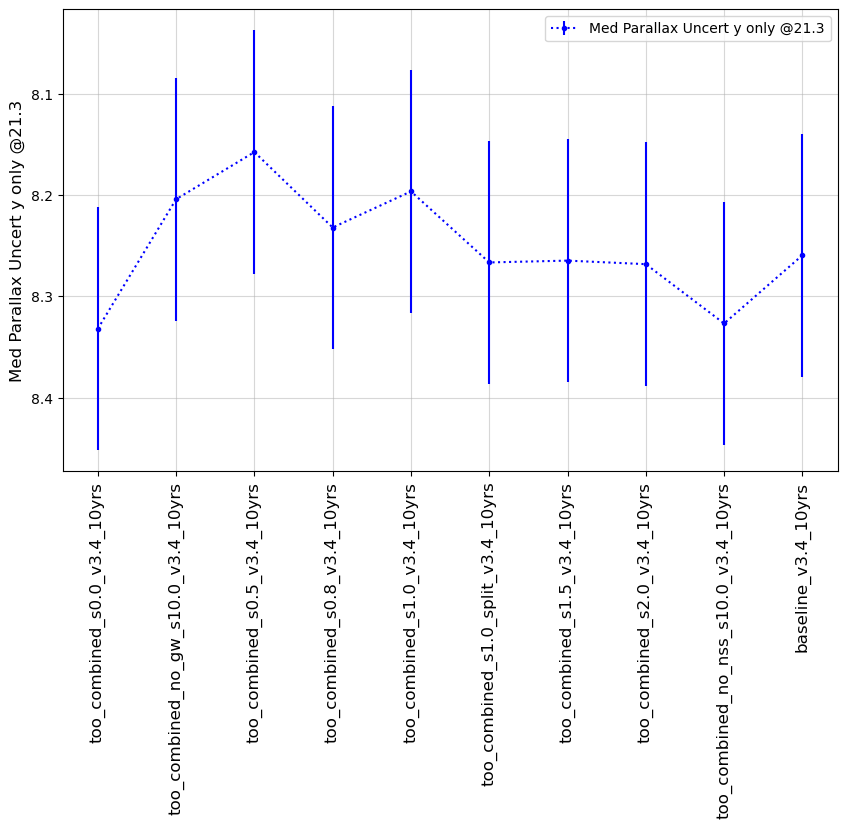

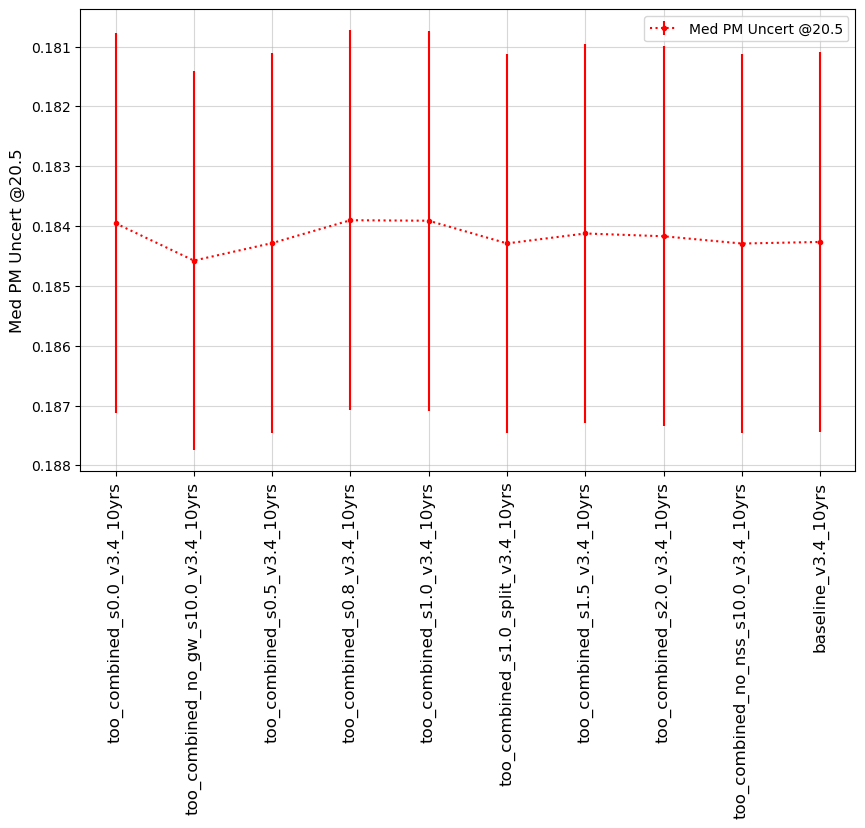

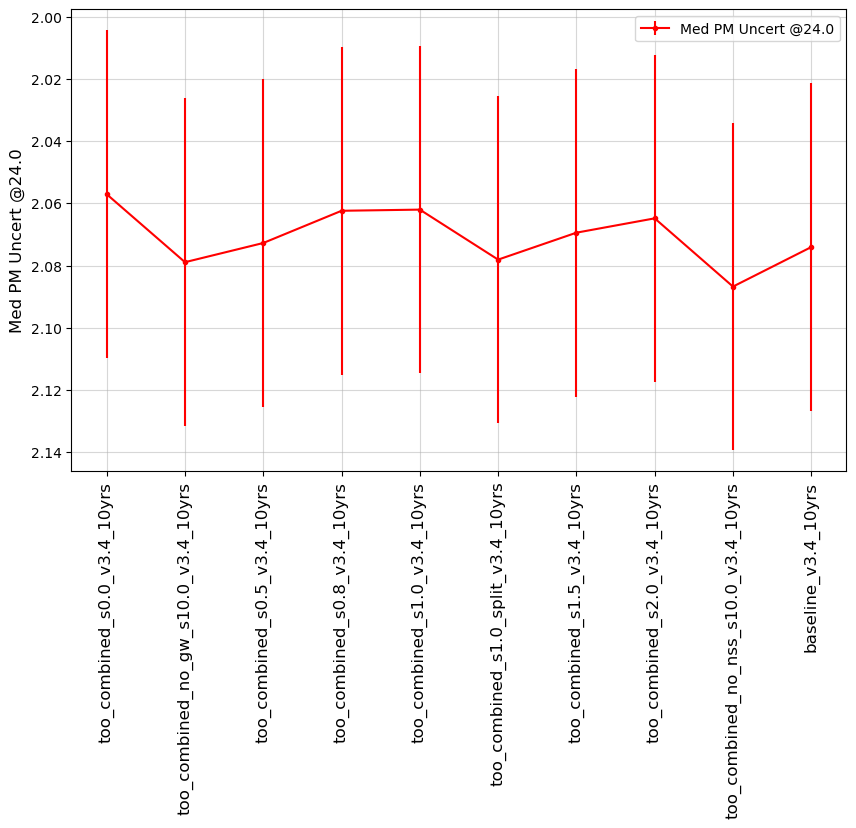

In [143]:
msub = metric_sets.loc['SRD']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub)

### DESC WFD
<a id="DESC WFD"></a>
Metrics related to DESC WFD goals. These include both static science and transient science.

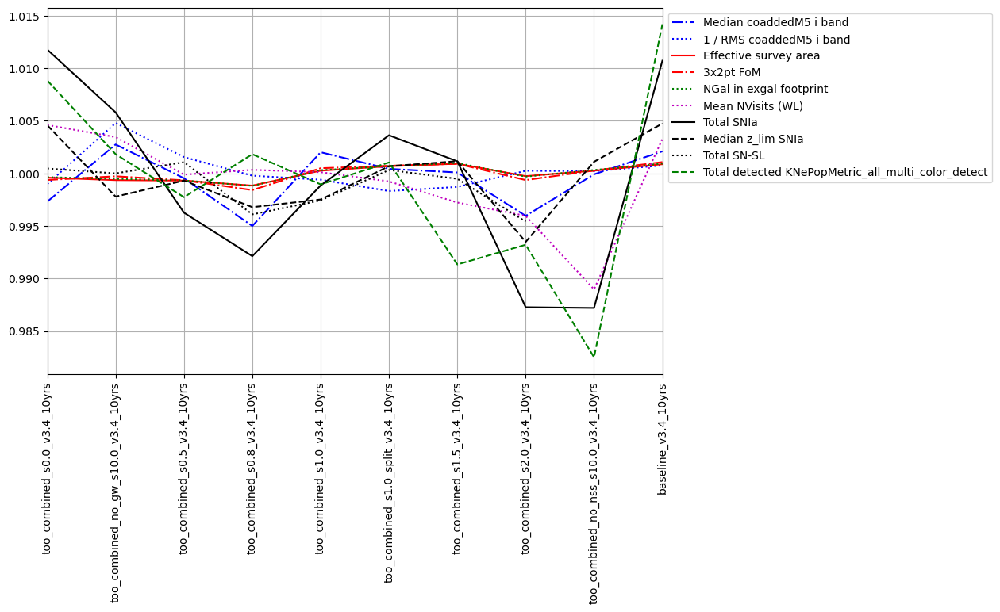

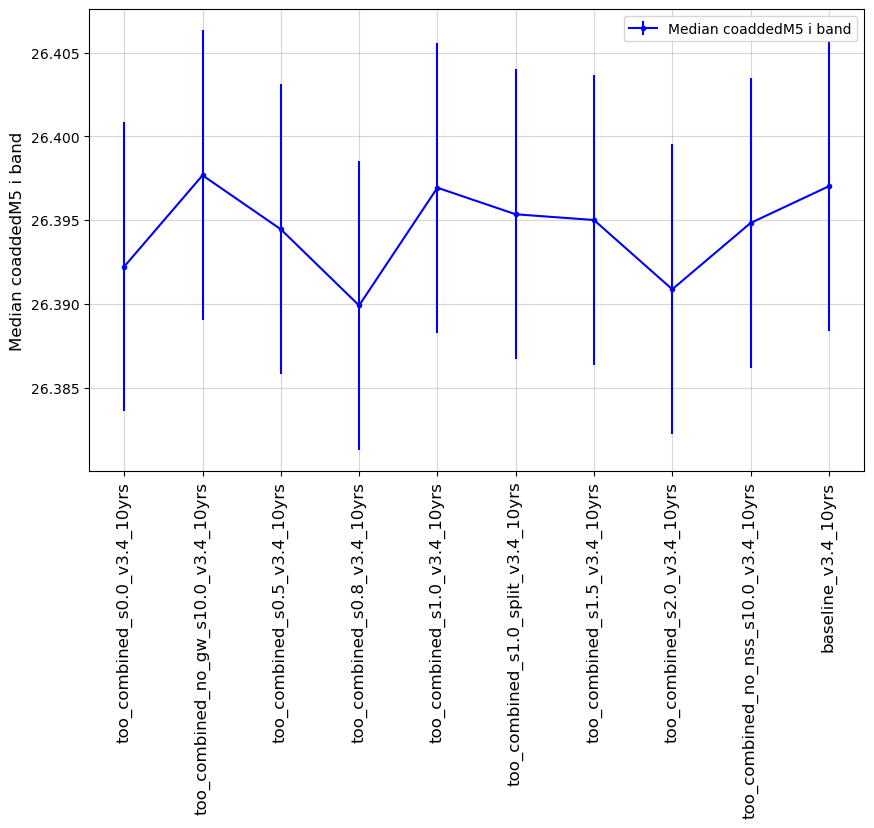

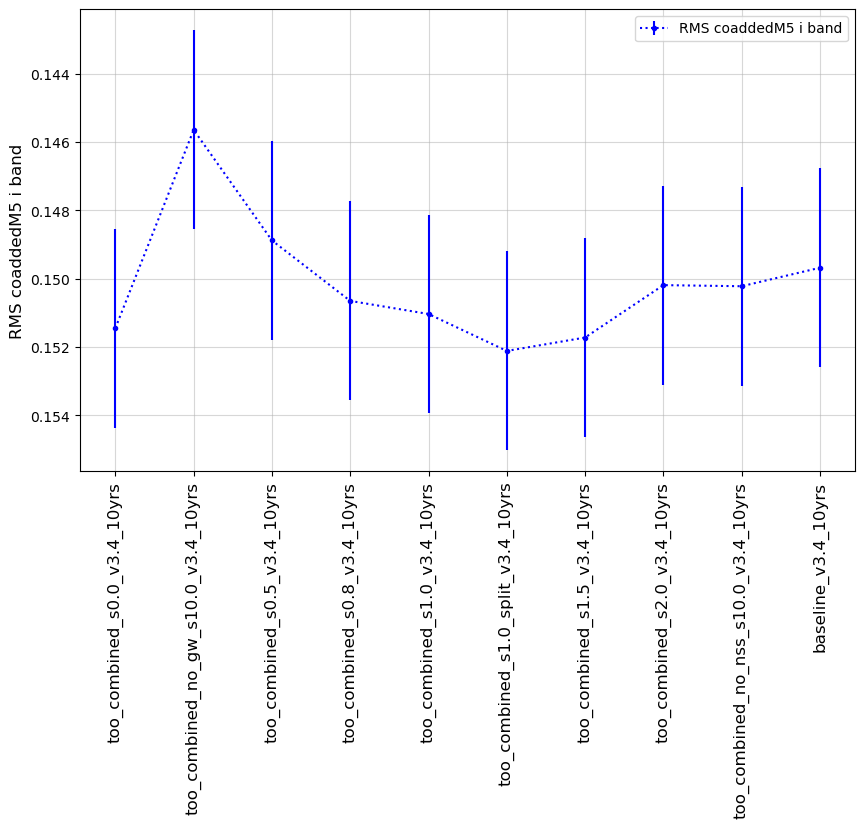

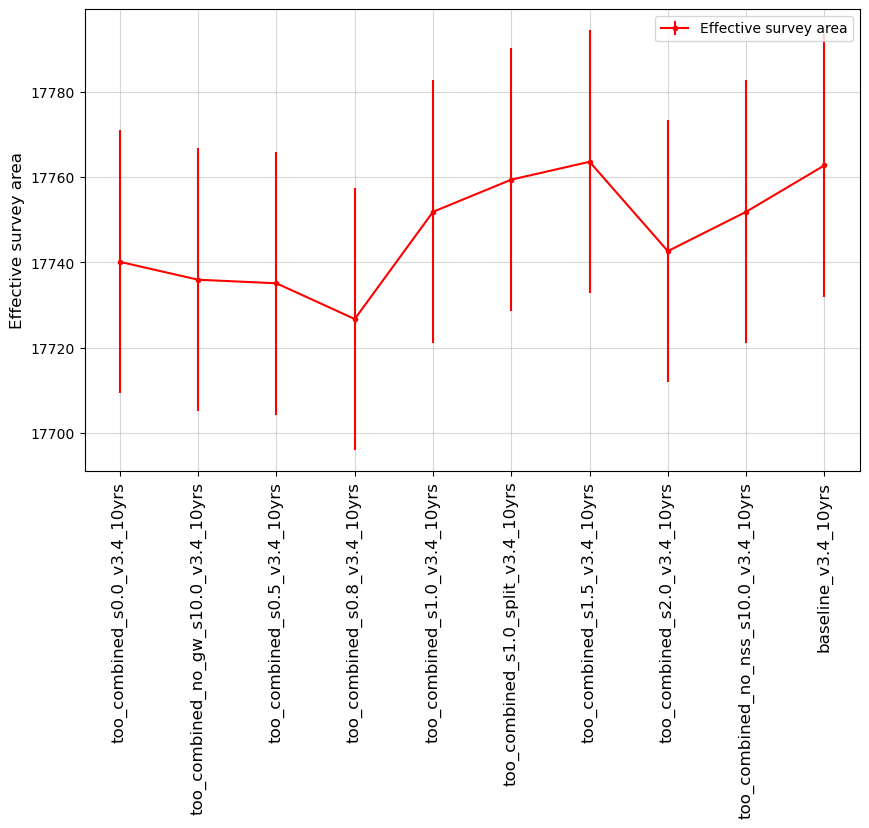

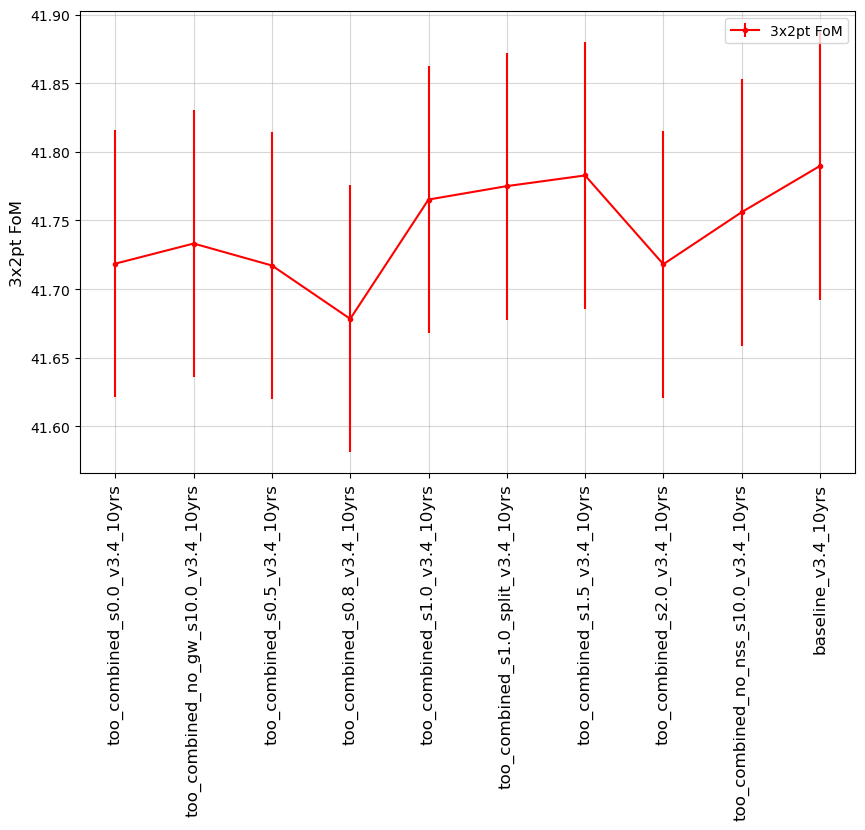

...

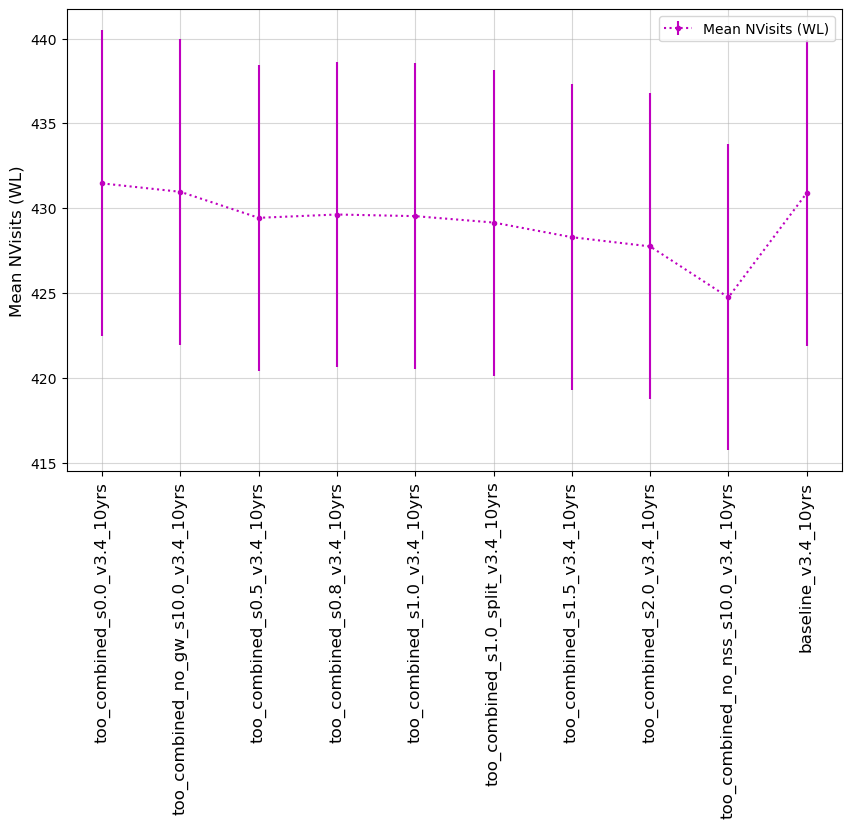

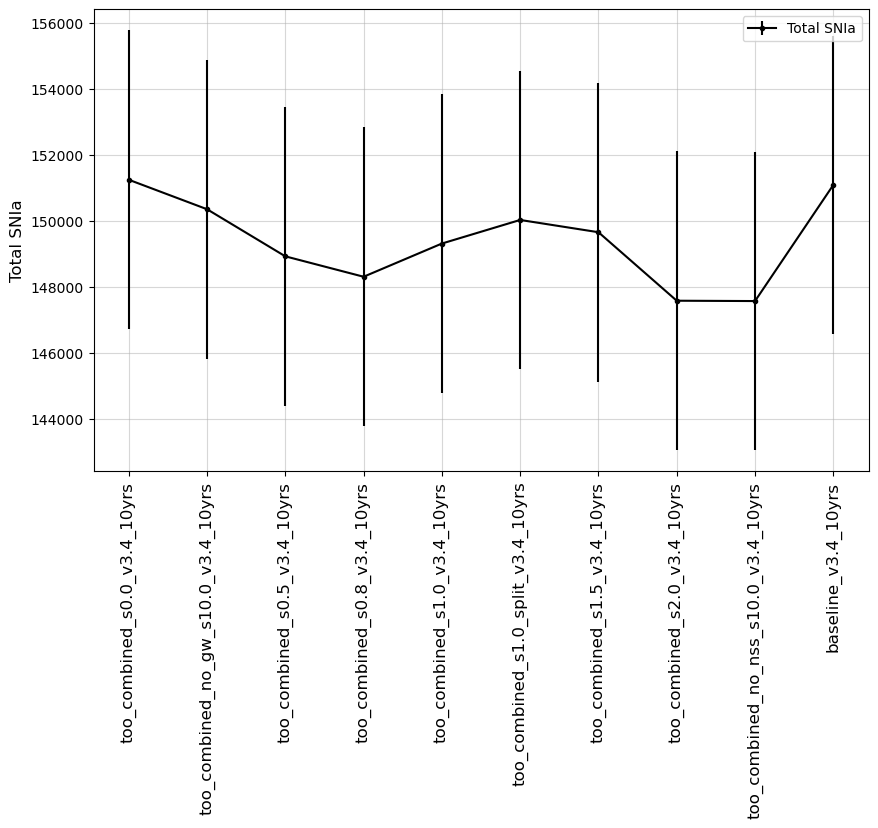

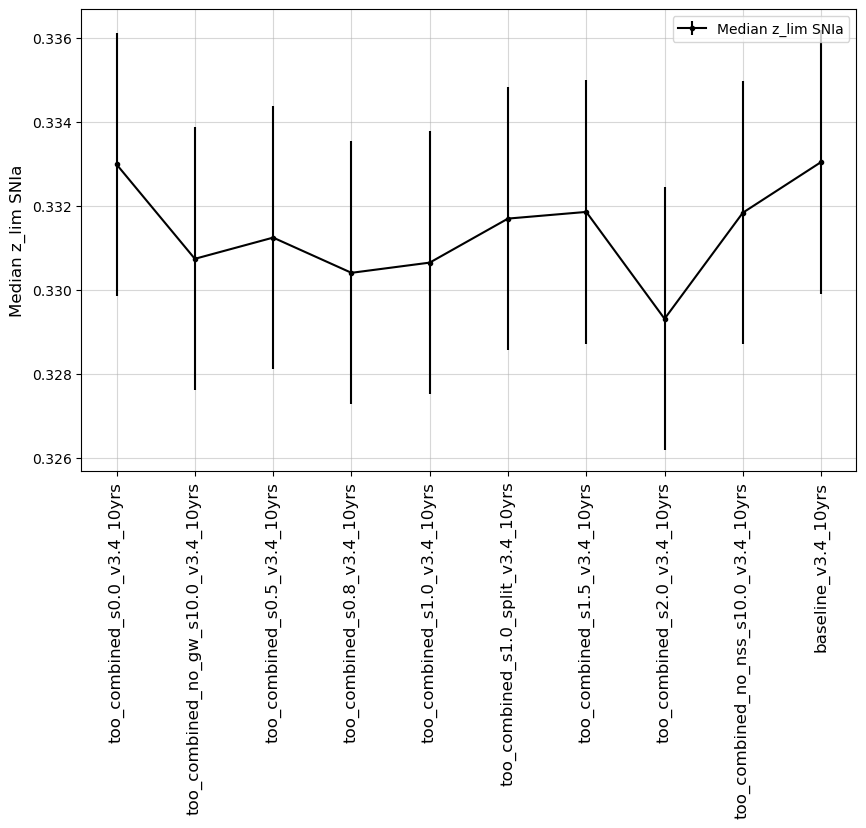

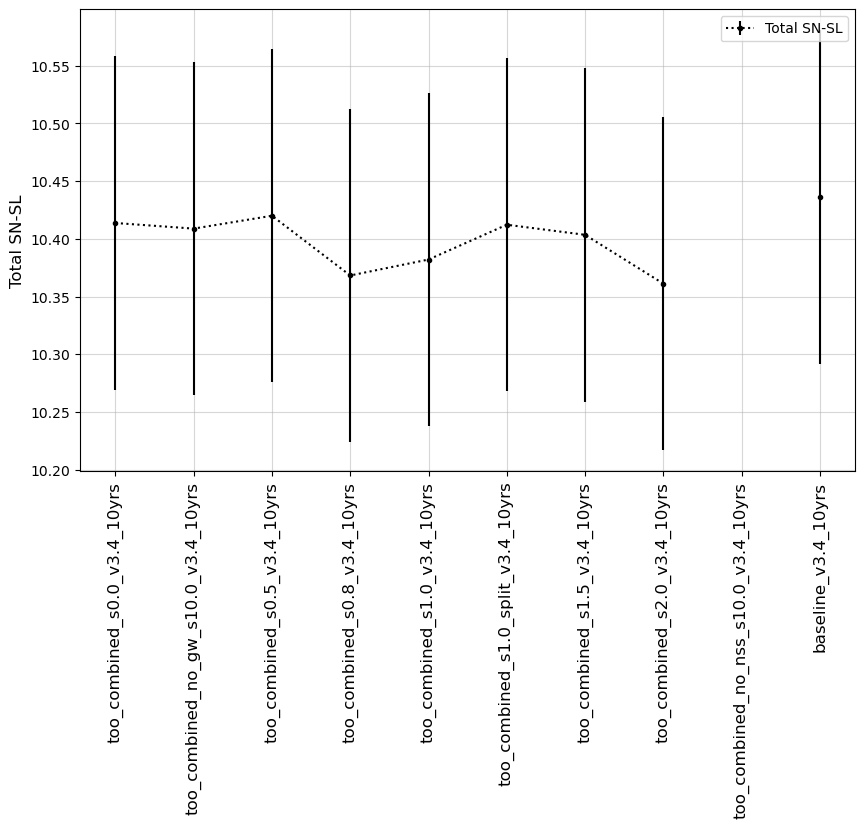

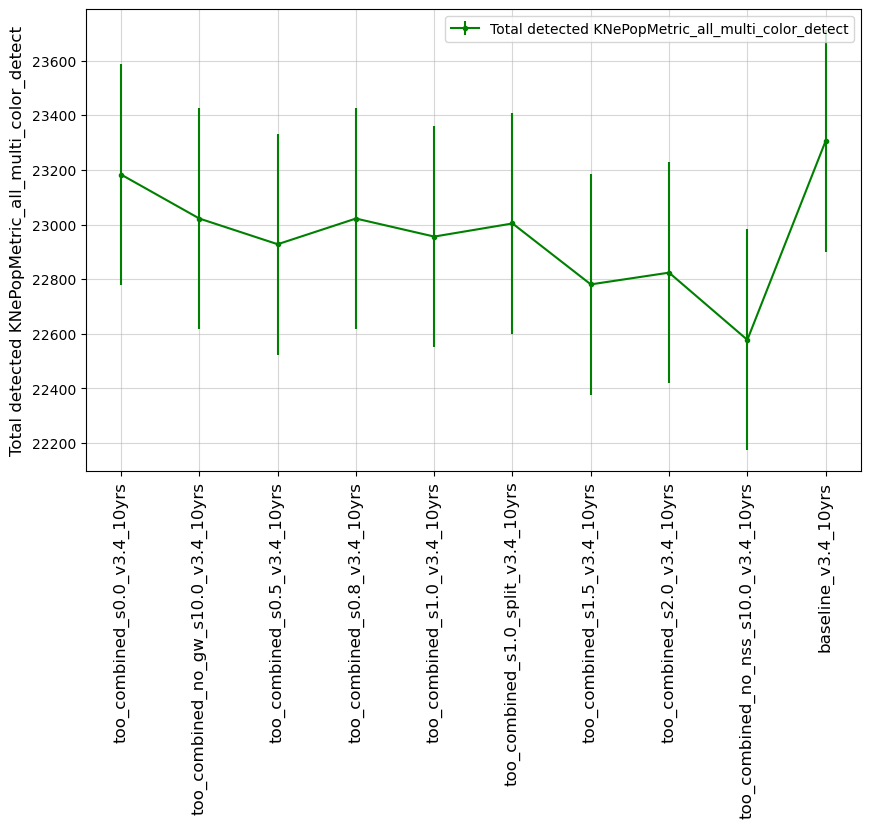

In [144]:
msub = metric_sets.loc['DESC WFD']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=runs, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub)

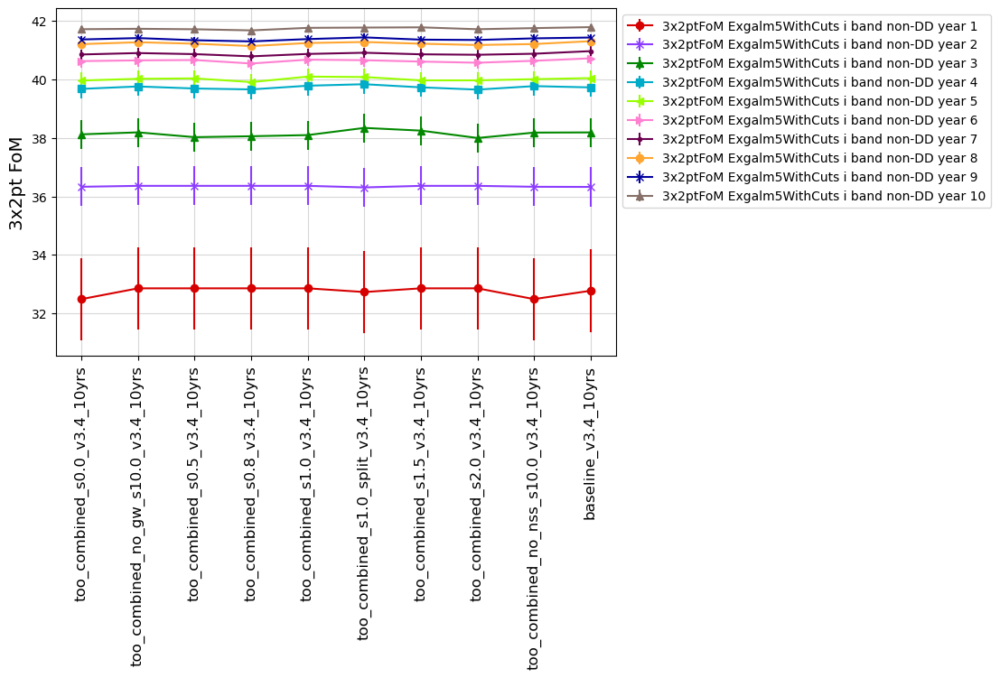

In [145]:
# Compare 3x2pt FOM metrics at individual years, between different simulations.
m1 = []
for yr in range(1, 11):
    m1 += [f'3x2ptFoM Exgalm5WithCuts i band non-DD year {yr} HealpixSlicer']

mset = maf.create_metric_subset('3x2pt', 
                                metrics=m1, 
                                short_name=[m.replace(' HealpixSlicer', '') for m in m1],
                               )
msub = mset.loc['3x2pt']

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=colorcet.glasbey_bw,
                                 metric_set=msub,
                                 markers=['o', 'x', '^', 's', '<', '>', '.', ],
                                 sep_plots=False)                                 
ax.set_ylabel("3x2pt FoM", fontsize='x-large')
fig.set_figwidth(8)
fig.set_figheight(5)

### Transient and Variable Stars
<a id="TVS"></a>
Metrics related to Transient and Variable Stars collaboration goals. 

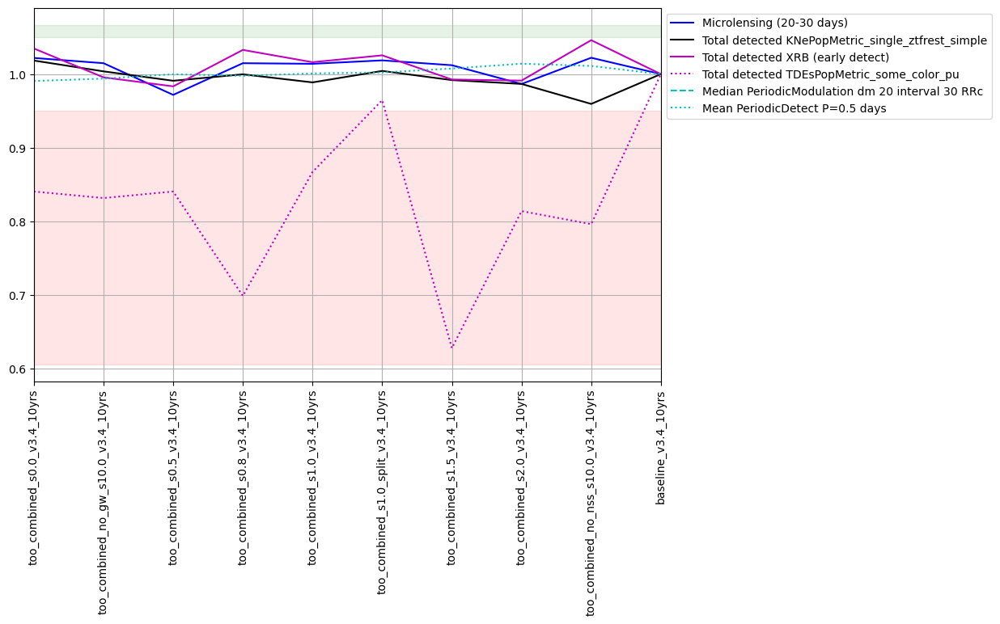

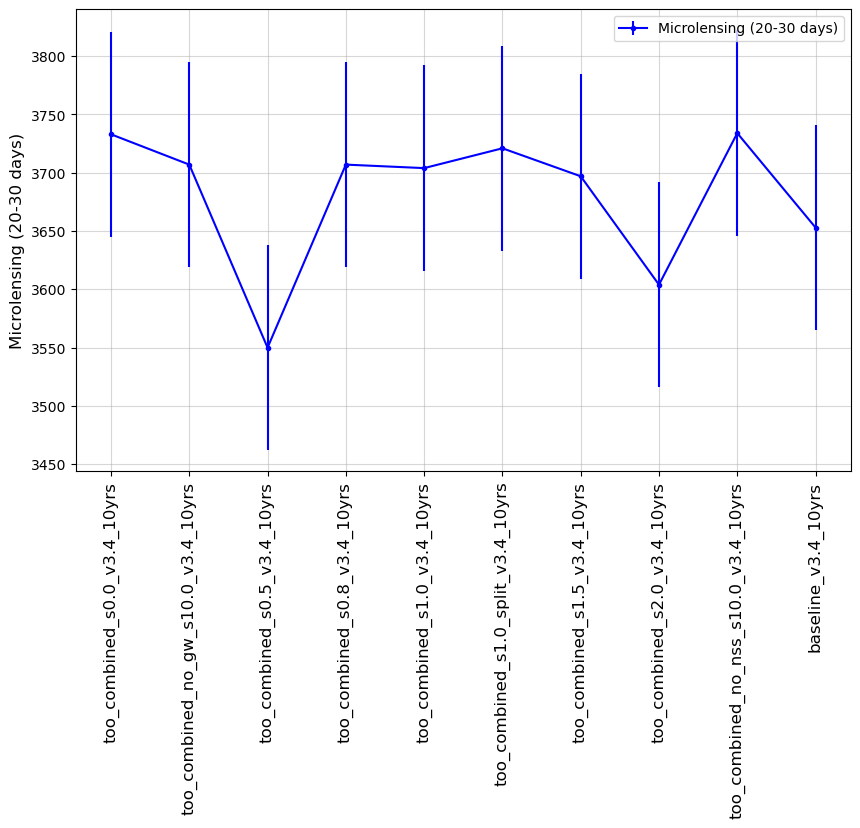

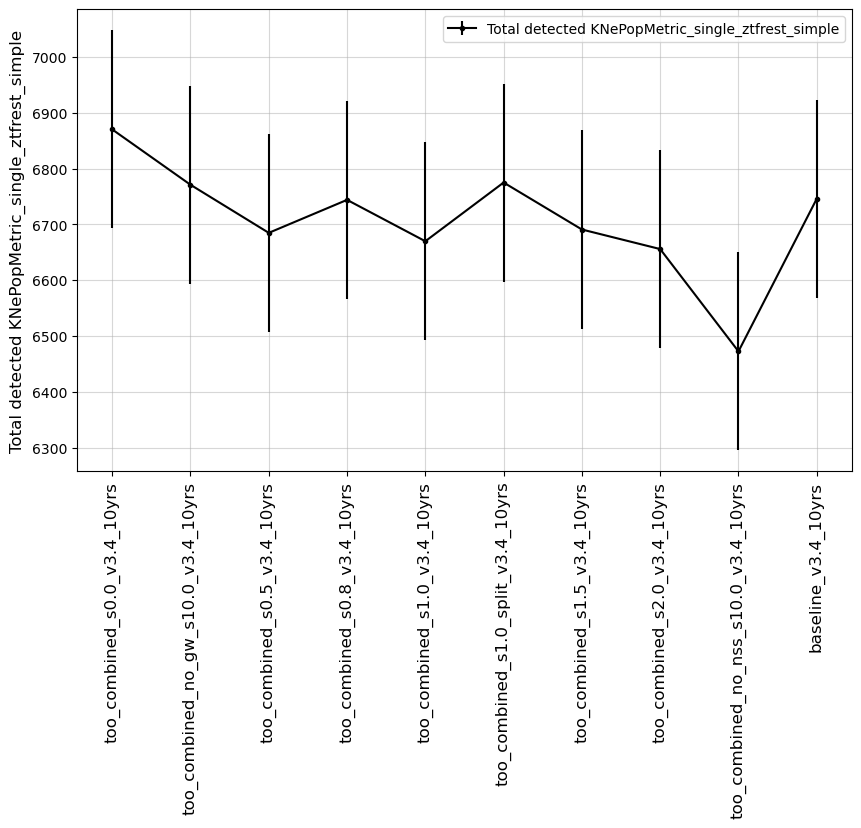

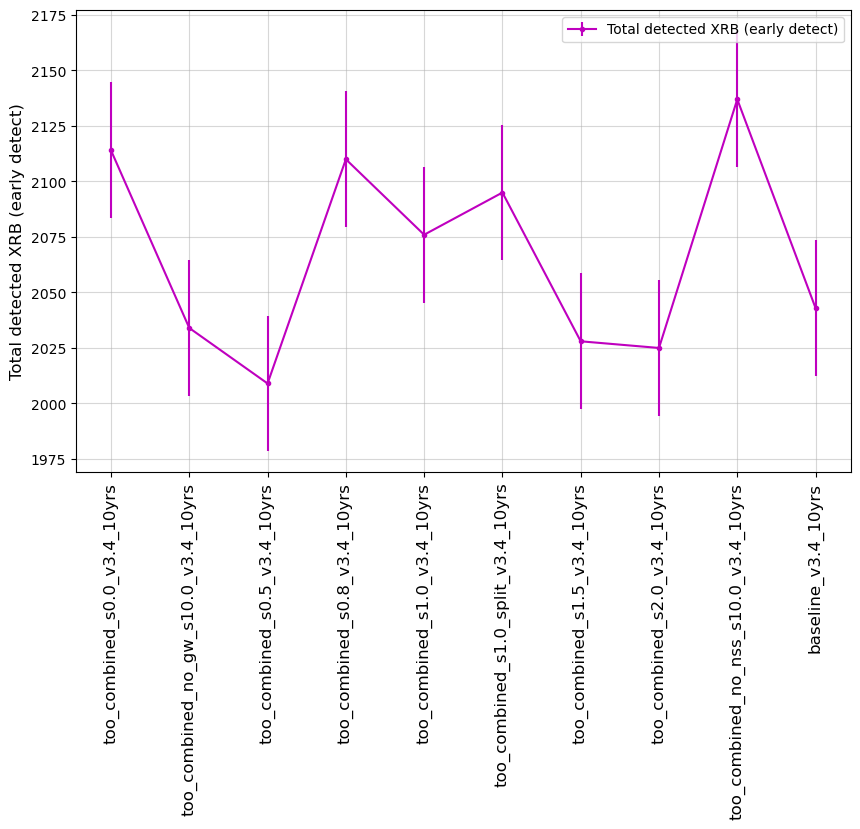

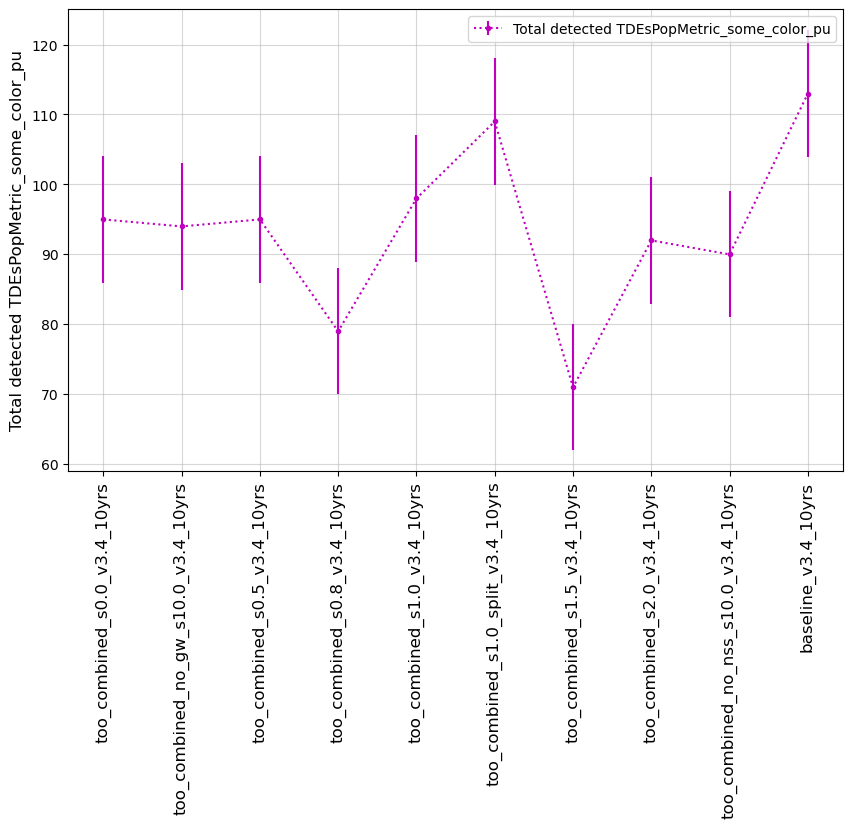

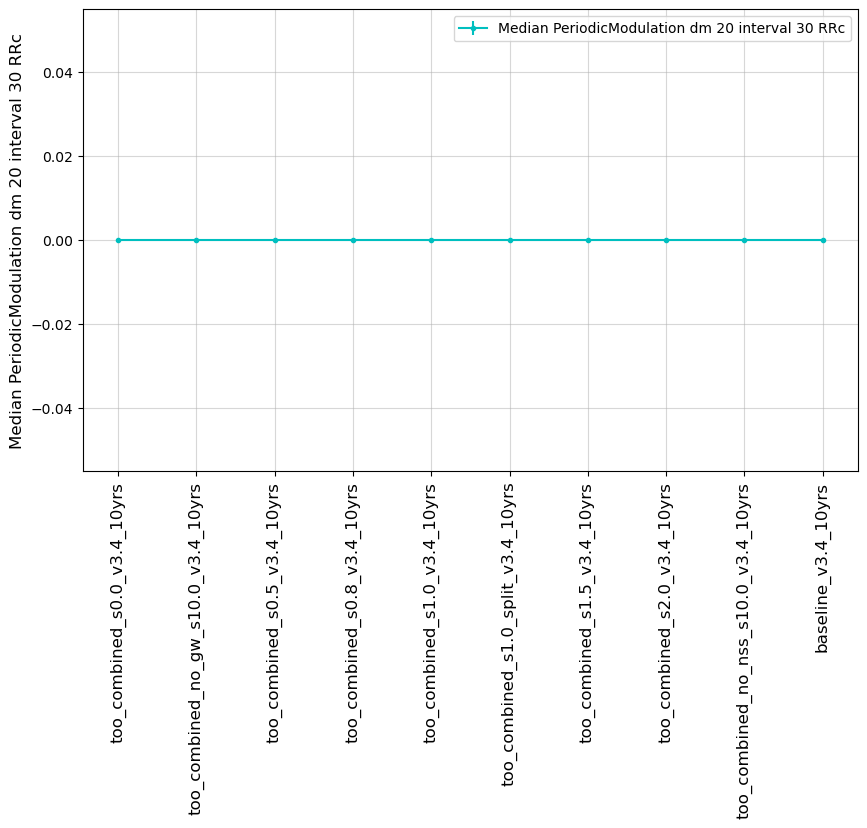

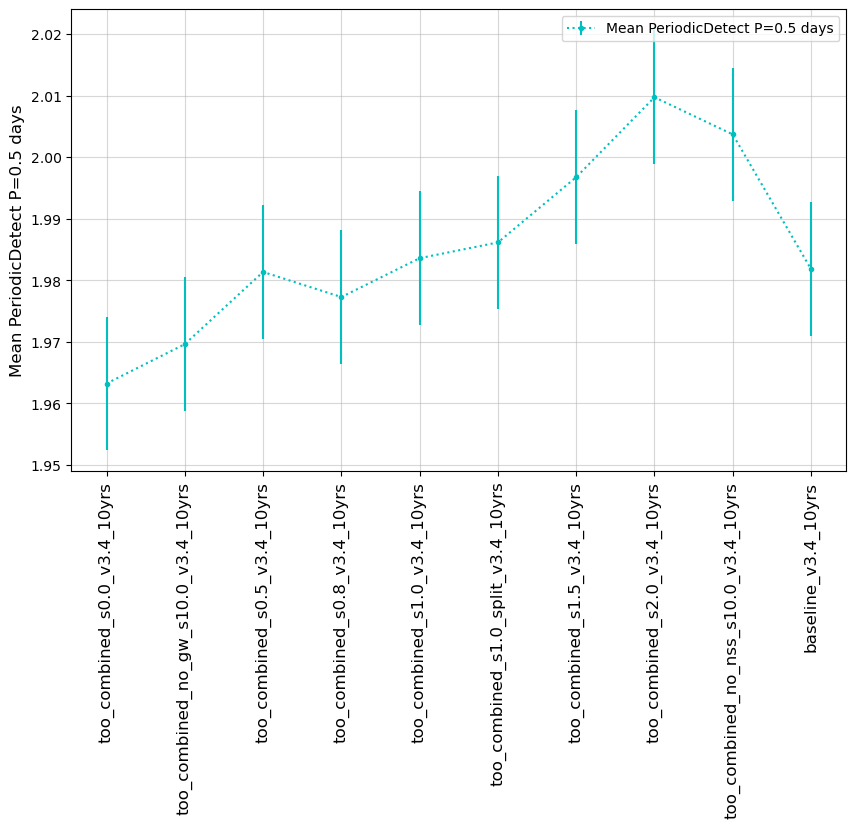

In [156]:
msub = metric_sets.loc['TVS short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub)

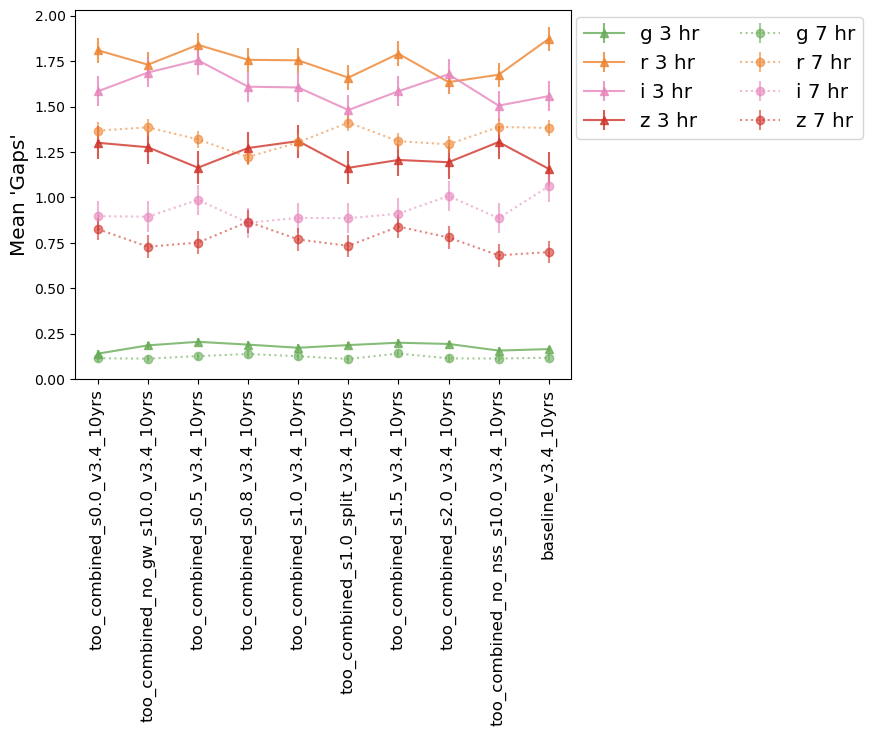

In [157]:
# Time Gaps metric 

fig, ax = plt.subplots()
mset = metric_sets.loc['TVS Gaps'][0:-4]


markers = ['o', 's', '*', '<', '^', 'v', '*', '>', '.', 'X']
j = 0
for i, mm in mset.iterrows():
    m = mm['metric']
    ff = mm['short_name'].split('in ')[-1].split(' at')[0]
    #marker= markers[j]
    marker = 'o'
    if '3' in m:
        marker = '^'
        linestyle='-'
        alpha=0.8
        label=f"{ff} 3 hr"
    if '7' in m:
        marker = 'o'
        linestyle=':'
        alpha=0.6
        label =f"{ff} 7 hr"
    j += 1
    ax.errorbar(list(rdict.values()), summaries.loc[runs, m], yerr=dev[m], 
                color=filter_rgb_map[ff], alpha=alpha, marker=marker, linestyle=linestyle, label=label)
plt.legend(loc=(1.01, 0.65), fontsize='x-large', ncols=2)
ax.set_ylabel("Mean 'Gaps'", fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
fig.savefig(os.path.join(outdir, 'tgaps' + '.png'), format='png')

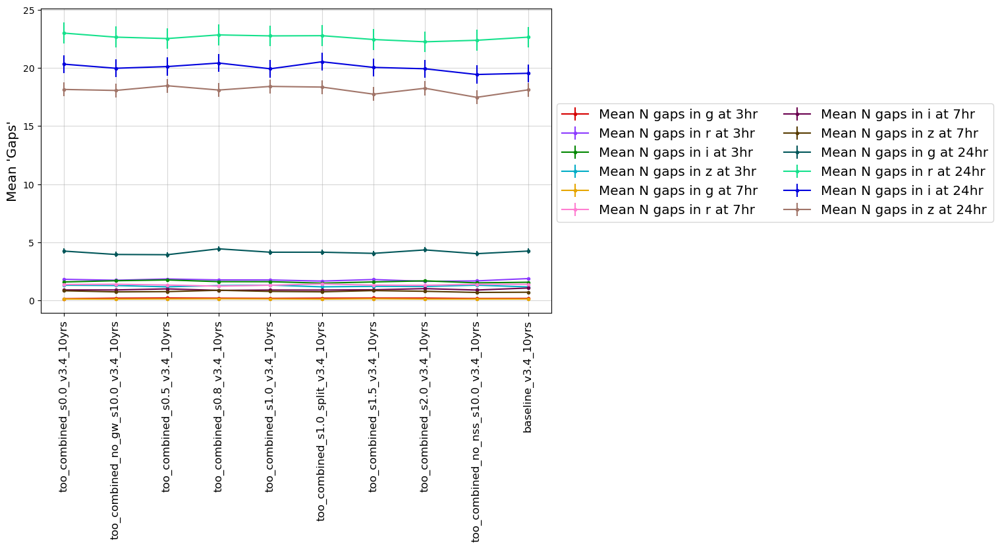

In [158]:
msub = metric_sets.loc['TVS Gaps']

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=colorcet.glasbey_dark,
                                 metric_set=msub, sep_plots=False)
plt.legend(loc=(1.01, 0.3), fontsize='x-large', ncols=2)
ax.set_ylabel("Mean 'Gaps'", fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')

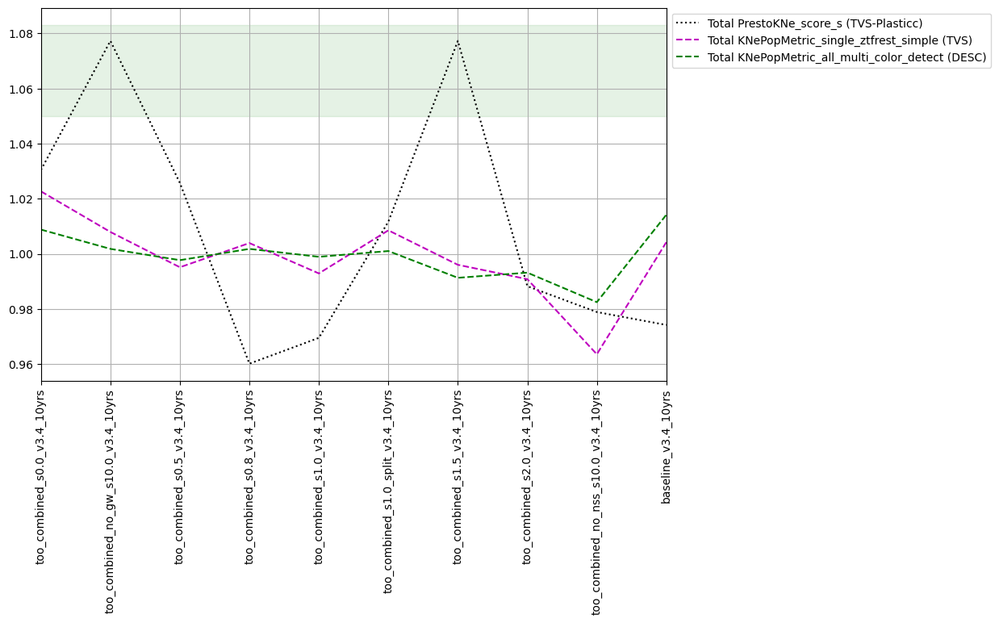

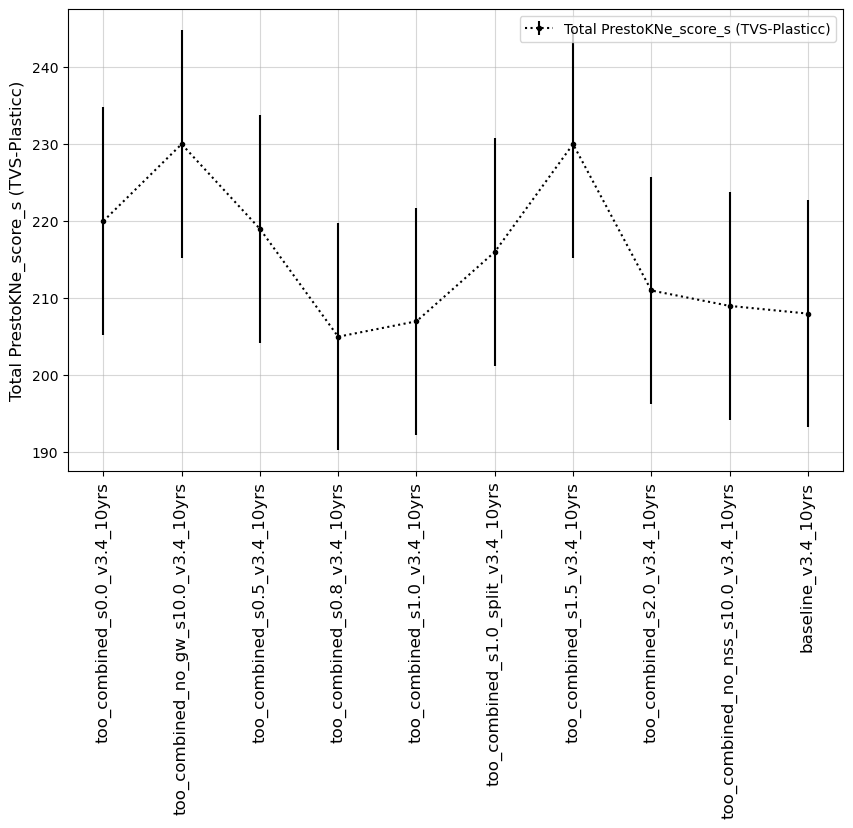

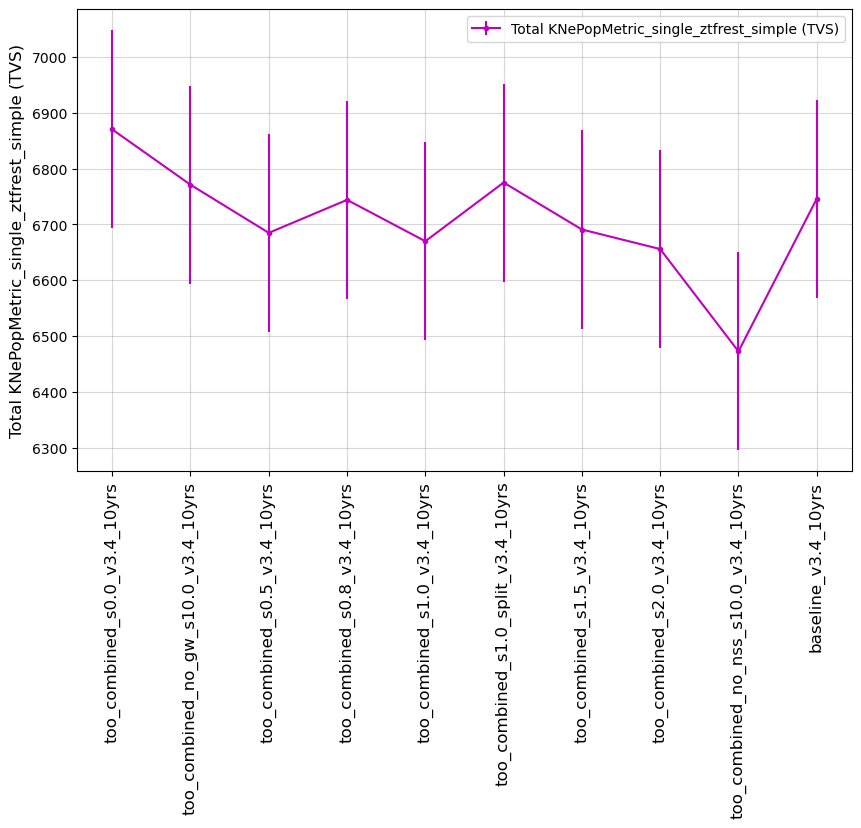

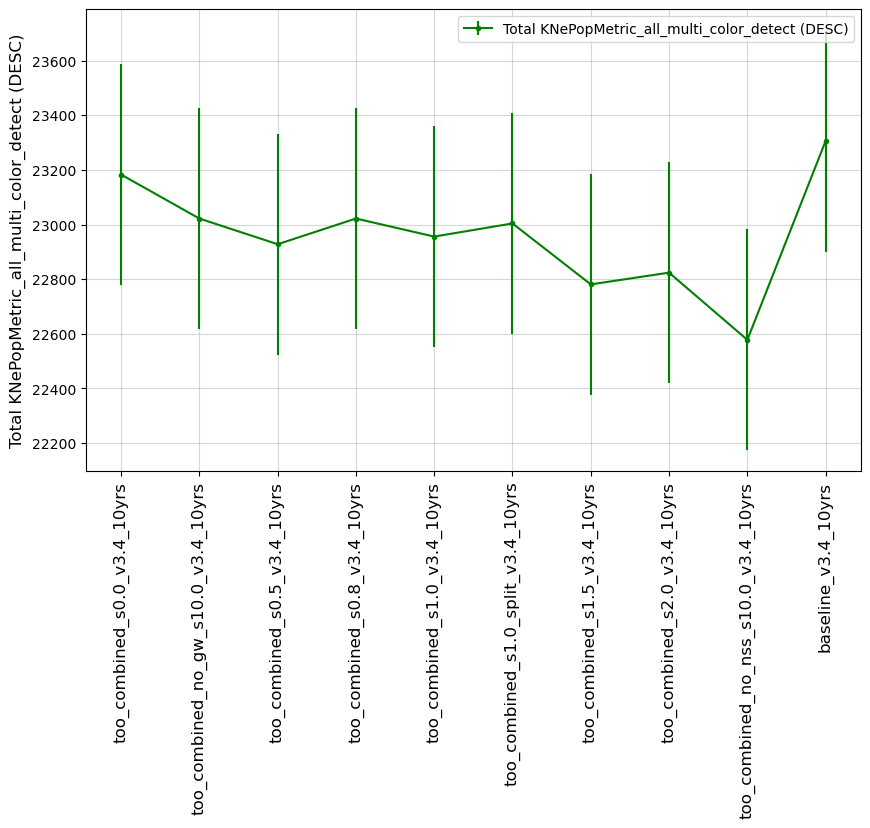

In [159]:
msub = metric_sets.loc['TVS KNe short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=runs,
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub)

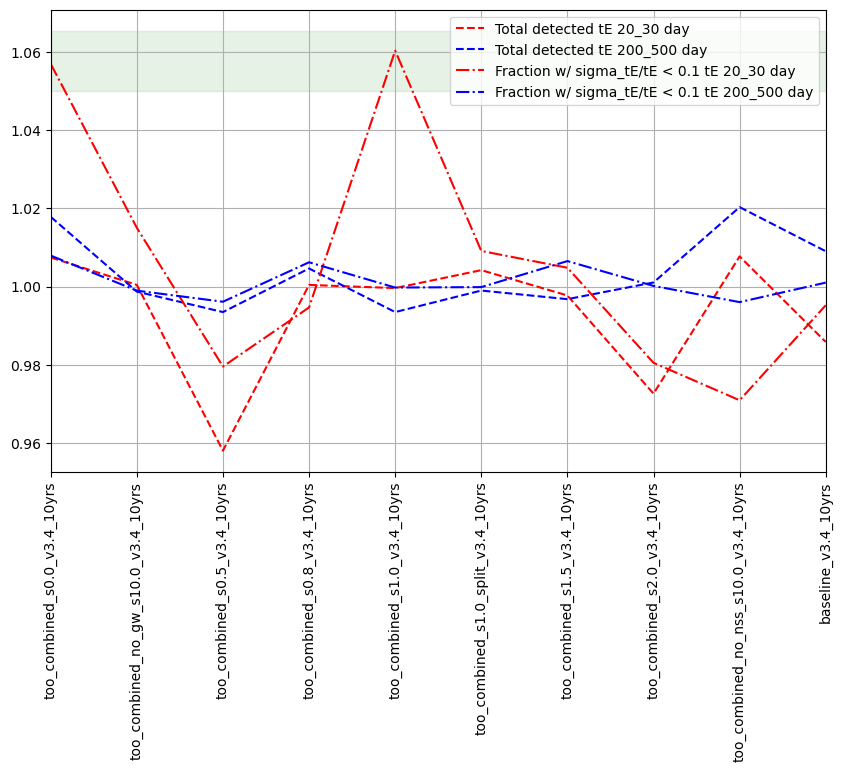

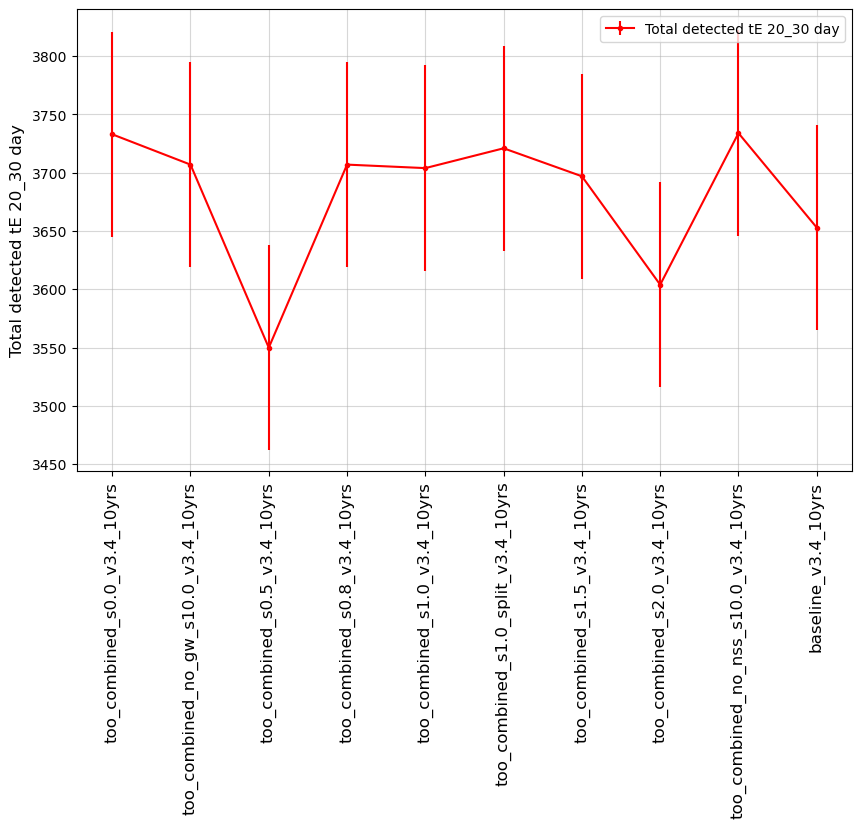

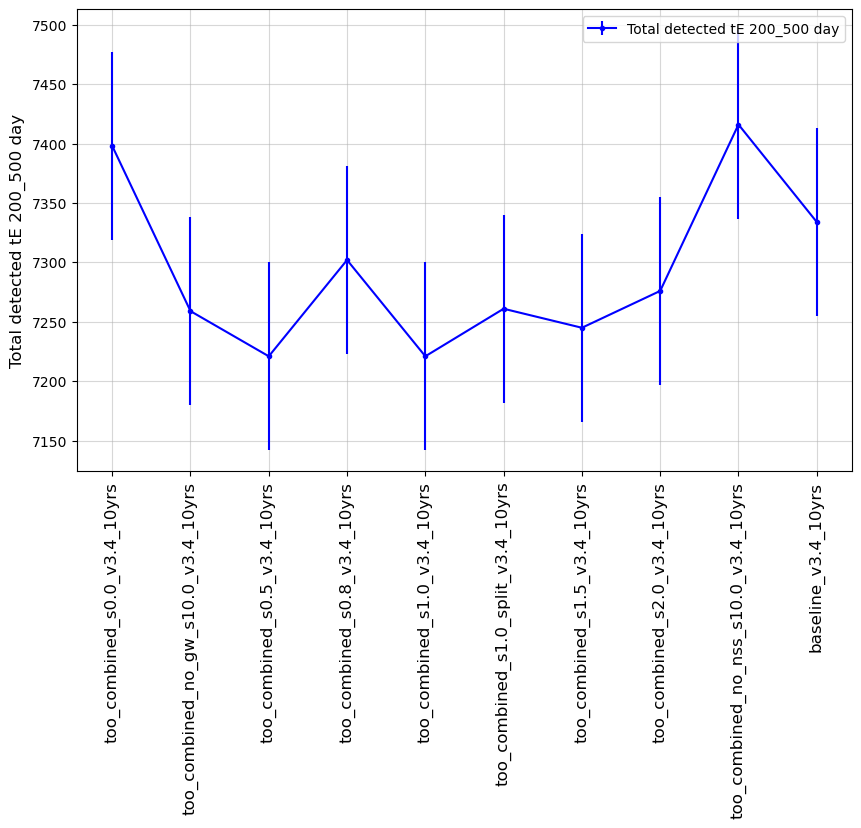

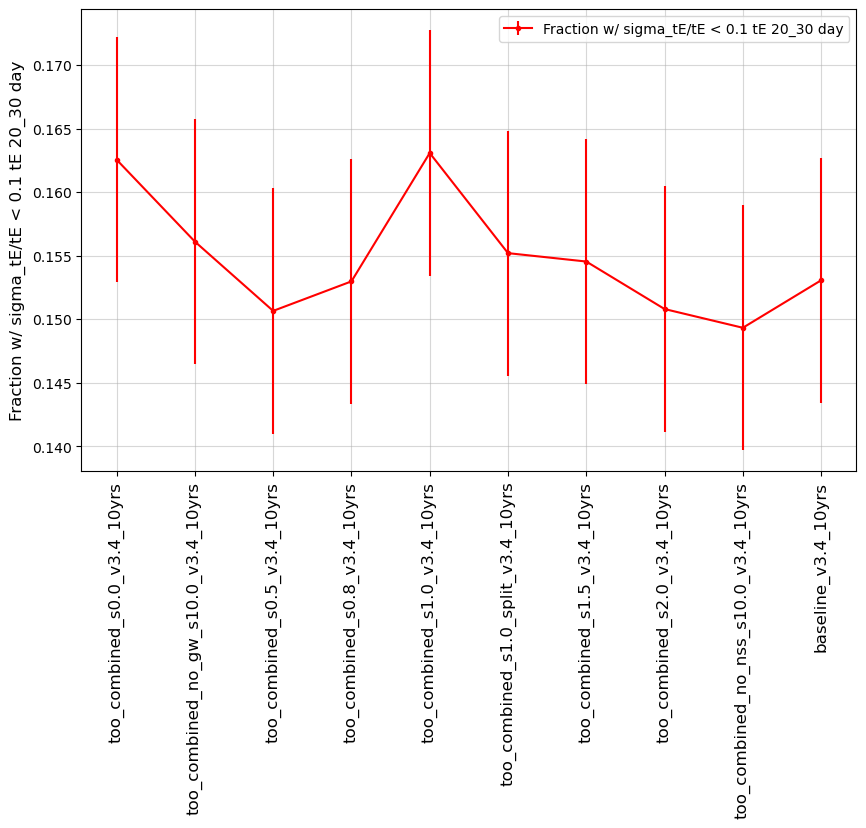

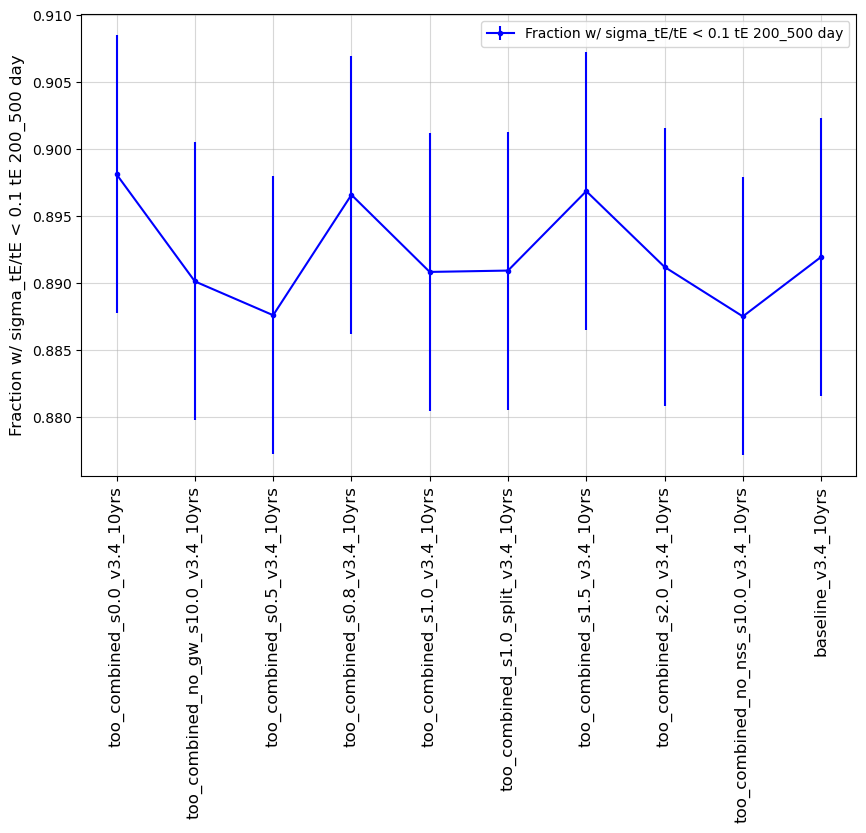

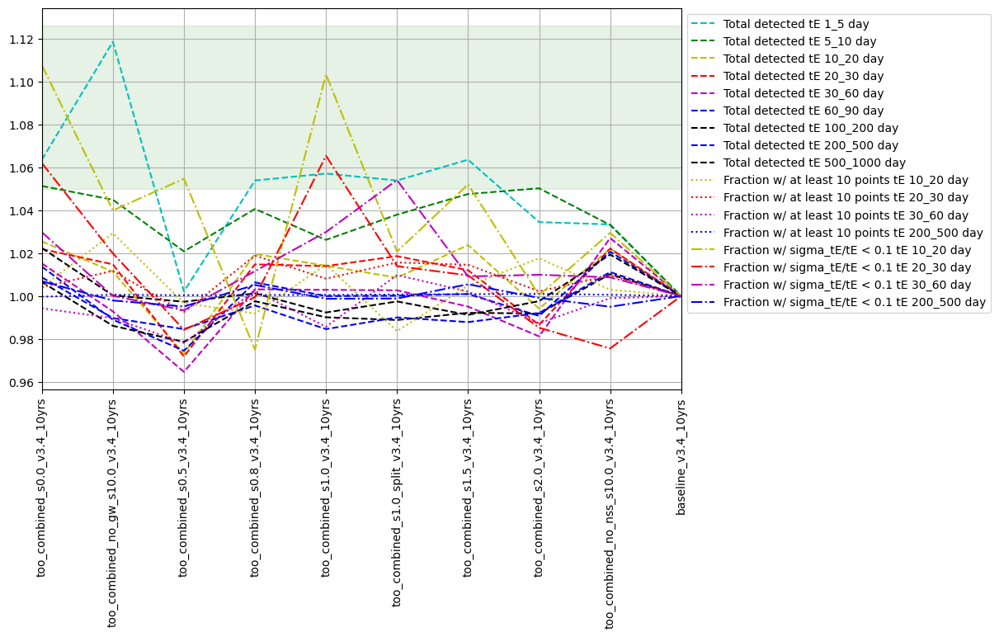

In [160]:
msub = metric_sets.loc['TVS microlensing short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=runs, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=True)

msub = metric_sets.loc['TVS microlensing all']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

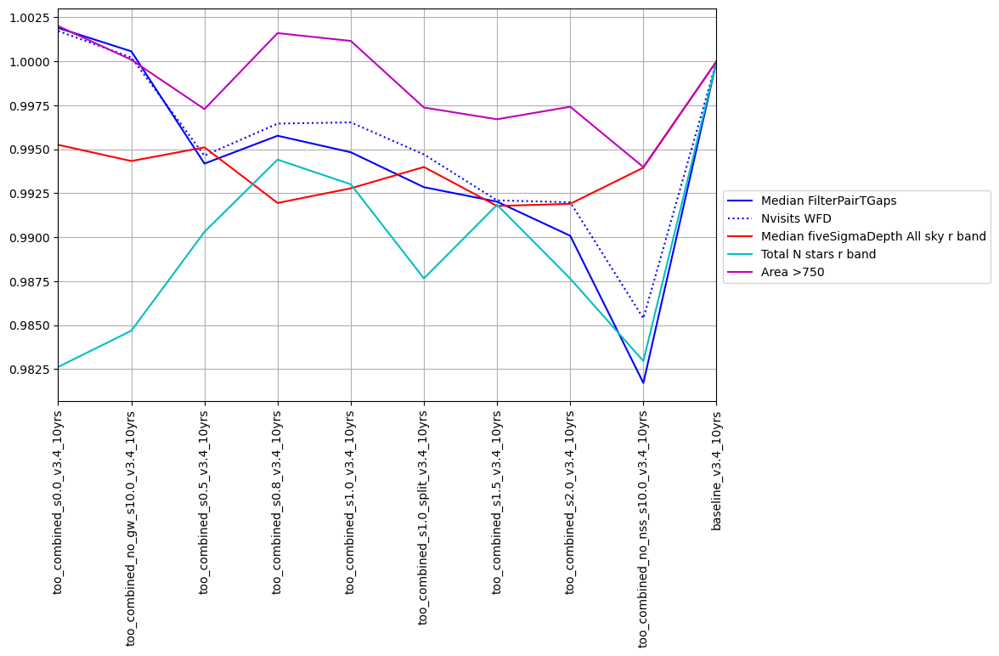

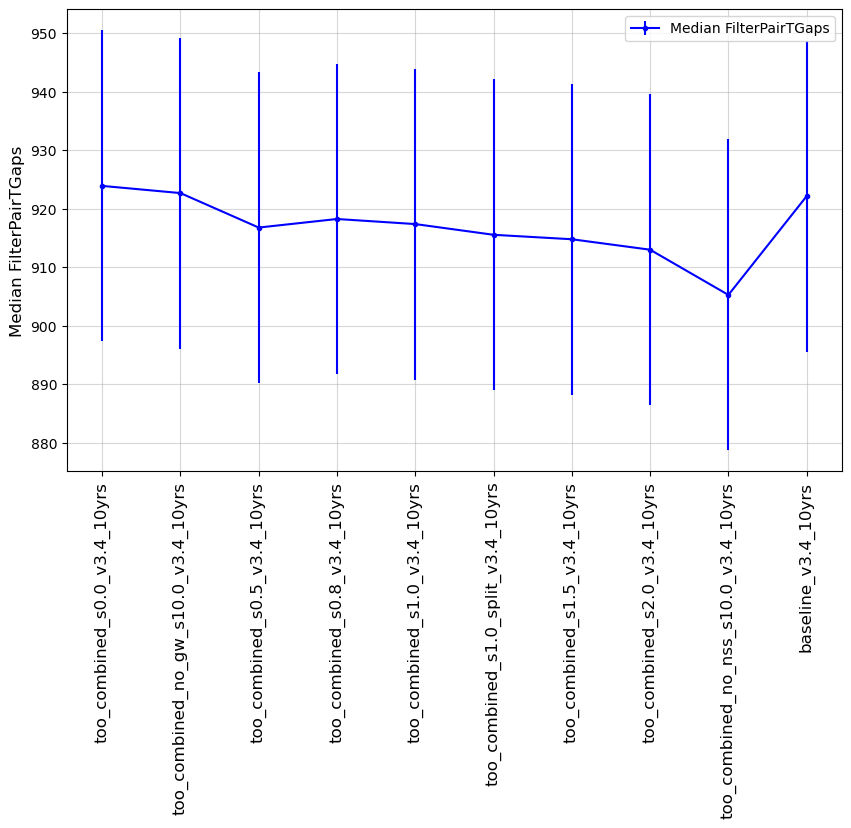

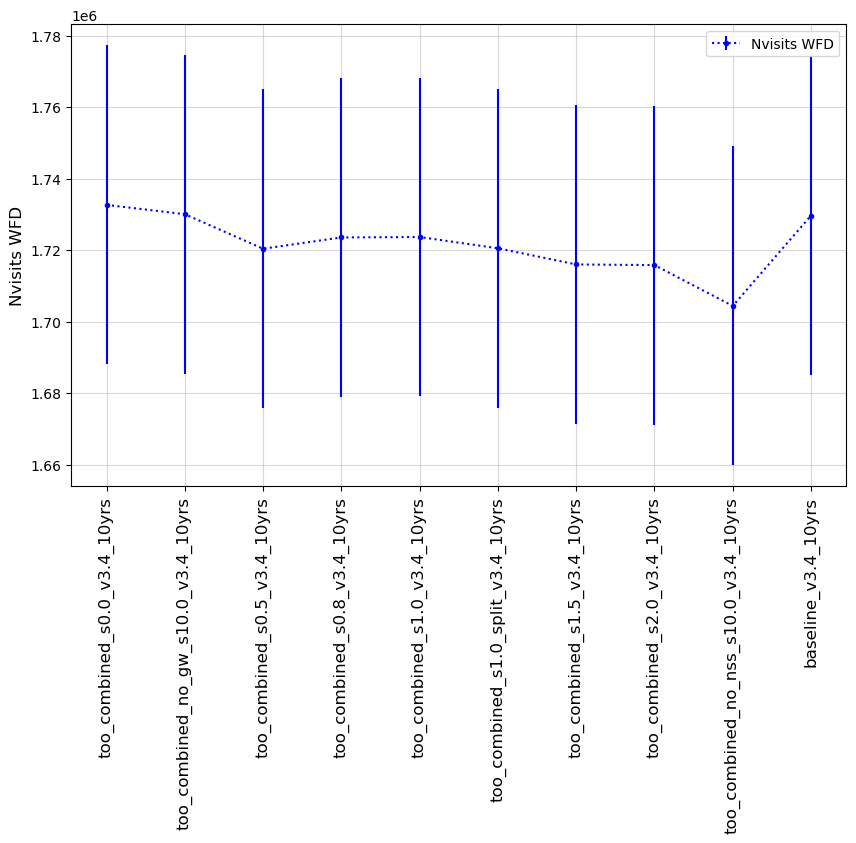

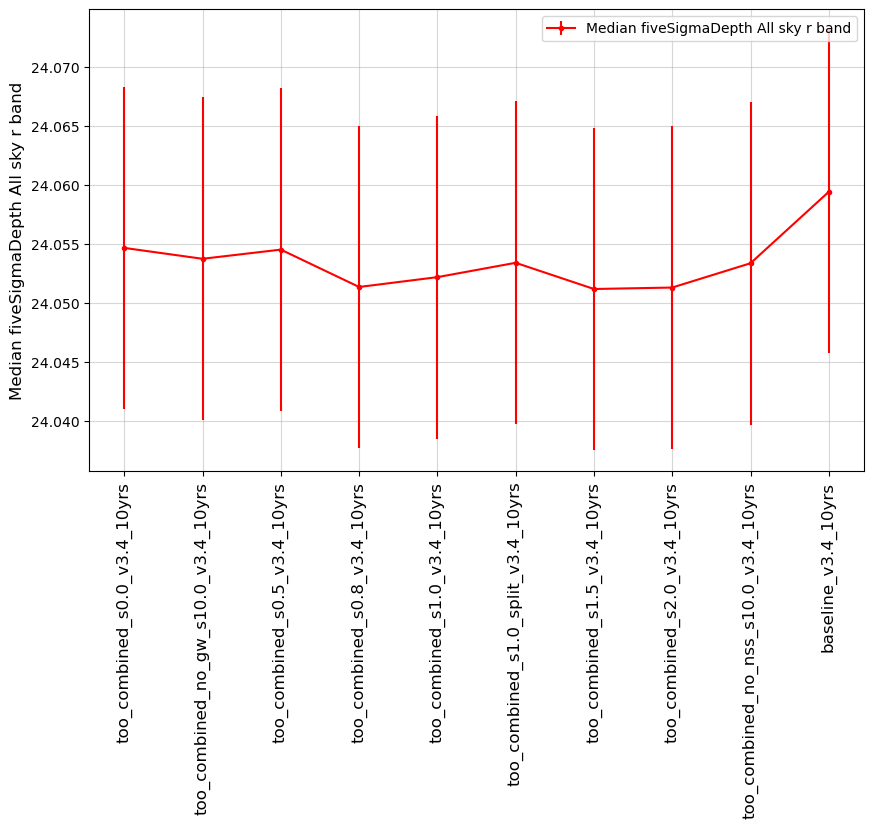

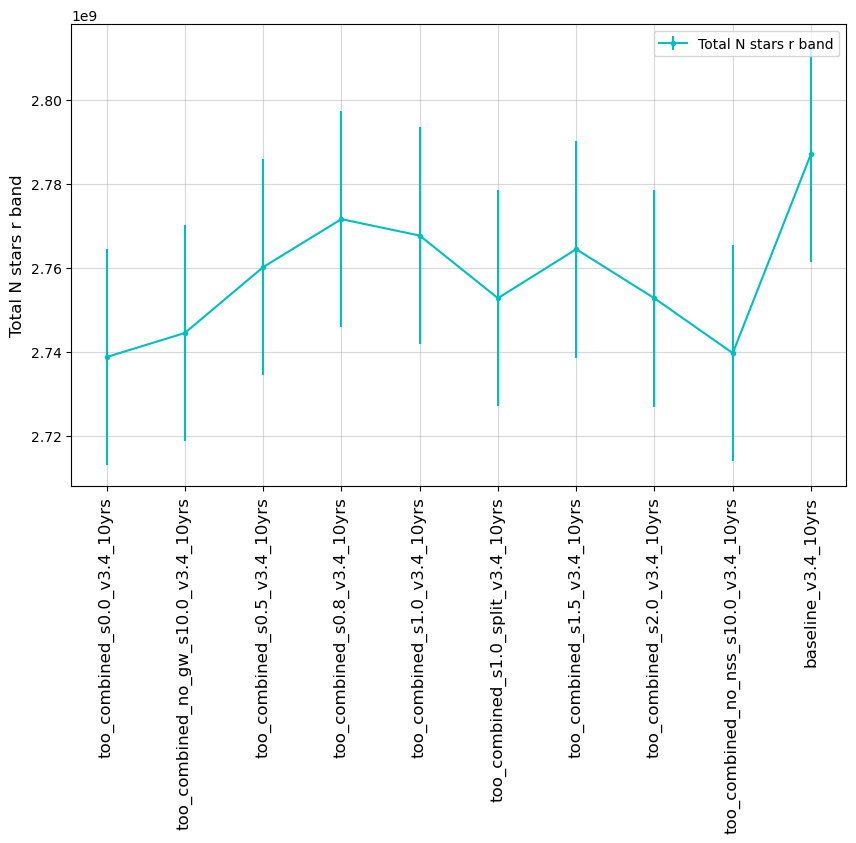

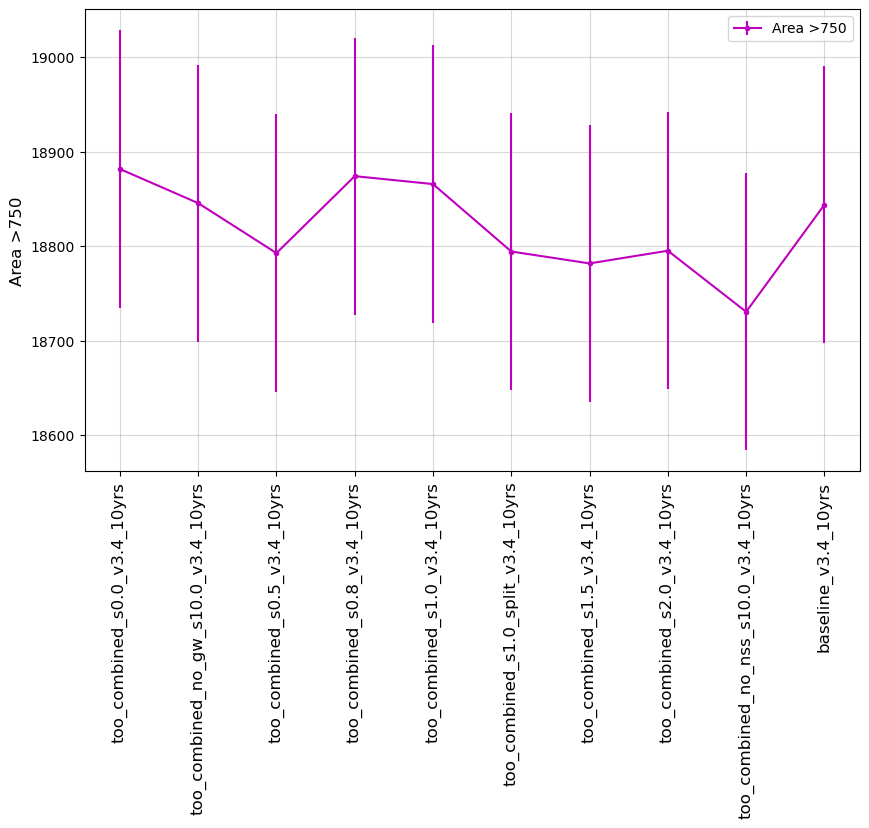

In [161]:
msub = metric_sets.loc['TVS anomalies']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')
ax.legend(loc=(1.01, 0.3))
              
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub)

### Solar System Objects
<a id="SSO"></a>
Metrics related to Solar System Science Collaboration goals. 

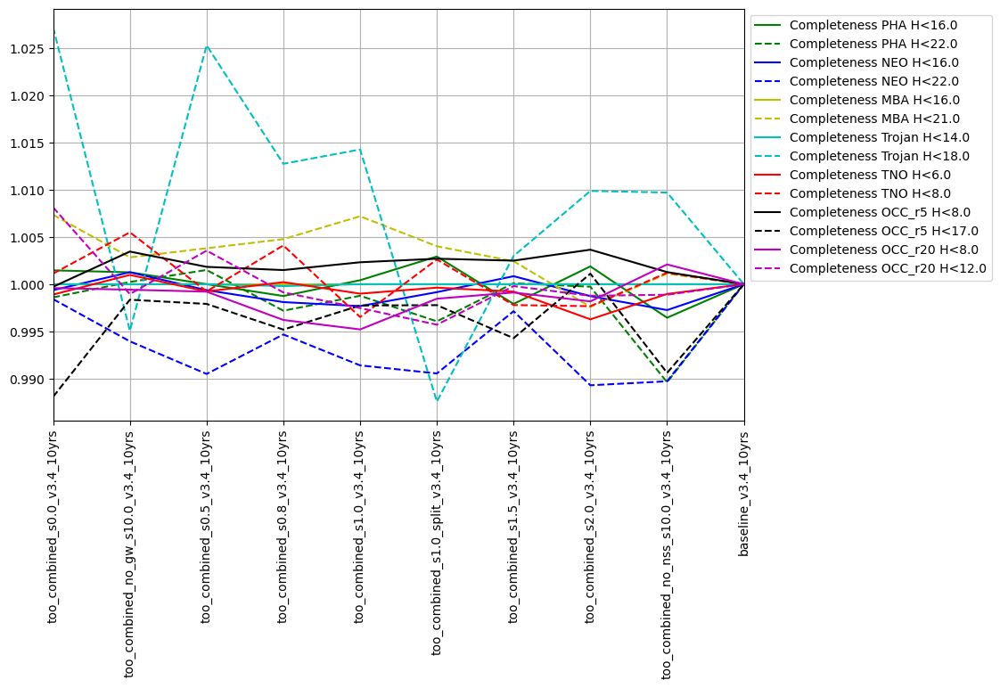

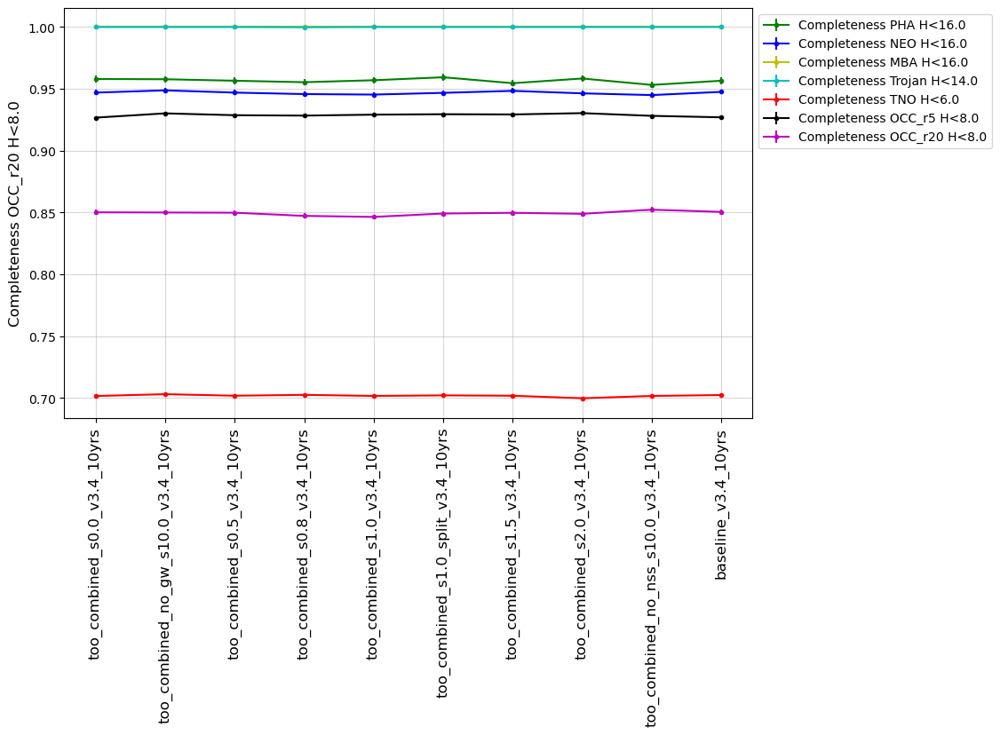

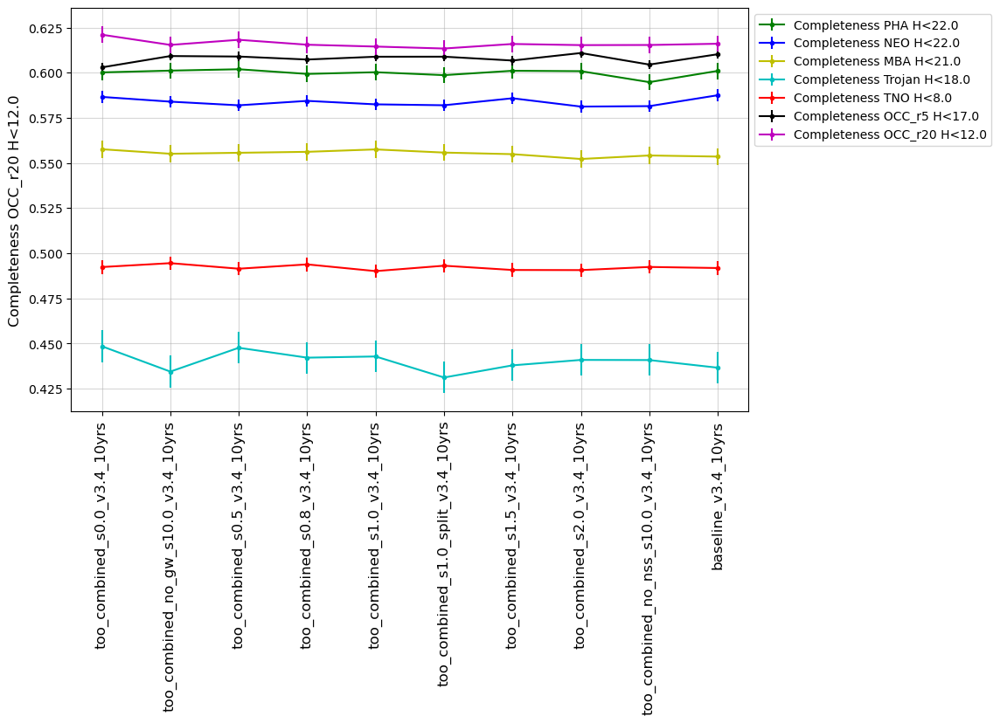

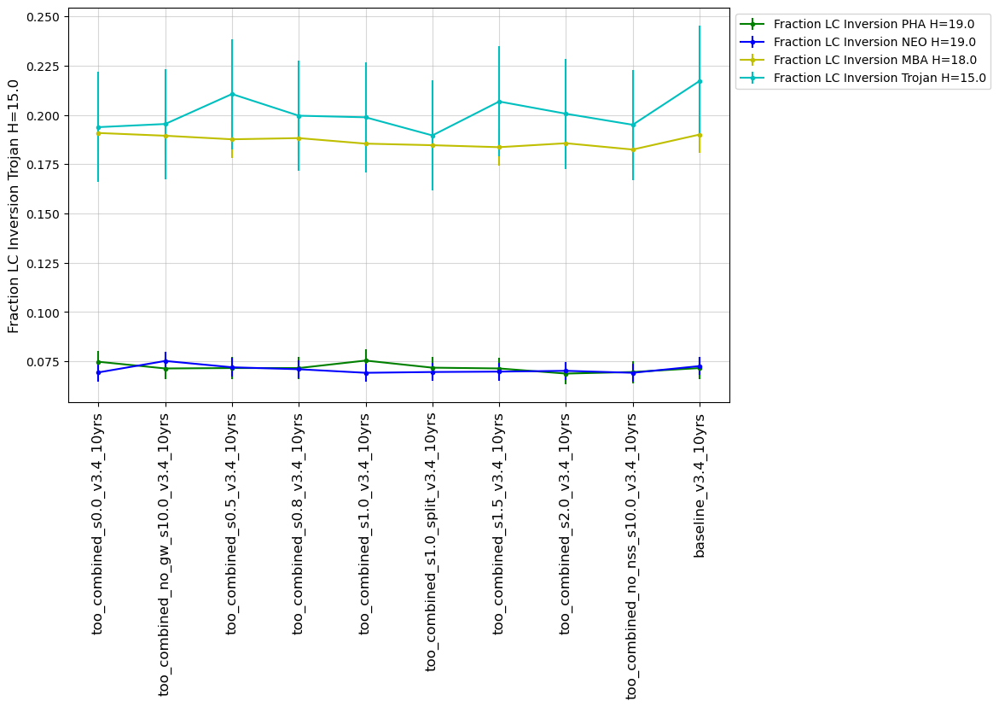

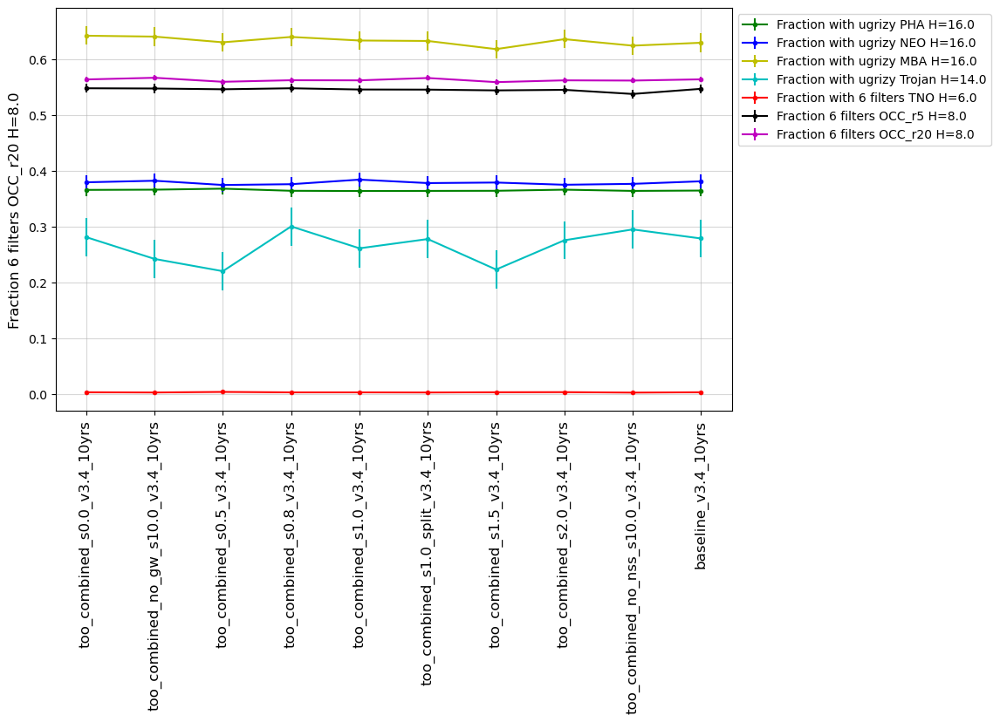

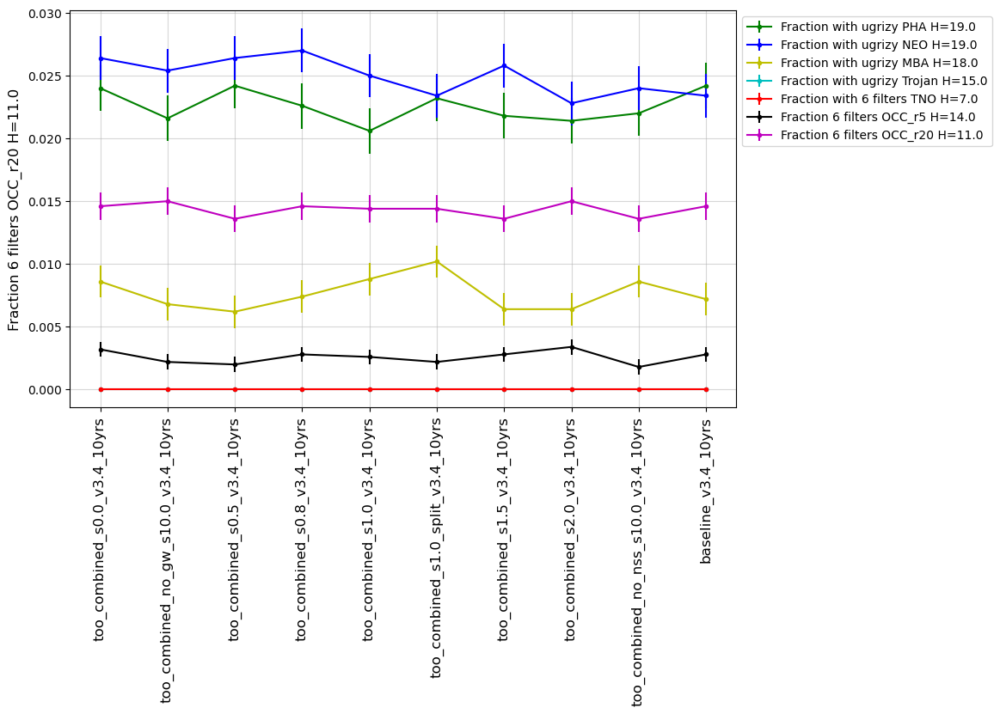

In [162]:
msub = metric_sets.loc['SSO discovery']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metric_sets.loc['SSO discovery'][::2]

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'completeness_bright' + '.png'), format='png')

msub = metric_sets.loc['SSO discovery'][1::2]
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'completeness_faint' + '.png'), format='png')

msub = metric_sets.loc['SSO lightcurve inversion'][1::2]
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'lightcurves_faint' + '.png'), format='png')

msub = metric_sets.loc['SSO fraction 6 bands'][::2]
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'colors6_bright' + '.png'), format='png')

msub = metric_sets.loc['SSO fraction 6 bands'][1::2]
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'colors6_faint' + '.png'), format='png')

### AGN
<a id="AGN"></a>
Metrics contributed by the Active Galactic Nuclei science collaboration.

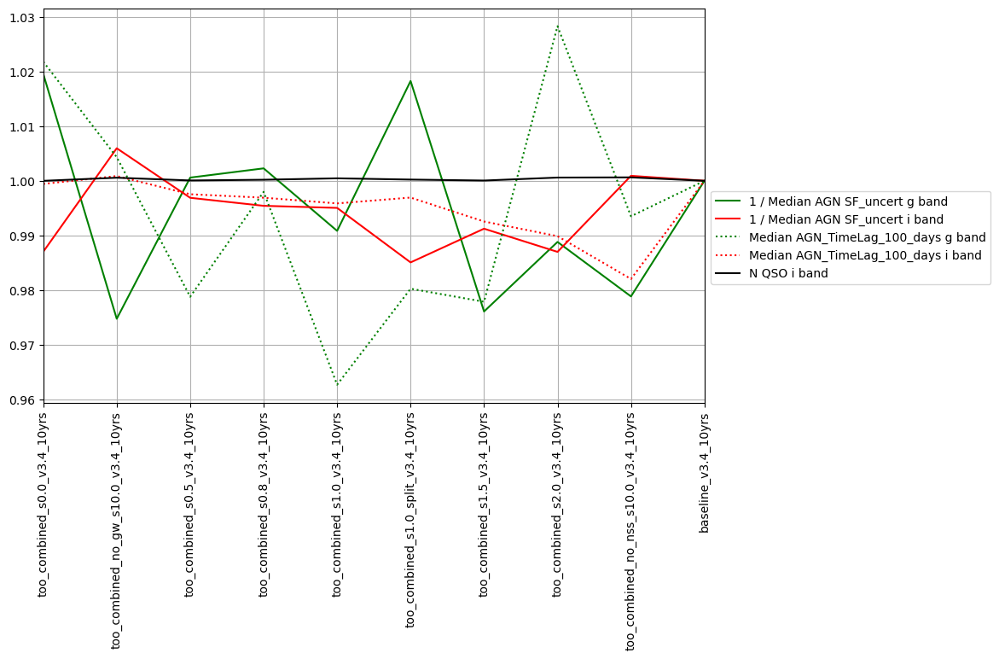

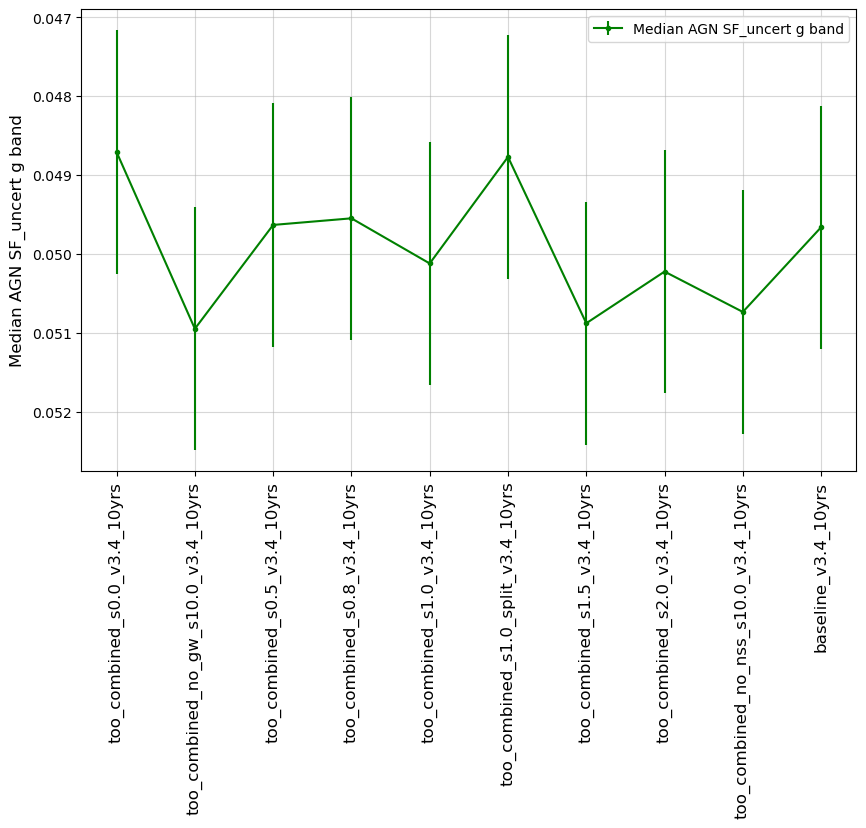

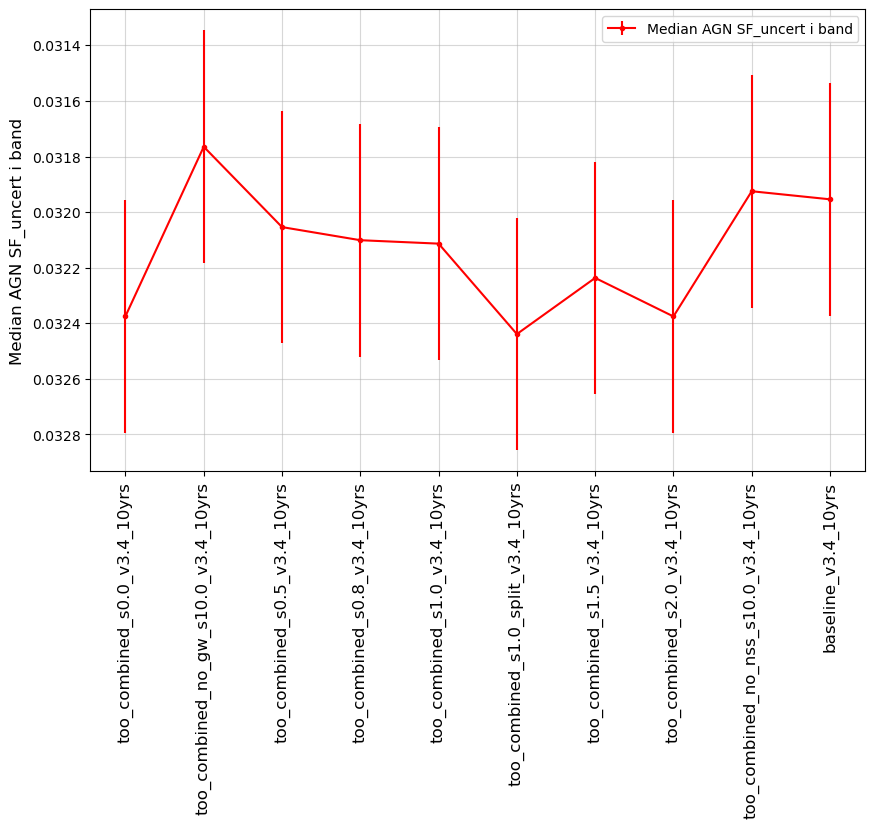

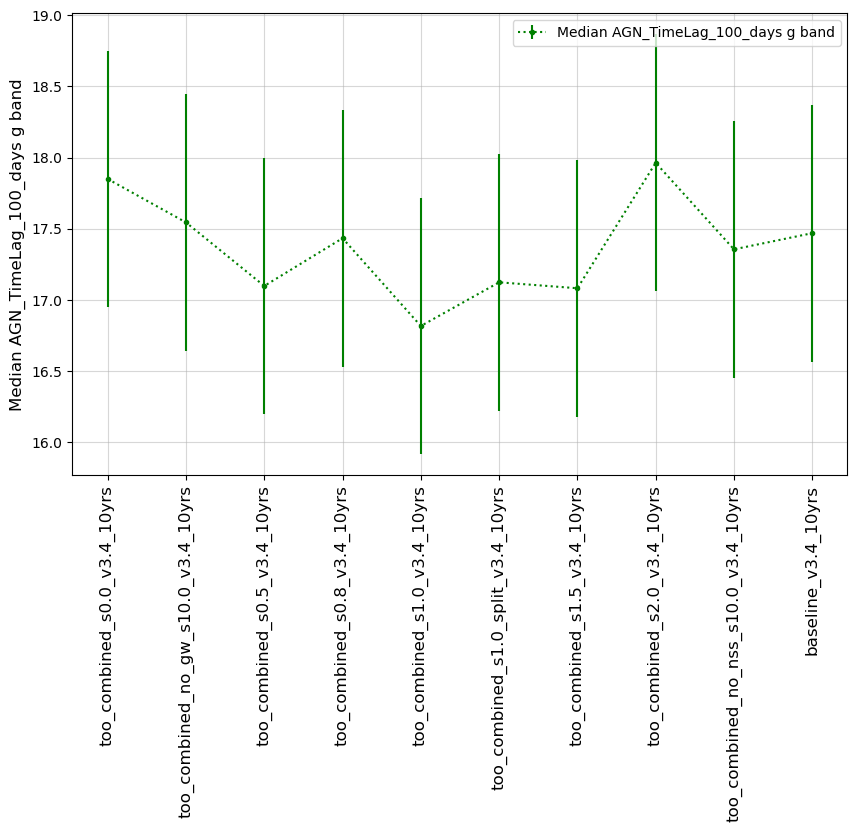

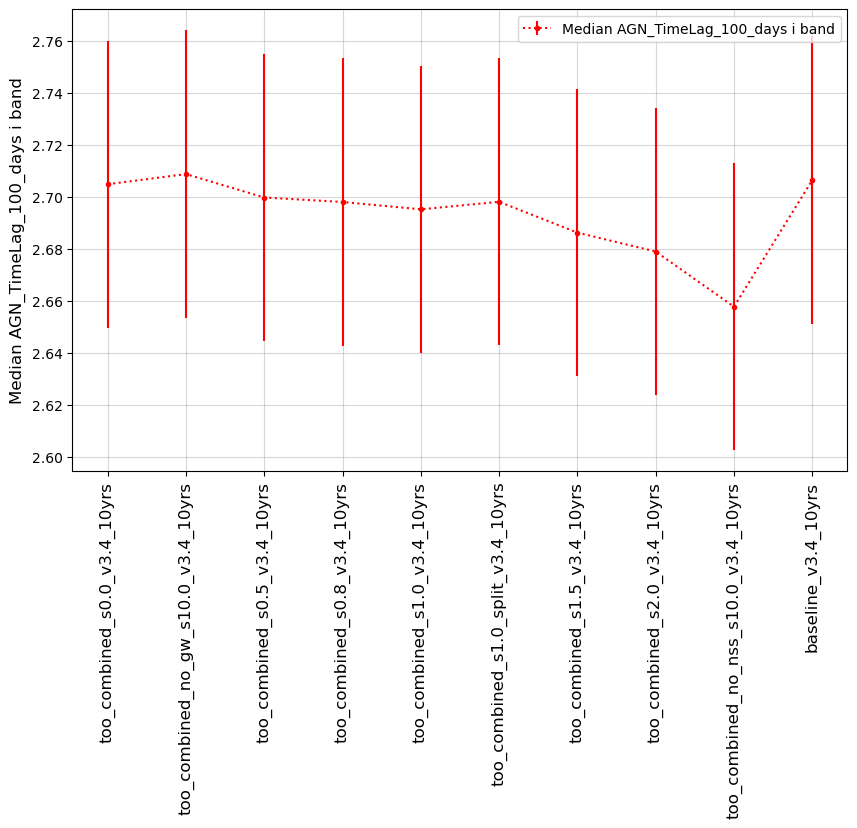

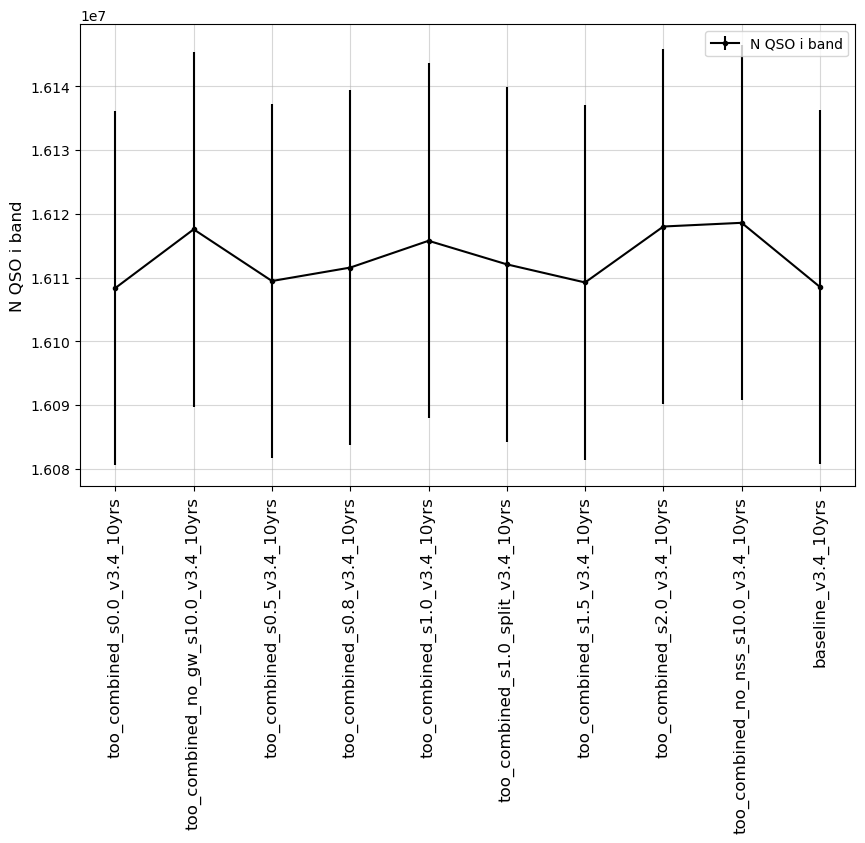

In [163]:
msub = metric_sets.loc['AGN short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')
ax.legend(loc=(1.01, 0.3))
              
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=True)

### Galaxies
<a id="Galaxies"></a>
Metrics evaluating the total number of galaxies expected in the survey.

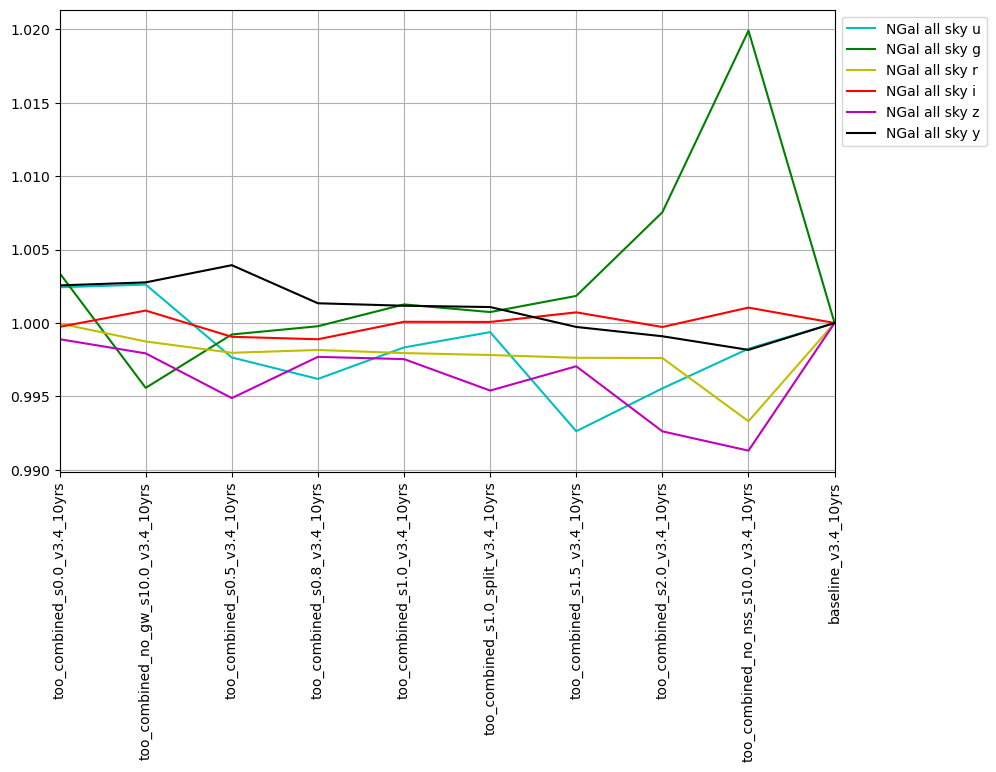

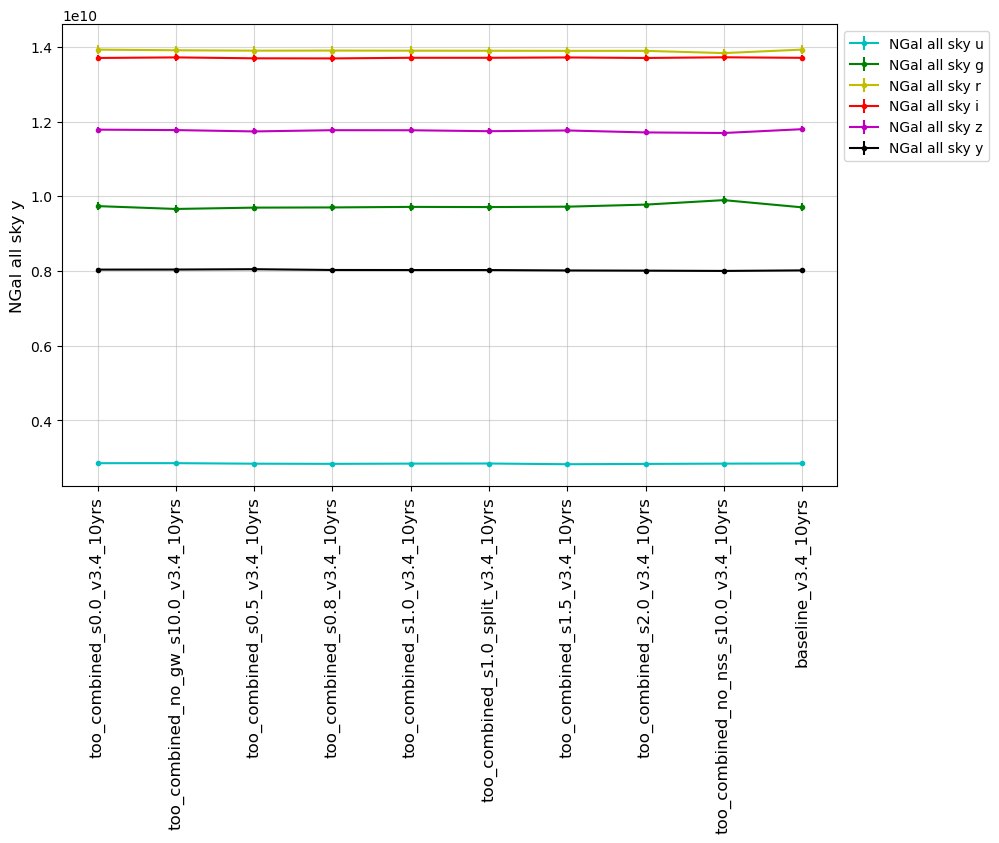

In [164]:
msub = metric_sets.loc['galaxies']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=False)

### Strong Lensing
<a id="StrongLensing"></a>
Metrics contributed by the Strong Lensing Science Collaboration. 

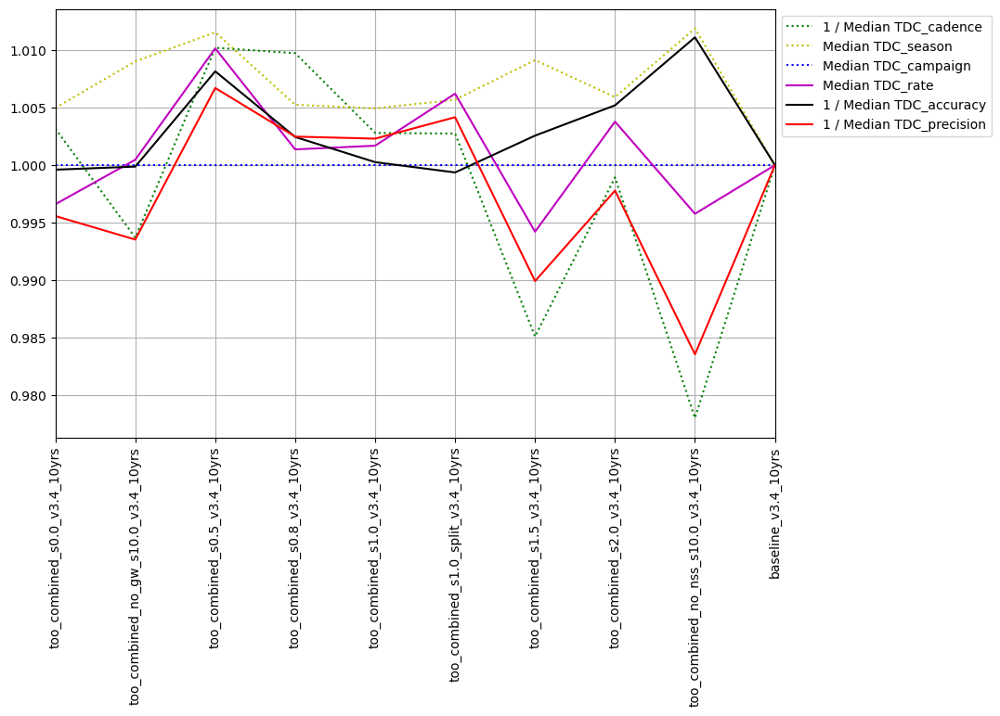

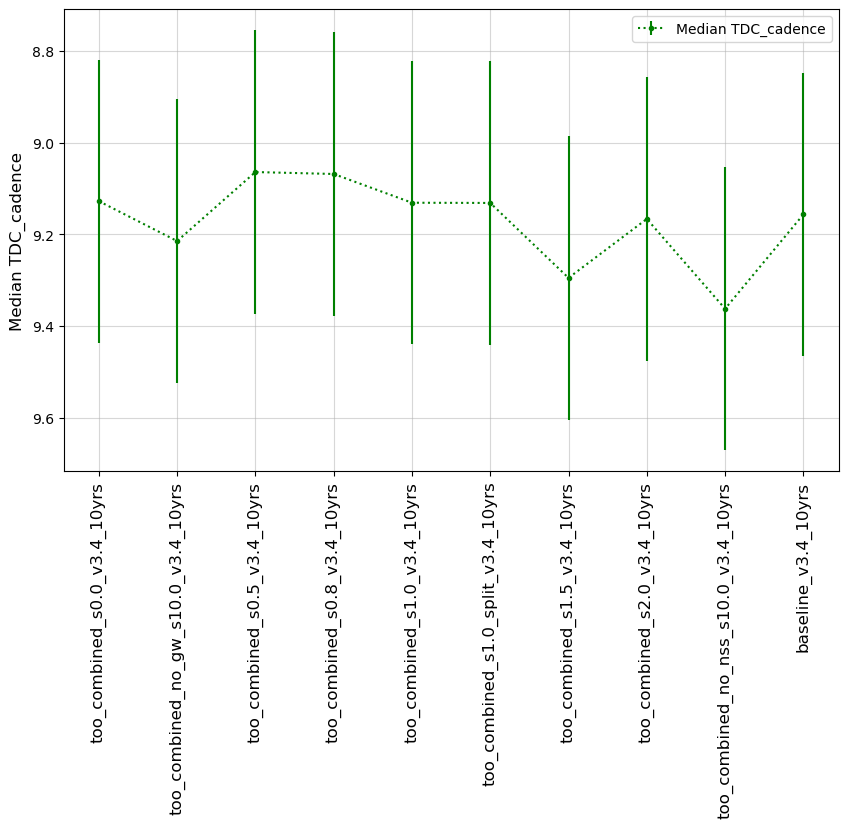

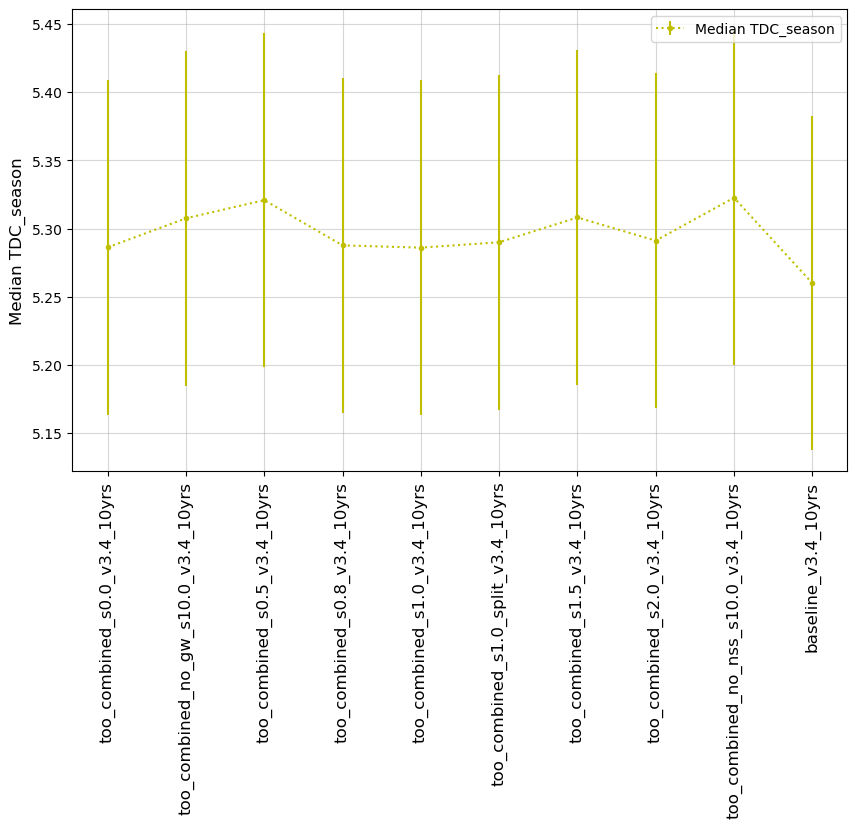

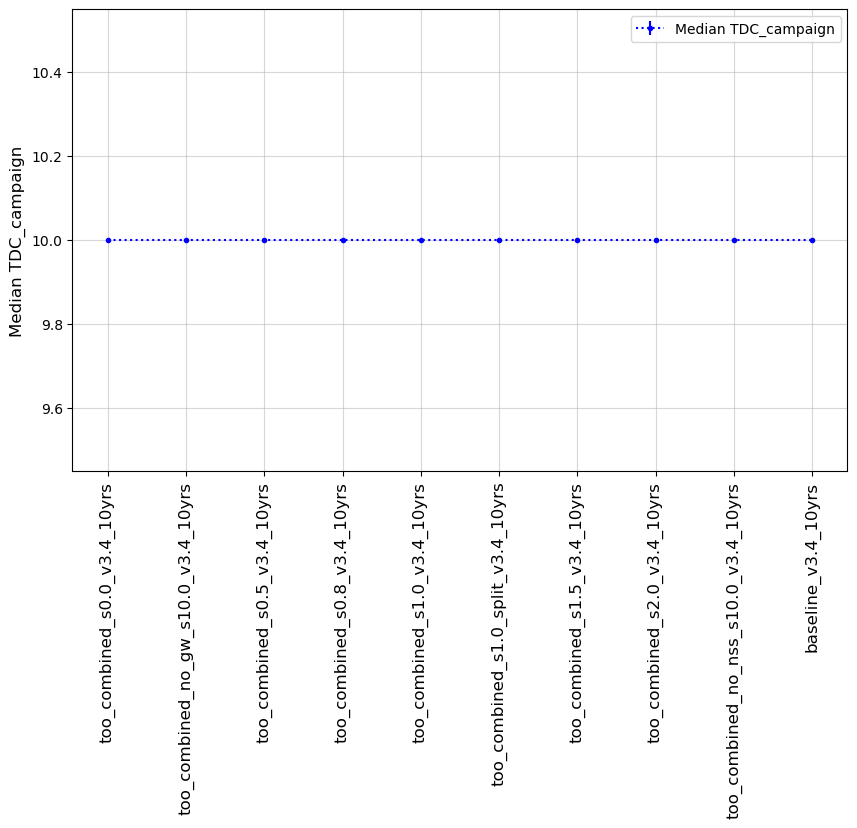

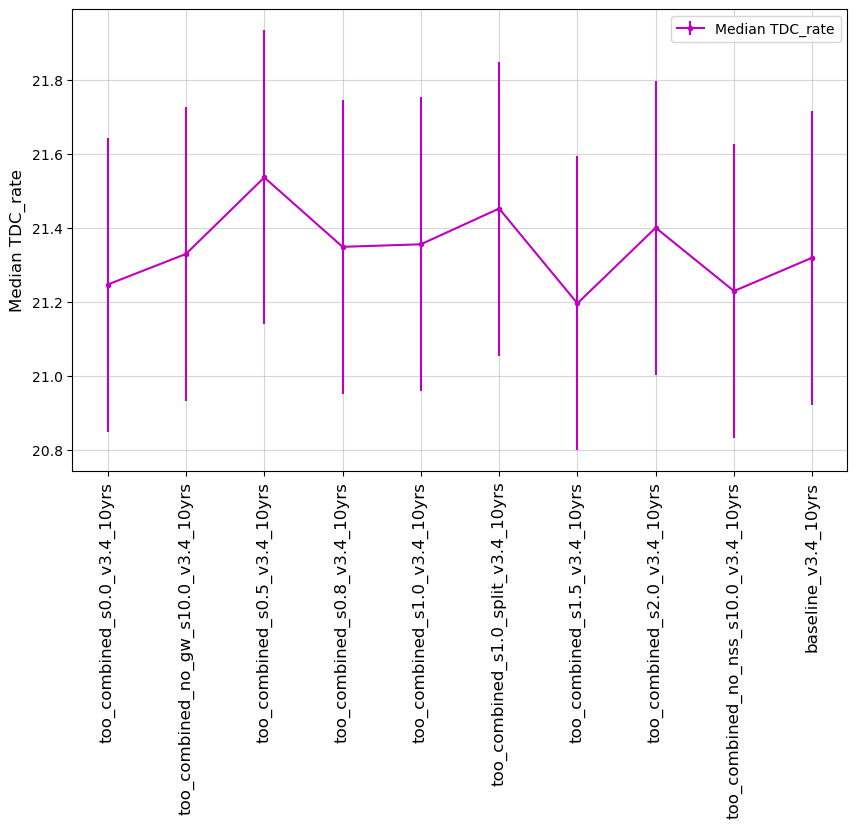

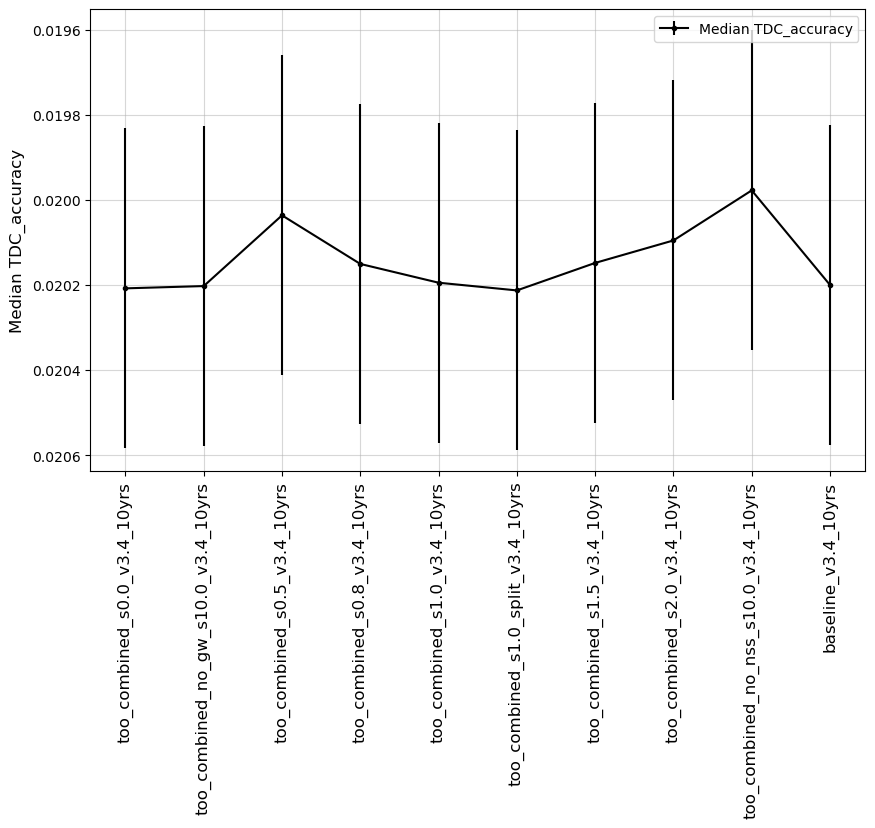

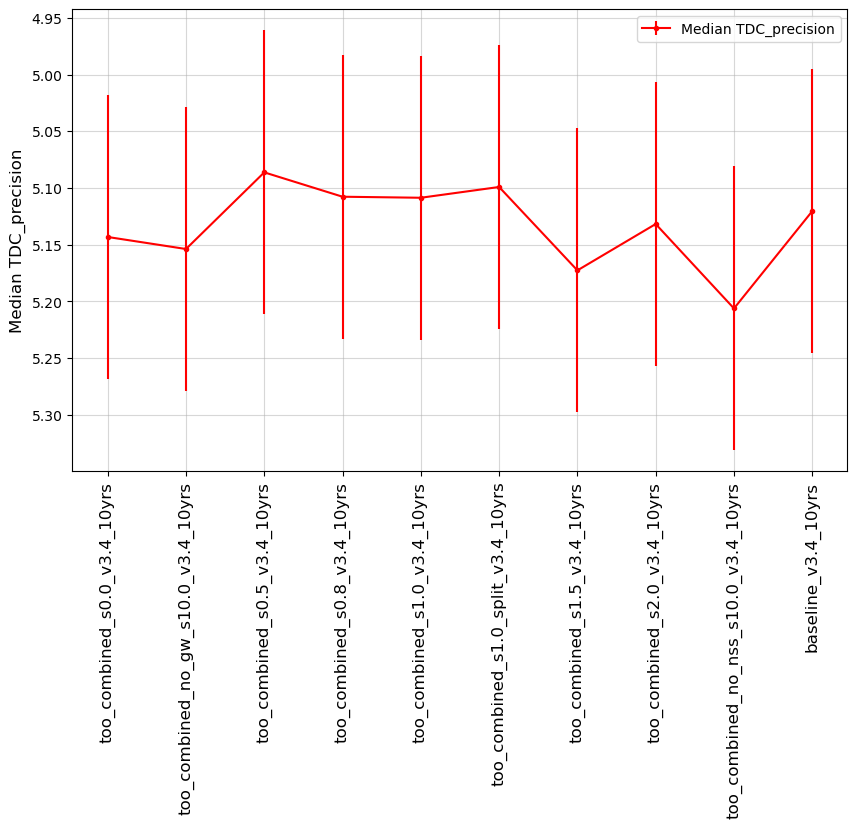

In [165]:
msub = metric_sets.loc['SL TDC']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=True)

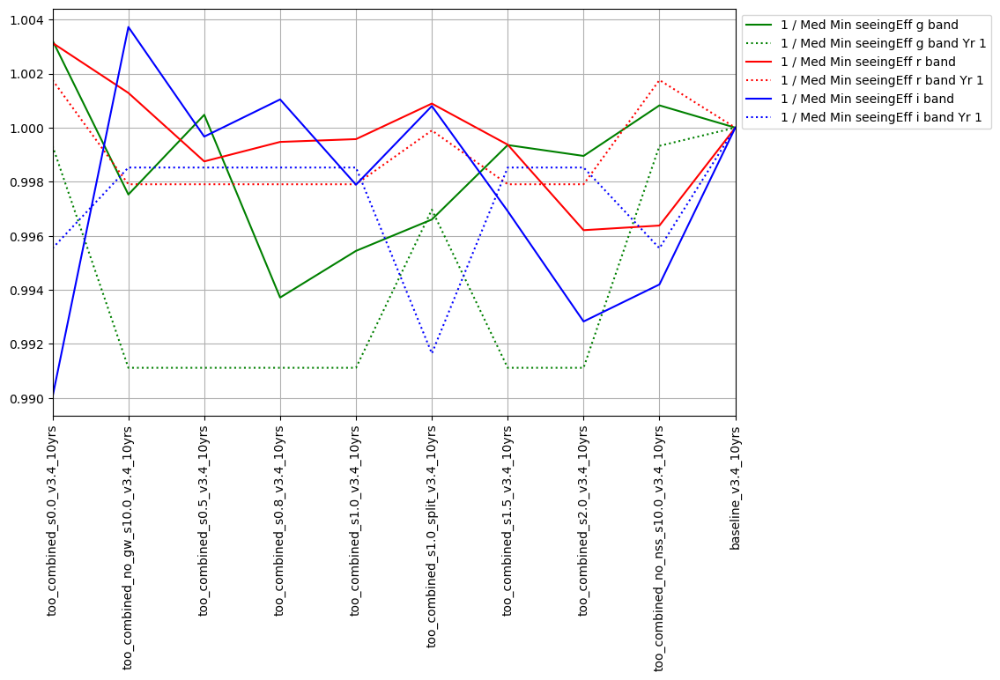

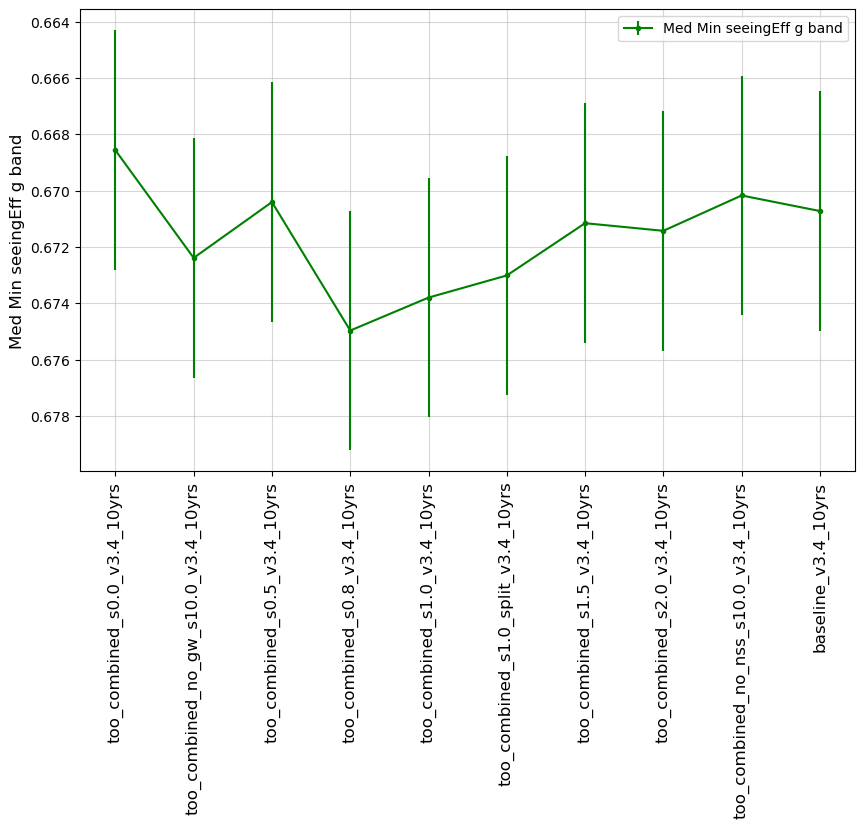

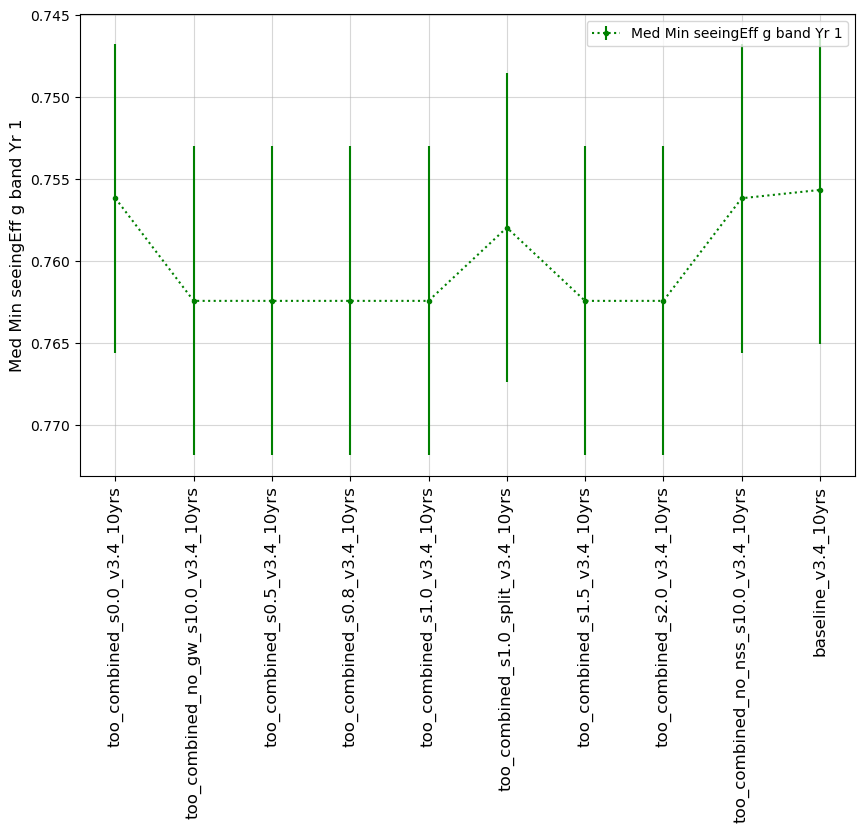

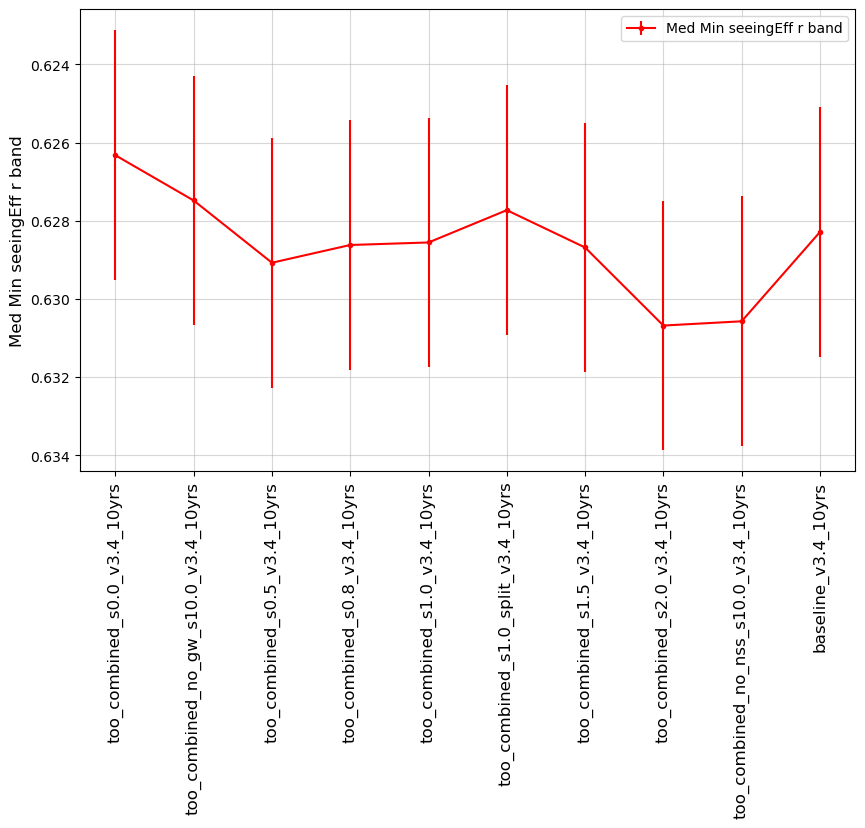

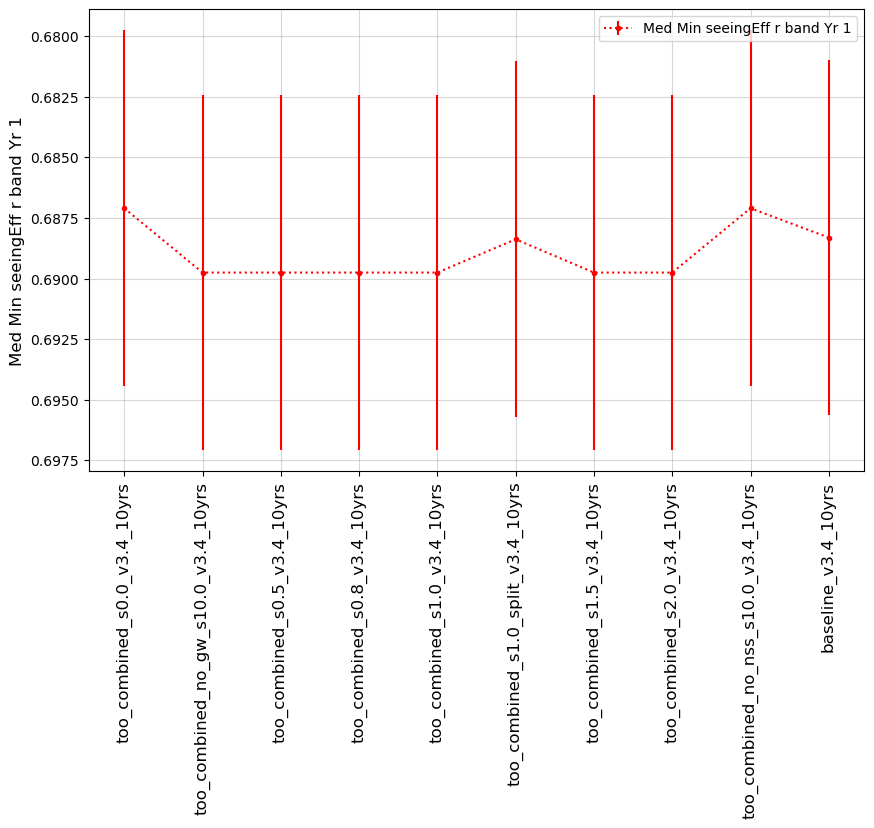

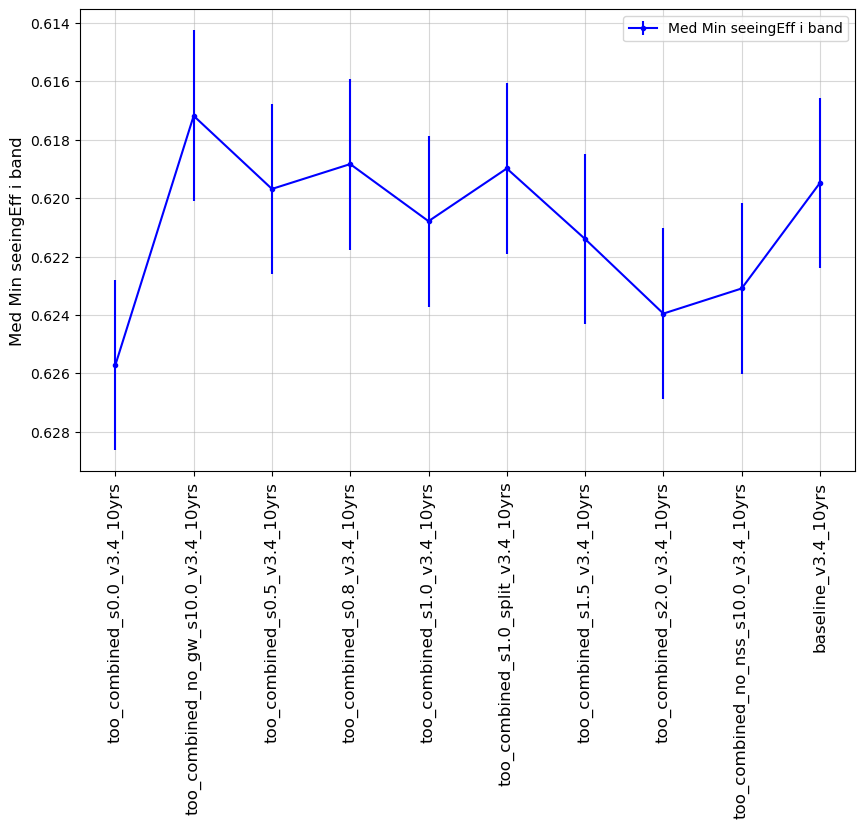

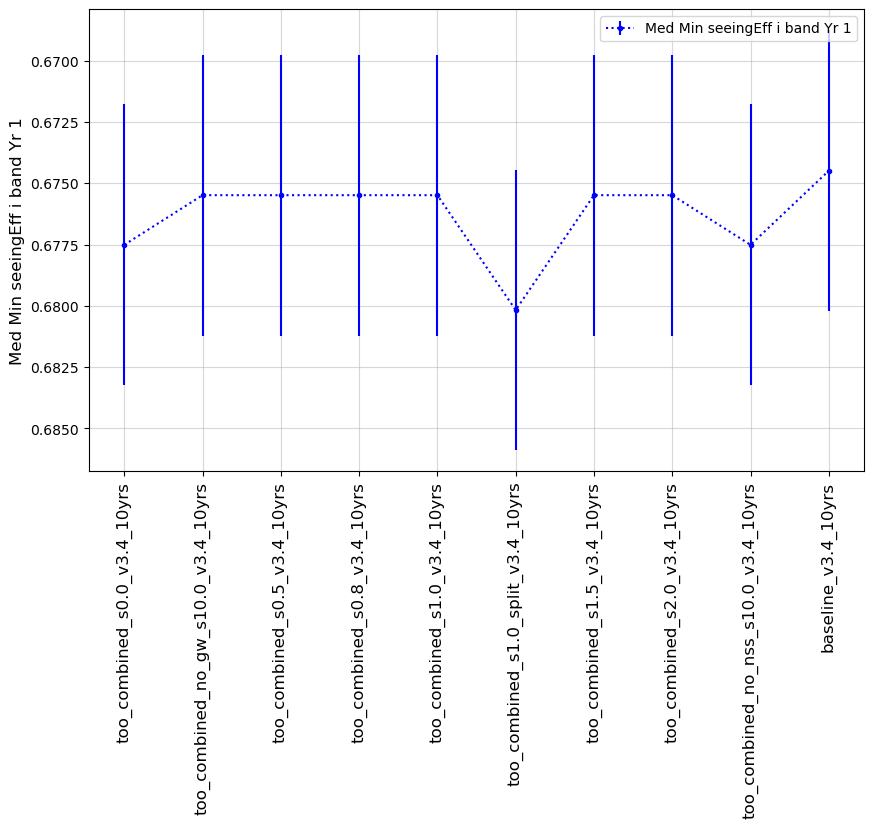

In [166]:
msub = metric_sets.loc['SL IQ']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline,
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=True)

### Stars
<a id="Stars"></a>
Metrics considering total number of stars available in the survey. 

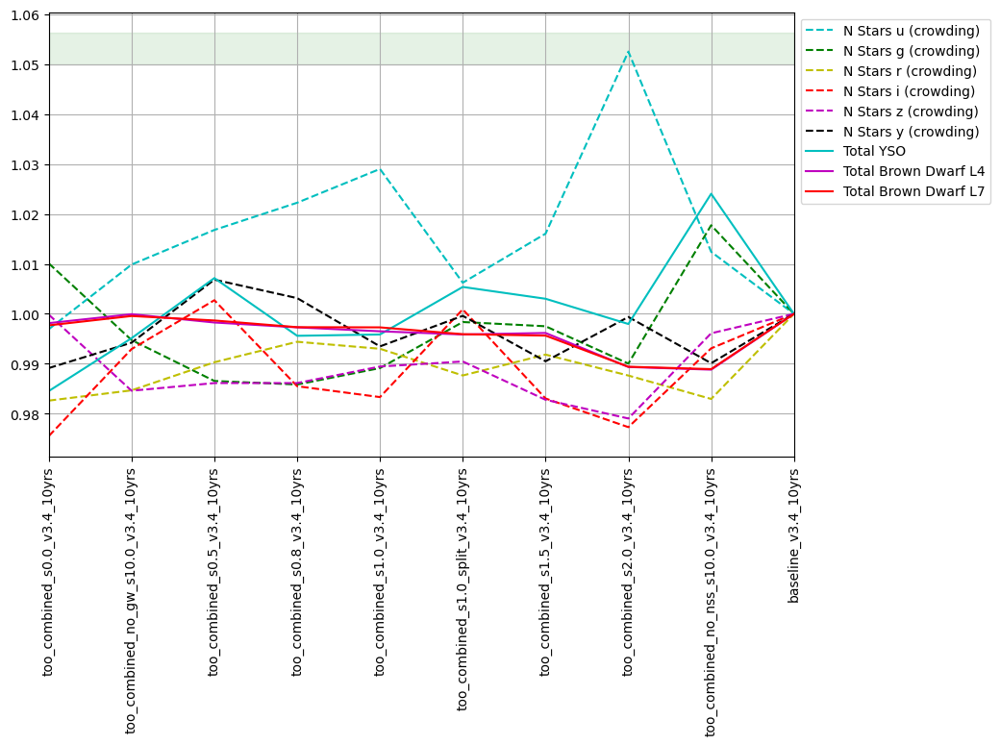

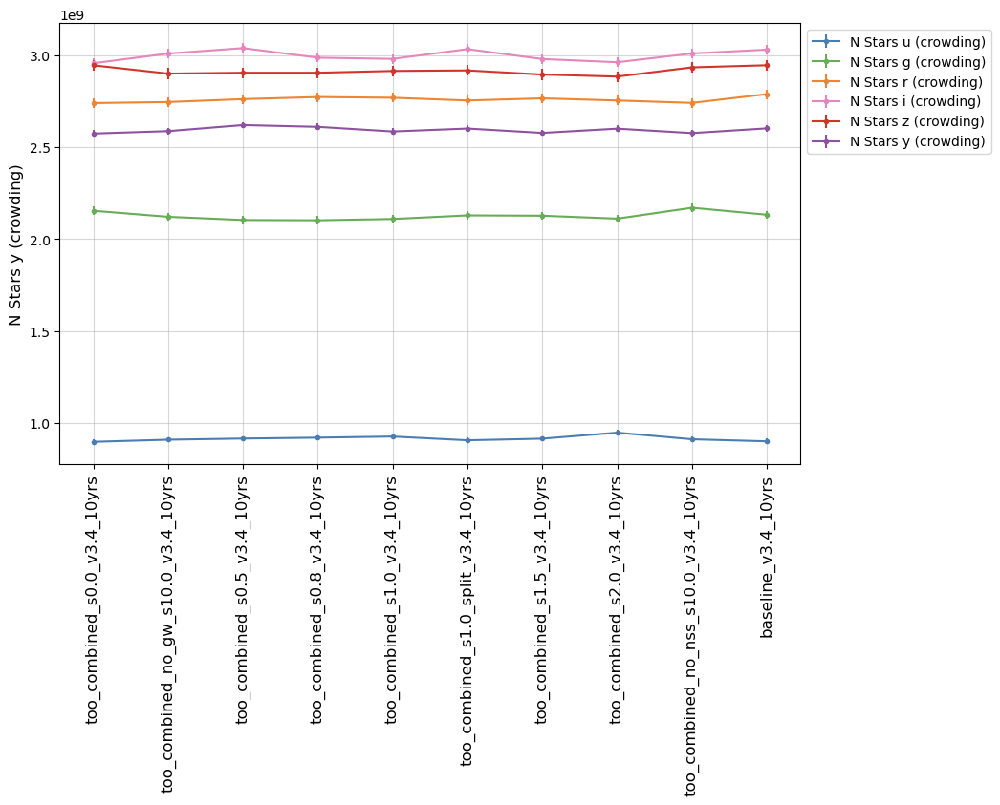

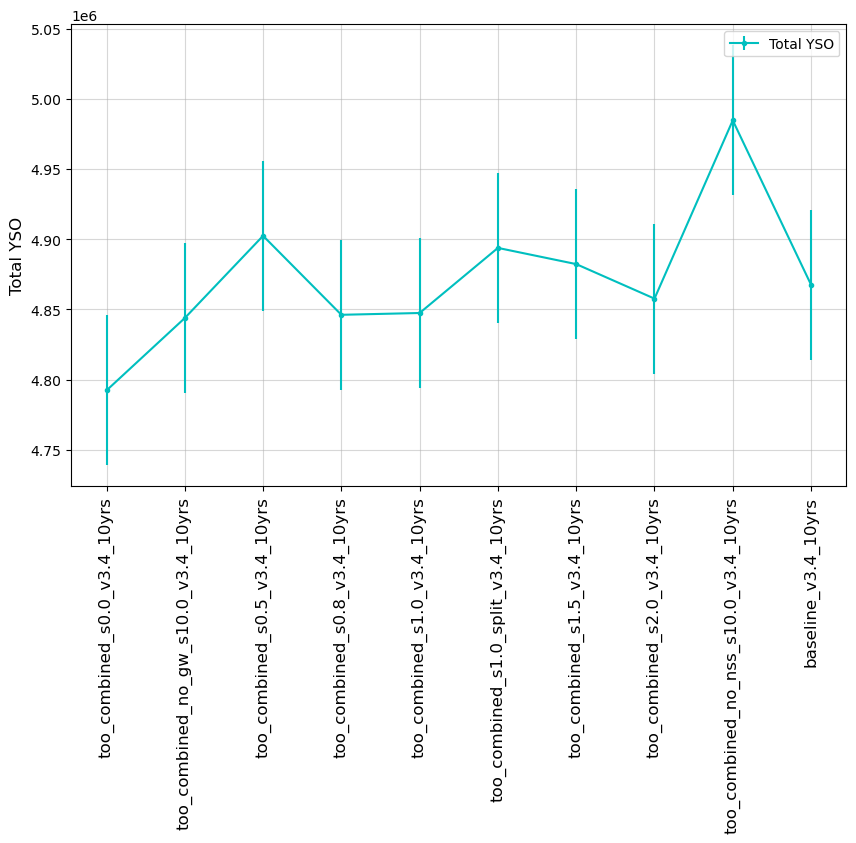

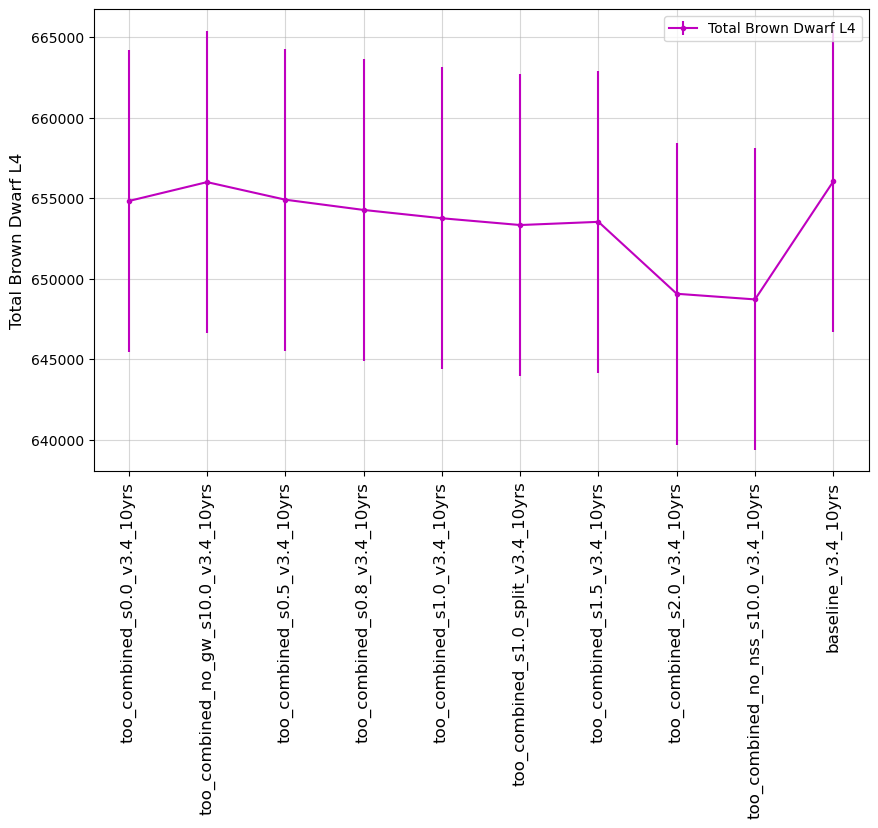

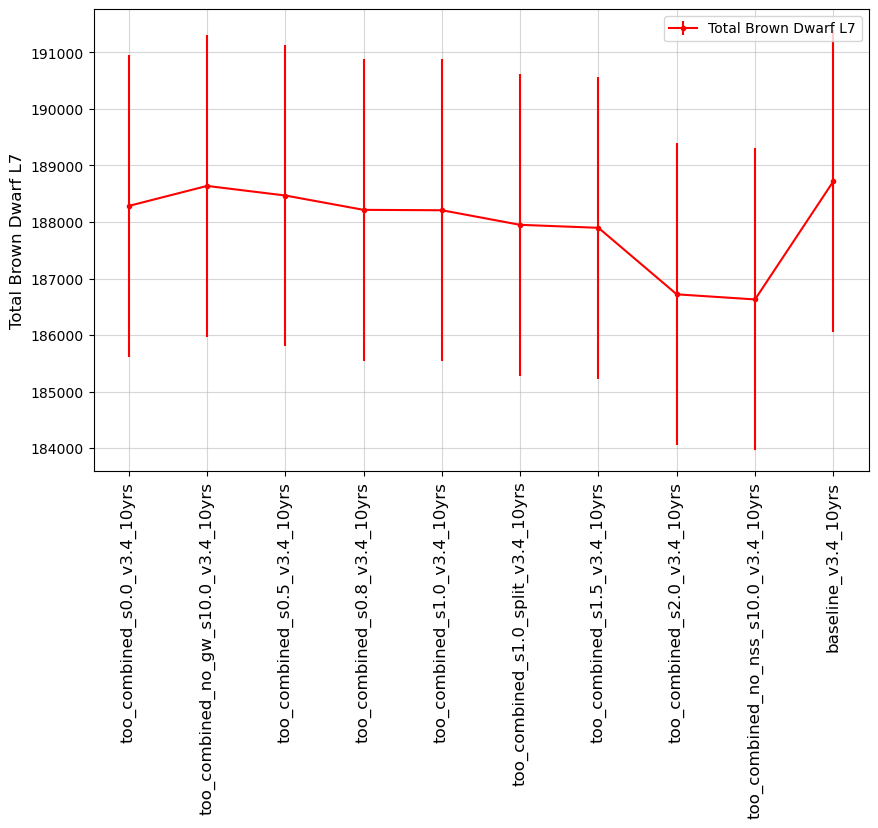

In [167]:
msub = metric_sets.loc['Stars']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metric_sets.loc['Stars'][0:6]
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_set=msub, sep_plots=False)

msub = metric_sets.loc['Stars'][6:]
fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=True)

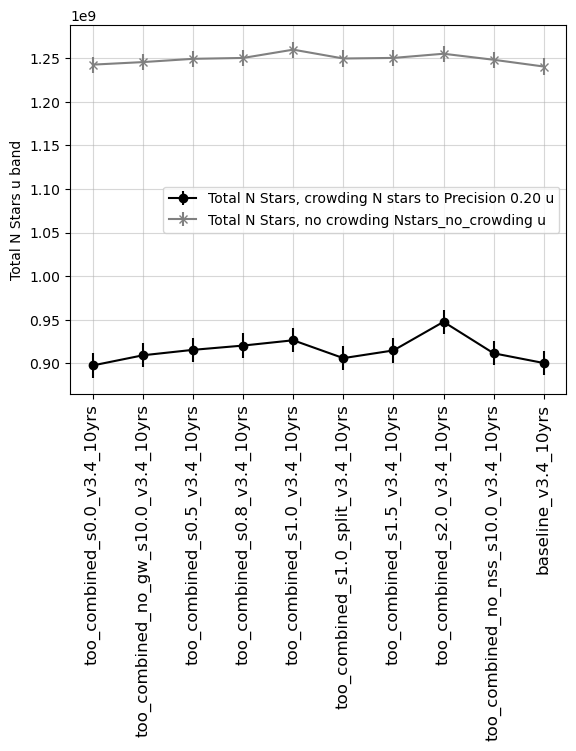

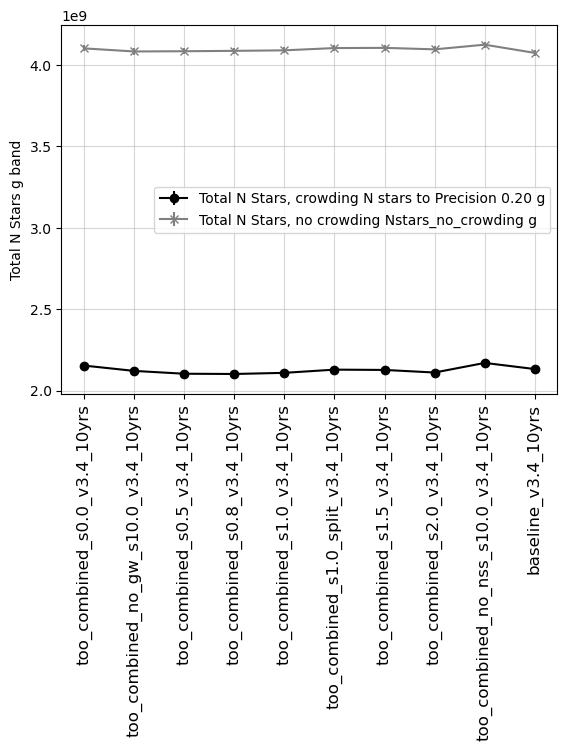

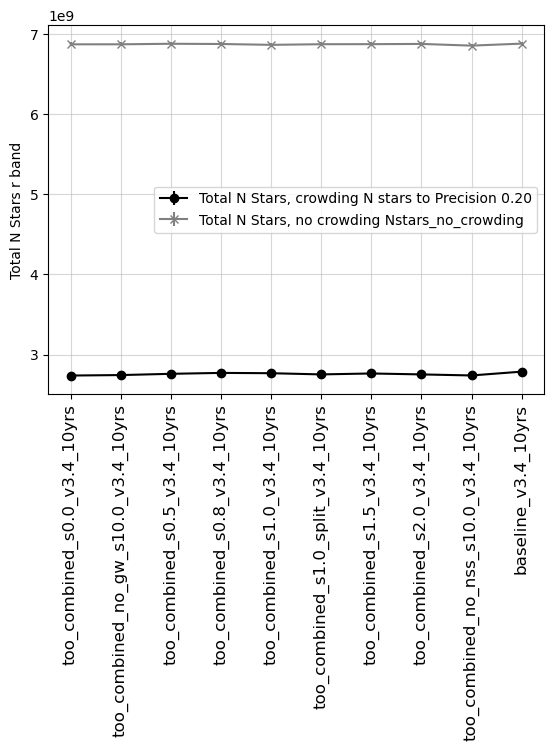

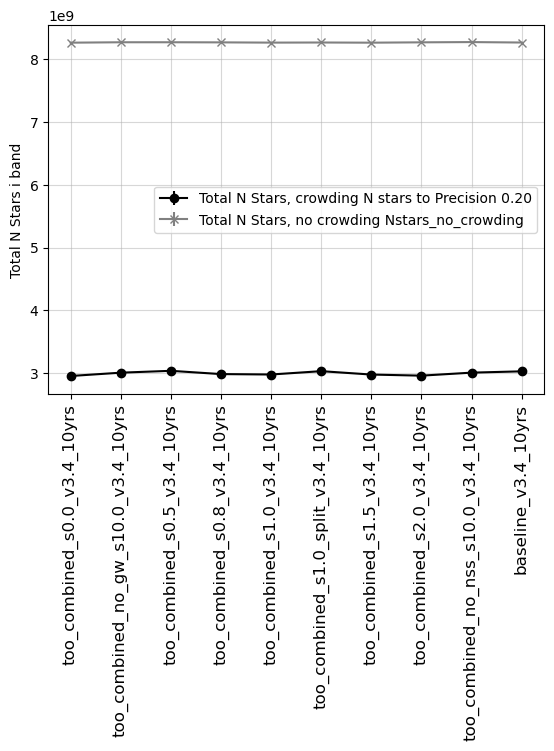

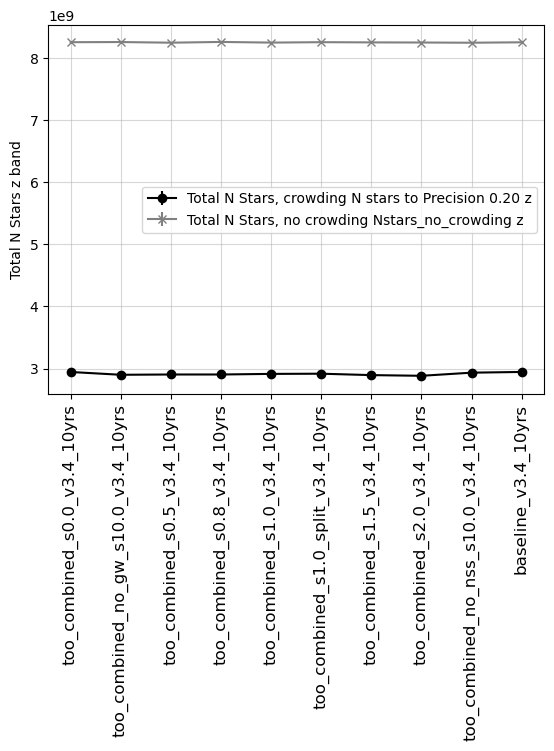

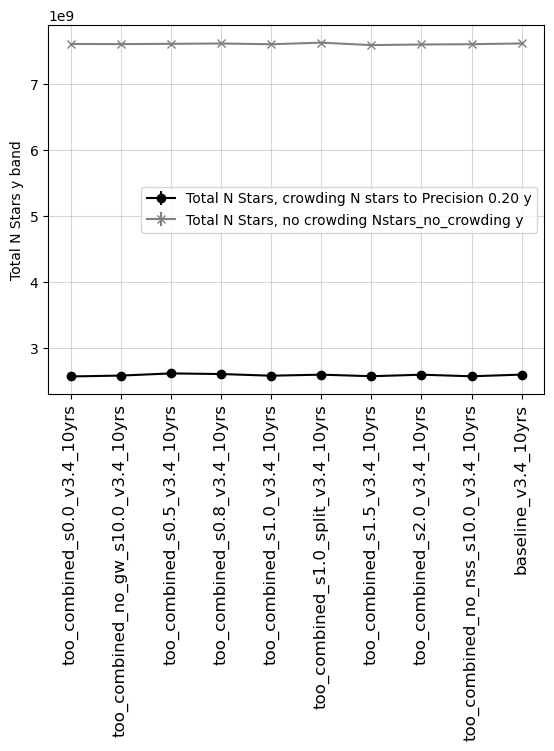

In [168]:
for f in 'ugrizy':
    metrics = [m for m in summaries if "Total N Stars" in m and f" {f} " in m]
    fig, ax = plt.subplots()
    for m, marker, color in zip(metrics, ['o', 'x'], ['black', 'gray']):
        ax.errorbar(list(rdict.values()), summaries.loc[runs, m], yerr=dev[m], 
                    color=color, marker=marker, linestyle='-', label=m.rstrip(' HealpixSlicer'))
    ax.legend()
    ax.set_ylabel(f"Total N Stars {f} band")
    ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
    ax.grid(True, alpha=0.5)

### Milky Way & Local Volume 
<a id="MWLV"></a>
Metrics for the local volume and milky way. These metrics tend to have a focus on galactic plane coverage, south celestial pole or SMC & LMC coverage. 


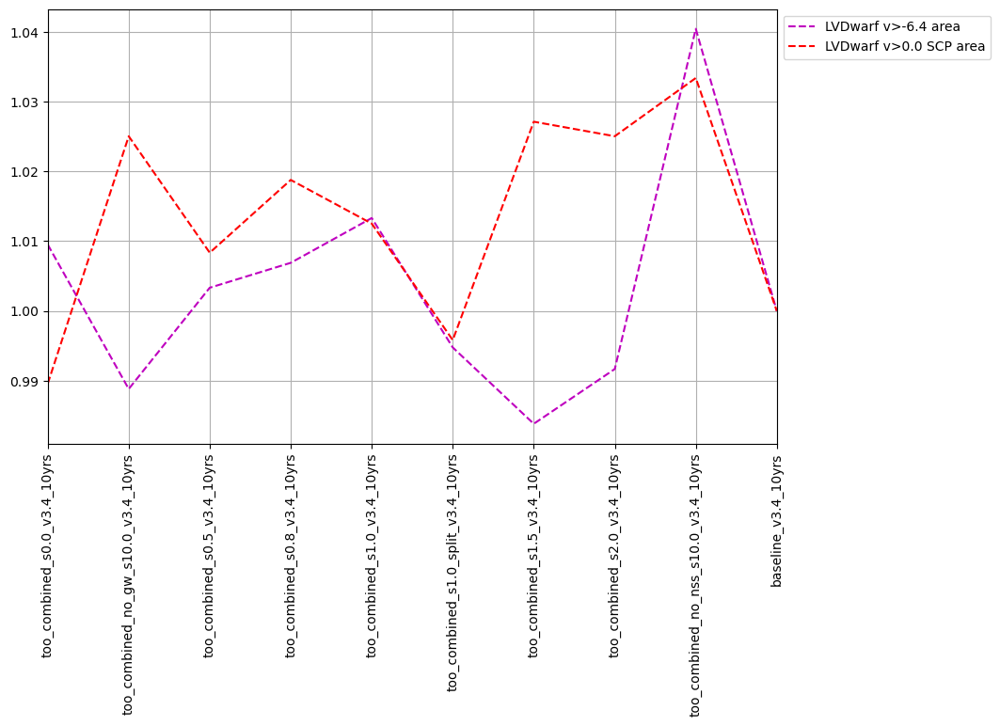

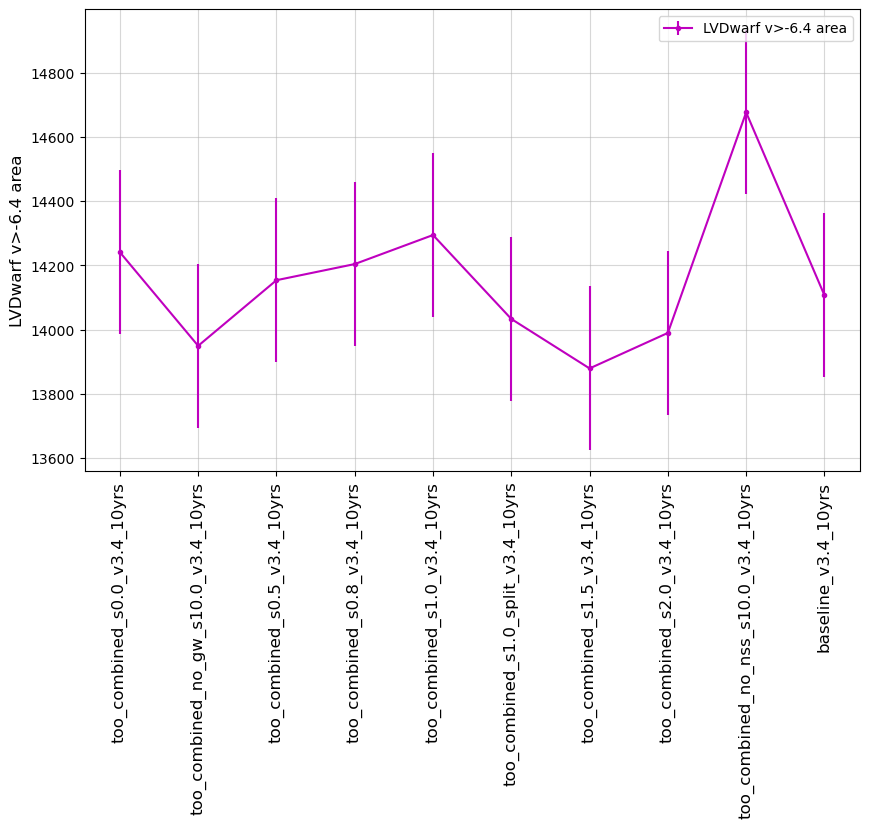

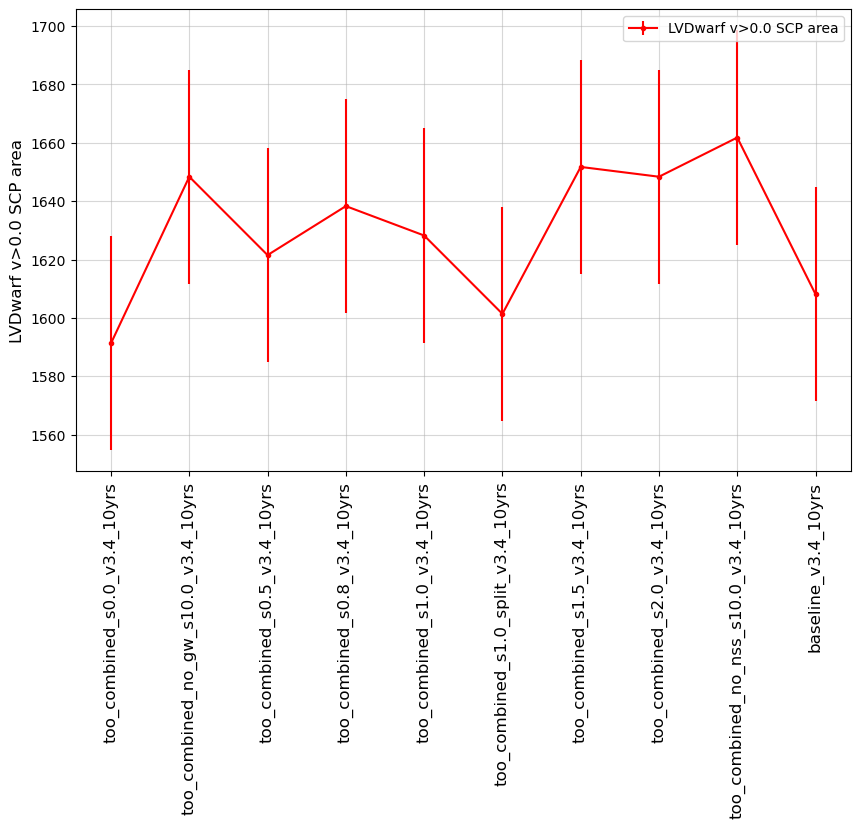

In [169]:
msub = metric_sets.loc['Local Volume']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_set=msub, sep_plots=True)

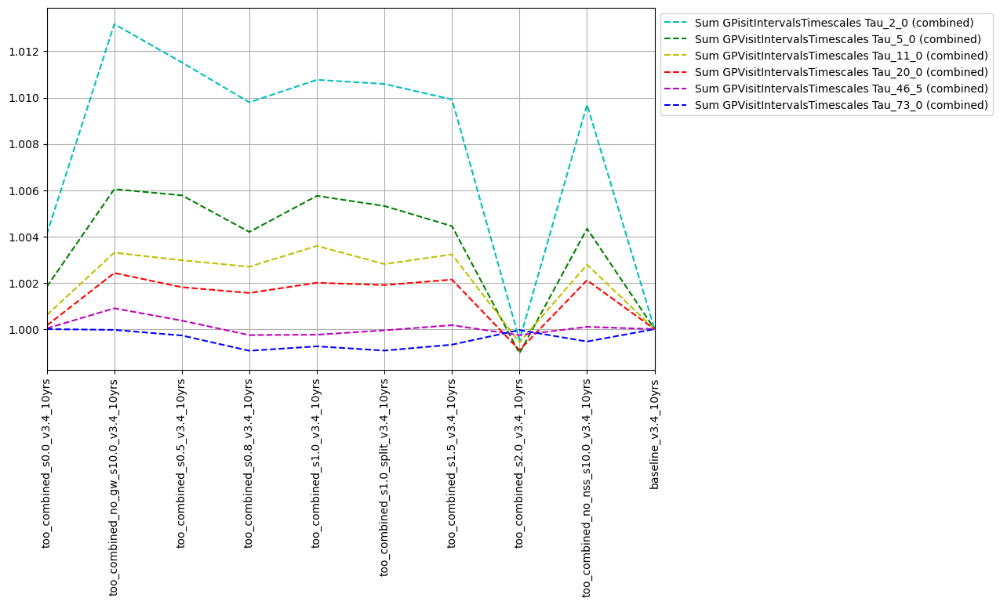

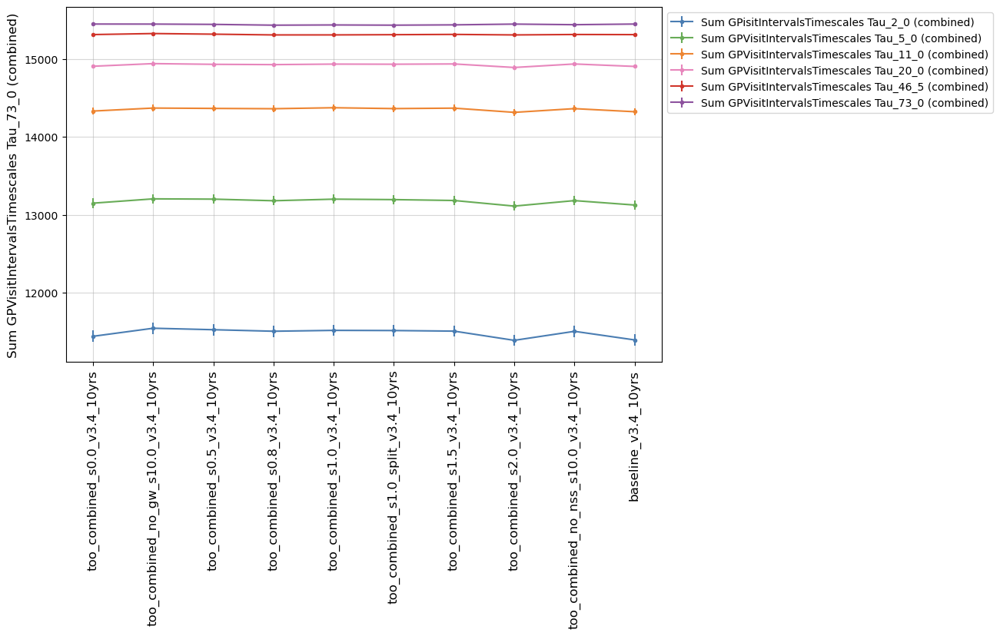

In [170]:
msub = metric_sets.loc['GP visit']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_set=msub, sep_plots=False)

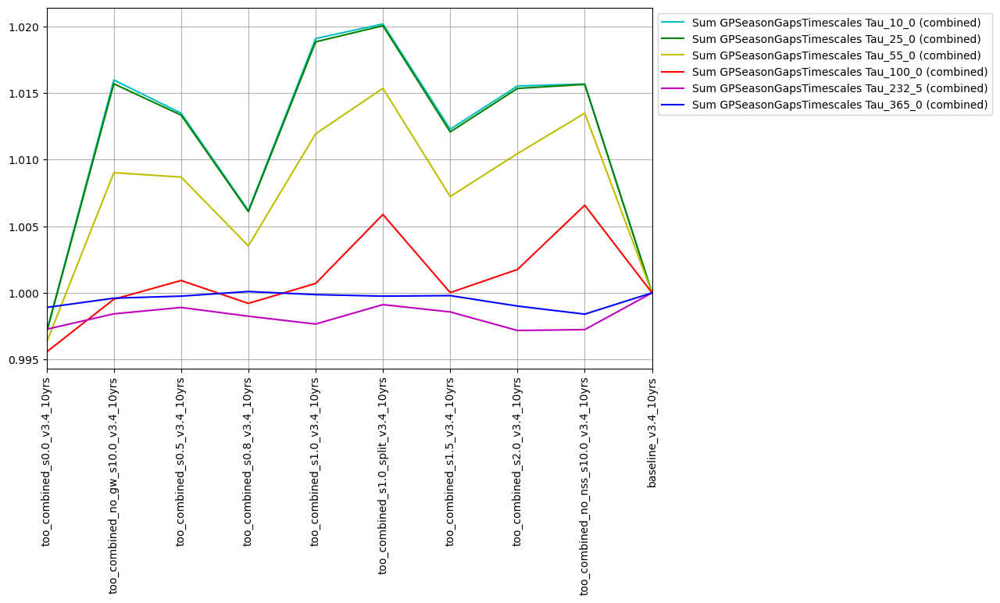

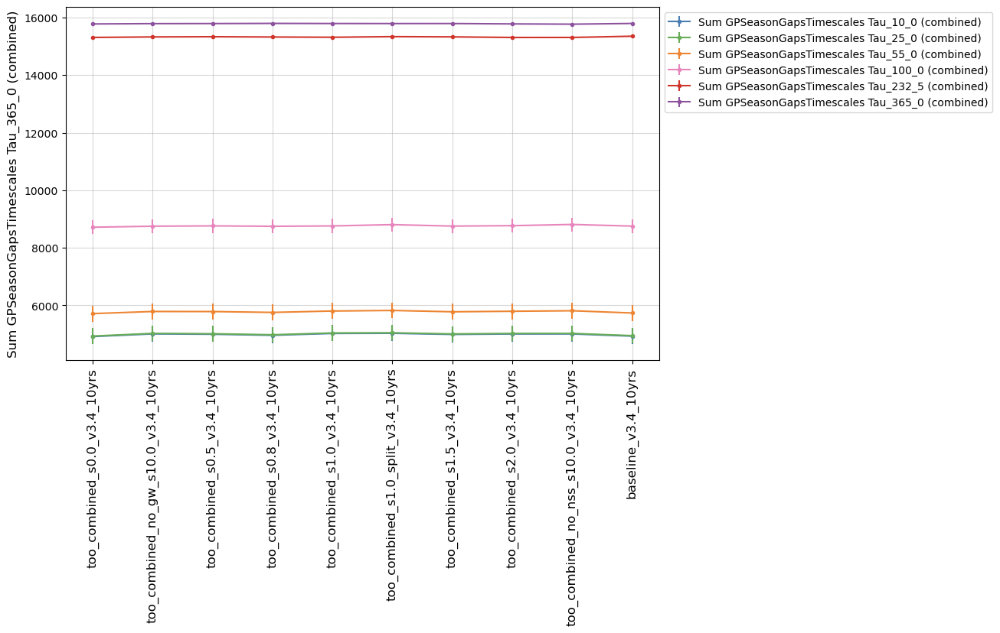

In [171]:
msub = metric_sets.loc['GP season']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_set=msub, sep_plots=False)

metric,Identity Number of Exposures UniSlicer,Identity Counts_DD:COSMOS UniSlicer,Identity Counts_DD:ECDFS UniSlicer,Identity Counts_DD:EDFS_a UniSlicer,Identity Counts_DD:EDFS_b UniSlicer,Identity Counts_DD:ELAISS1 UniSlicer,Identity Counts_DD:XMM_LSS UniSlicer
run,,,,,,,
too_combined_s0.0_v3.4_10yrs,2146349.0,41022.0,22250.0,11544.0,11505.0,20815.0,21685.0
too_combined_no_gw_s10.0_v3.4_10yrs,2144905.0,40916.0,22257.0,11537.0,11495.0,20821.0,21678.0
too_combined_s0.5_v3.4_10yrs,2136878.0,40814.0,22236.0,11544.0,11500.0,20822.0,21615.0
too_combined_s0.8_v3.4_10yrs,2136250.0,40772.0,22090.0,11453.0,11409.0,20822.0,21663.0
too_combined_s1.0_v3.4_10yrs,2136332.0,40867.0,22107.0,11466.0,11430.0,20820.0,21698.0
too_combined_s1.0_split_v3.4_10yrs,2136182.0,40952.0,22105.0,11449.0,11411.0,20819.0,21674.0
too_combined_s1.5_v3.4_10yrs,2132118.0,40829.0,22258.0,11534.0,11440.0,20810.0,21625.0
too_combined_s2.0_v3.4_10yrs,2126813.0,40607.0,22219.0,11542.0,11486.0,20824.0,21599.0
too_combined_no_nss_s10.0_v3.4_10yrs,2115236.0,40742.0,22114.0,11532.0,11495.0,20822.0,21639.0


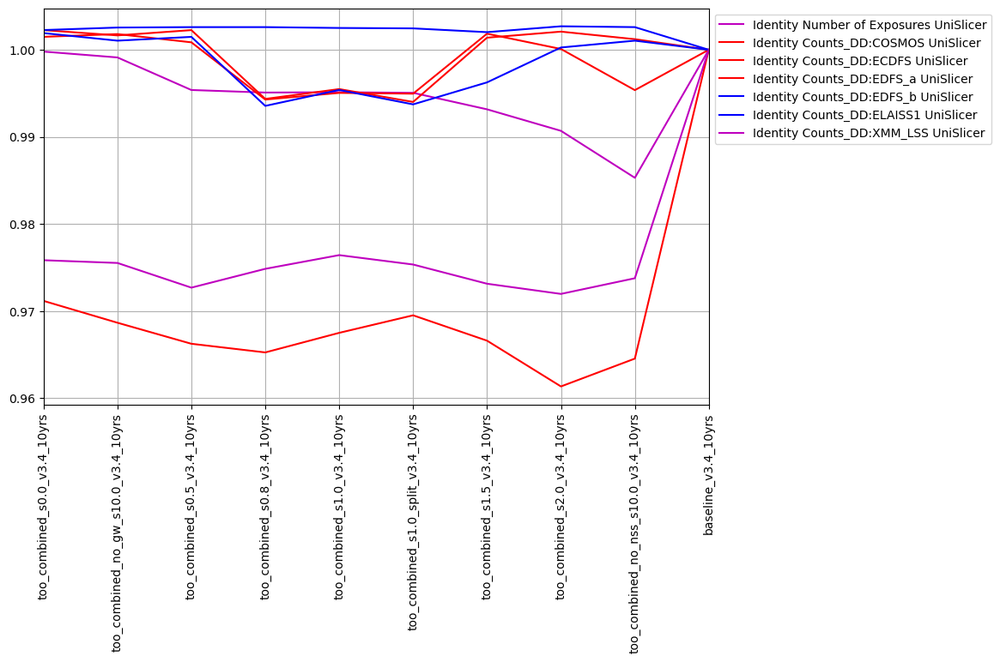

In [172]:
# First let's check the total number of visits in the DDFS, 
# as this has a significant impact on the depths and everything else. 
count_metrics = ['Identity Number of Exposures UniSlicer', 'Identity Counts_DD:COSMOS UniSlicer',
 'Identity Counts_DD:ECDFS UniSlicer',
 #'Identity Counts_DD:EDFS, a UniSlicer',
 #'Identity Counts_DD:EDFS, b UniSlicer',
 'Identity Counts_DD:EDFS_a UniSlicer',
 'Identity Counts_DD:EDFS_b UniSlicer',
 'Identity Counts_DD:ELAISS1 UniSlicer',
 #'Identity Counts_DD:XMM-LSS UniSlicer',
 'Identity Counts_DD:XMM_LSS UniSlicer']

baseline = 'baseline_v3.4_10yrs'

these_runs = ddf
fig, ax = maf.plot_run_metric(summaries.loc[runs, count_metrics],
                             baseline_run=baseline,
                              linestyles='-',
                              markers=[''],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=.05)
#ax.set_ylim(0.3, 1.8)

summaries.loc[runs, count_metrics]